In [1]:
# Copyright (c) Microsoft Corporation. All rights reserved.
# Licensed under the MIT License.
import pandas as pd
import numpy as np
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier as RF
from sklearn.metrics import roc_curve, roc_auc_score, f1_score
from sklearn.model_selection import train_test_split,RepeatedKFold,StratifiedShuffleSplit
from model import Selection
%matplotlib inline
import matplotlib.pyplot as plt
from collections import Counter

In [2]:
import os
os.makedirs("../../results/GC-diagnosis-model/Figures",exist_ok=True)
os.makedirs("../../results/GC-diagnosis-model/Figures/Clinical-Model-comparison",exist_ok=True)
os.makedirs("../../results/GC-diagnosis-model/Figures/Confusion-matrix",exist_ok=True)
os.makedirs("../../results/GC-diagnosis-model/Figures/Model-performance",exist_ok=True)
os.makedirs("../../results/GC-diagnosis-model/Saved-model/",exist_ok=True)

In [3]:
##### settings #####
rng_seed = 42 # control reproducibility
ran_sta = 3 
method = "lasso"
Counts=Counter()

In [4]:
def test(model, Xtest, ytest, metric='auc'):
    pred = model.predict(Xtest)
    prob = model.predict_proba(Xtest)
    print("ytest,pred:",ytest,pred)
    s = f1_score(ytest, pred)
    print("ytest,prob:",ytest,prob[:,-1])
    s1 = roc_auc_score(ytest, prob[:,-1])
    print("f1 score:", s)
    print("auroc score:", s1)
    return (s,s1)
         
def train_test(Xtrain, ytrain, Xtest, ytest, test_fn="RF", seed=12306, metric='auc'):
    model = RF(n_estimators=100,random_state=seed)
    model.fit(Xtrain, ytrain)
    print("evaluate on train set:")
    test(model, Xtrain, ytrain, metric)
    print("evaluate on test set:")
    s = test(model, Xtest, ytest, metric)
    return model, s

In [5]:
##### Feature selection #####
discovery_set=pd.read_excel('../../data/GC-diagnosis-model/discovery_set.xlsx',index_col=0)
discovery_set['state']=discovery_set.apply(lambda a:0 if a['type']=='N' else 1,axis=1)
labels=discovery_set['type']
plasma_df=discovery_set.copy()
batch1=plasma_df[(plasma_df['batch']=='batch1')]
batch1.reset_index(drop=True,inplace=True)
batch2=plasma_df[(plasma_df['batch']=='batch2')]
batch2.reset_index(drop=True,inplace=True)
batch3=plasma_df[plasma_df['batch']=='batch3']
batch3.reset_index(drop=True,inplace=True)

for i in range(0,10000):
    print("This is round %d"%(i))
    random_state=i
    split=StratifiedShuffleSplit(n_splits=1, test_size=0.33, random_state=random_state)
    for train_index, test_index in split.split(batch1,batch1['type']):
        batch1_train_set=batch1.loc[train_index]
        batch1_test_set=batch1.loc[test_index] 
    for train_index, test_index in split.split(batch2,batch2['type']):
        batch2_train_set=batch2.loc[train_index]
        batch2_test_set=batch2.loc[test_index] 
    for train_index, test_index in split.split(batch3,batch3['type']):
        batch3_train_set=batch3.loc[train_index]
        batch3_test_set=batch3.loc[test_index] 

    Xtrain_stratified=pd.concat([batch1_train_set,batch2_train_set,batch3_train_set],axis=0)
    Xtrain_stratified.reset_index(drop=True,inplace=True)
    Xtest_stratified=pd.concat([batch1_test_set,batch2_test_set,batch3_test_set],axis=0)
    Xtest_stratified.reset_index(drop=True,inplace=True)
    # Categorize the data
    ytrain_stratified=Xtrain_stratified['state']
    ytest_stratified=Xtest_stratified['state']
    # Discard unnecessary columns
    Xtrain_stratified.drop(['Batch','type','batch','state'],axis=1,inplace=True)
    Xtest_stratified.drop(['Batch','type','batch','state'],axis=1,inplace=True)

    Xtrain=Xtrain_stratified
    Xtest=Xtest_stratified
    ytrain=pd.DataFrame(ytrain_stratified)
    ytest=pd.DataFrame(ytest_stratified)

    Xtrain.drop(['sample_id'],axis=1,inplace=True)
    Xtest.drop(['sample_id'],axis=1,inplace=True)

    metas=list(Xtrain.columns)
    ytrain = np.array(ytrain.state)
    ytrain = ytrain.astype(np.float32)
    ytest = np.array(ytest.state)
    ytest = ytest.astype(np.float32)

    Xtrain=Xtrain.values
    Xtest=Xtest.values
    class ArgsClass:
        def __init__(self, k=5, alpha=0.05):
            self.k=k
            self.alpha=alpha
    args=ArgsClass(k=10, alpha=0.005)
    sel = Selection(method, args)
    sel.fit(Xtrain, ytrain)  # select on whole training set
    mb = sel.mb_
    #print("selected feature index: ", mb)
    #print("selected meta names: ", [metas[x] for x in mb])
    #print("with selected featues:")
    Counts=Counter(mb)+Counts

##### select top rank features #####
Counts_metas = pd.DataFrame(Counts.most_common(),columns=['metas_index',"counts"])
Counts_metas['metas'] = Counts_metas.apply(lambda a:metas[a['metas_index']],axis=1)
# 'Glycerate-2P_Glycerate-3P_neg-006','Citraconic acid_neg-025','Pyridoxine_pos-137','Argininosuccinic acid_pos-039'
# The above metabolites are excluded as characteristics due to poor peak shapes in mass spectrometry
Counts_metas_selected=Counts_metas[~Counts_metas['metas'].isin(['Glycerate-2P_Glycerate-3P_neg-006','Citraconic acid_neg-025','Pyridoxine_pos-137','Argininosuccinic acid_pos-039'])]
Counts_metas_selected.reset_index(drop=True,inplace=True)
Counts_metas=Counts_metas_selected
selected_feature_index=list(Counts_metas['metas_index'][0:10])

This is round 0
imp: 35.53654951657416
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 127 132 137 140]
over max_features [  4  15  66  78  80 100 127 132 137 140]
This is round 1
imp: 6.915616838578017
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 125 127 132 137 140]
over max_features [  4  78  80 100 110 125 127 132 137 140]
This is round 2
imp: 5.674435482531695
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 100 110 125 127 137 140]
over max_features [ 66  76  78  80 100 110 125 127 137 140]
This is round 3
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.m

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.770733766215806
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  31  66  78  80 100 127 132 137 140]
over max_features [ 15  31  66  78  80 100 127 132 137 140]
This is round 12
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 104 125 127 132 137 140]
This is round 13
imp: 11.208691683084302
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 125 127 132 137 140]
over max_features [  4  78  80  92 100 125 127 132 137 140]
This is round 14
imp: 5.632330152481517
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  79 100 125 127 137 140]
over max_features [  4  15  66

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.0234054272646835
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  86  92 100 111 127 132 137 140]
over max_features [ 45  78  86  92 100 111 127 132 137 140]
This is round 24
imp: 8.438178220481326
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 25
imp: 31.73245097273946
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  92 100 110 127 132 137 140]
over max_features [ 66  78  79  92 100 110 127 132 137 140]
This is round 26
imp: 2.0722630455101427
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.8733193468741076
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 111 125 127 137 140]
over max_features [ 66  78  80 100 110 111 125 127 137 140]
This is round 36
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 116 127 132 137 140]
This is round 37
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 132 137 140]
This is round 38
imp: 8.572007760450452
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 46  66  78  80  92 125 127 132 137 140]
over max_features [ 46  66  78  80  92 125 127 132 137 140]
This is round 39
imp: 17.20610778804739
sel: Sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 20.148484797293374
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  79 100 127 132 137 140]
over max_features [  0   4  66  78  79 100 127 132 137 140]
This is round 45
imp: 0.9264133047188833
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  86 110 125 127 137 140]
over max_features [ 45  66  78  80  86 110 125 127 137 140]
This is round 46
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 47
imp: 2.540758506607711
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 116 125 127 132 137 140]
over max_features [  4  78  8

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 31.566109934320462
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 100 110 127 132 137 140]
over max_features [  4  66  78  92 100 110 127 132 137 140]
This is round 54
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 132 137 140]
This is round 55
imp: 1.1583651576627945
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  76  78  80  86 100 125 127 137 140]
over max_features [  4  76  78  80  86 100 125 127 137 140]
This is round 56
imp: 0.44245677180134496
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  80  86 111 125 127 132 137 140]
over max_features [ 76  78 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  14  78 100 125 127 132 137 140]
This is round 65
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  92 100 125 127 132 137 140]
This is round 66
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86 125 132 137 140]
This is round 67
imp: 37.178906221789795
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  66  78  80 116 127 137 140]
over max_features [  0   4  15  66  78  80 116 127 137 140]
This is round 68
imp: 10.796143110227746
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86  92 100 125 127 137 140]
This is round 77
imp: 3.0516362106125117
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 104 110 127 132 137 140]
over max_features [ 78  80  86 100 104 110 127 132 137 140]
This is round 78
imp: 4.126260614396568
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 104 127 132 137 140]
over max_features [  0  66  78  80 100 104 127 132 137 140]
This is round 79
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 125 127 132 137 140]
This is round 80
imp: 4.699234078636691
sel: Sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86  92 127 132 137 140]
This is round 89
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 110 127 132 137 140]
This is round 90
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 137 140]
This is round 91
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  15  66  78  86 125 127 137 140]
This is round 92
imp: 2.656087732121774
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80  92 116 125 127 132 137 1

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 12.219263438232076
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 100 110 127 132 137 140]
over max_features [ 66  78  79  80 100 110 127 132 137 140]
This is round 102
imp: 4.831188700356444
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 125 127 132 137 140]
over max_features [ 45  66  78  80 100 125 127 132 137 140]
This is round 103
imp: 7.959986925244987
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  80 100 110 127 137 140]
over max_features [  4  45  66  78  80 100 110 127 137 140]
This is round 104
imp: 5.825166682616745
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
s

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86  92 125 127 132 137 140]
This is round 114
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 111 127 132 137 140]
This is round 115
imp: 6.757673661921979
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80  92 100 125 127 137 140]
over max_features [ 66  76  78  80  92 100 125 127 137 140]
This is round 116
imp: 5.7311171816813555
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  45  66  78  80 100 125 127 137 140]
over max_features [ 15  45  66  78  80 100 125 127 137 140]
This is round 117
imp: 5.485245046779628
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.2130793824753385
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  66  78  80 110 127 132 137 140]
over max_features [  0  45  66  78  80 110 127 132 137 140]
This is round 126
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 127
imp: 35.89372990878797
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  92 100 127 132 137 140]
over max_features [  0   4  66  78  92 100 127 132 137 140]
This is round 128
imp: 18.17784420902668
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  45  66  78  80 100 127 132 137 140]
over max_features [  2  45 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [ 15  66  78 100 110 127 132 137 140]
This is round 139
imp: 5.036181574325558
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 140
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 141
imp: 59.74680965788192
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  76  78  80 100 127 132 134 137 140]
over max_features [ 15  76  78  80 100 127 132 134 137 140]
This is round 142
imp: 3.100720756041357
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.086654832138344
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  80  92 100 125 127 132 137 140]
over max_features [  2  78  80  92 100 125 127 132 137 140]
This is round 157
imp: 2.918763116956124
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  78  80  86 125 127 132 137 140]
over max_features [  0  15  78  80  86 125 127 132 137 140]
This is round 158
imp: 48.337577478080526
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  76  78  80 100 110 127 137 140]
over max_features [  4  16  76  78  80 100 110 127 137 140]
This is round 159
imp: 12.190277762111087
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)


/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 67.31456964193934
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  76  78 100 110 127 132 137 140]
over max_features [  4  16  76  78 100 110 127 132 137 140]
This is round 176
imp: 33.199041290581796
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 104 110 127 137 140]
over max_features [ 66  78  80  92 100 104 110 127 137 140]
This is round 177
imp: 11.856018992716699
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 110 127 132 137 140]
over max_features [  0  66  78  80 100 110 127 132 137 140]
This is round 178
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 111 125 127 132 137 140]
This is round 192
imp: 0.5950984776417038
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80  86 125 127 132 137 140]
over max_features [  4  15  78  80  86 125 127 132 137 140]
This is round 193
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 132 137 140]
This is round 194
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 195
imp: 15.41841550914279
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.9788063317683962
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  80  86 110 125 127 132 137 140]
over max_features [ 76  78  80  86 110 125 127 132 137 140]
This is round 205
imp: 6.684972477588462
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  80 100 110 125 127 137 140]
over max_features [  4  45  78  80 100 110 125 127 137 140]
This is round 206
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 125 127 132 137 140]
This is round 207
imp: 3.352557079481267
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  78  80  92 100 110 125 127 137 140]
over max_features [ 14  78 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 125 127 132 137 140]
This is round 226
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86  92 100 125 127 137 140]
This is round 227
imp: 27.594280245285674
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  78  80 100 116 127 132 137 140]
over max_features [  0  45  78  80 100 116 127 132 137 140]
This is round 228
imp: 13.653505998650184
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  92 100 110 127 132 137 140]
over max_features [ 66  78  79  92 100 110 127 132 137 140]
This is round 229
imp: 0.0
sel: SelectFromModel(

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 100 110 125 127 132 137 140]
This is round 248
imp: 2.9294841666812492
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 65  78  80  92 100 110 127 132 137 140]
over max_features [ 65  78  80  92 100 110 127 132 137 140]
This is round 249
imp: 8.641587256108464
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  66  78 100 104 127 132 137 140]
over max_features [  2   4  66  78 100 104 127 132 137 140]
This is round 250
imp: 5.066334482783805
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 127 137 140]
This is round 270
imp: 6.773381974959823
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 125 127 137 140]
over max_features [  4  66  78  80  92 100 125 127 137 140]
This is round 271
imp: 2.4669542011382792
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 100 110 125 127 132 137 140]
over max_features [  0  78  80 100 110 125 127 132 137 140]
This is round 272
imp: 12.465138675241455
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  79  80 100 110 127 137 140]
over max_features [  4  66  78

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 125 127 132 137 140]
This is round 282
imp: 3.561154348600681
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 125 127 137 140]
over max_features [ 45  66  78  80 100 110 125 127 137 140]
This is round 283
imp: 48.41770088054848
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 127 132 137 140]
over max_features [  4  66  78  80  92 100 127 132 137 140]
This is round 284
imp: 2.662819462363973
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 104 110 127 132 137 140]
over max_features [ 66  78  80 1

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [  4  78  80 100 110 116 125 127 137 140]
over max_features [  4  78  80 100 110 116 125 127 137 140]
This is round 294
imp: 7.903373494500898
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  76  78  80 100 110 127 137 140]
over max_features [ 45  66  76  78  80 100 110 127 137 140]
This is round 295
imp: 4.781949333892206
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  79  80 100 116 132 137 140]
over max_features [  4  66  78  79  80 100 116 132 137 140]
This is round 296
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 137 140]
This is round 297
imp: 12.350501454834879
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 8.065691954828196
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 100 110 127 132 137 140]
over max_features [ 66  76  78  80 100 110 127 132 137 140]
This is round 305
imp: 10.563565680103078
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  80 100 110 127 132 137 140]
over max_features [  4  45  78  80 100 110 127 132 137 140]
This is round 306
imp: 2.535684877115176
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   2  66  78  80 100 125 127 137 140]
over max_features [  0   2  66  78  80 100 125 127 137 140]
This is round 307
imp: 5.506561672735782
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
s

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 100 125 127 132 137 140]
This is round 321
imp: 1.1511642514918963
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 104 110 125 127 132 137 140]
over max_features [ 78  80 100 104 110 125 127 132 137 140]
This is round 322
imp: 25.914027624603328
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 323
imp: 8.488230441895414
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 125 127 137 140]
over max_features [  4  66

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.239459469117018
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 342
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 111 127 132 137 140]
This is round 343
imp: 0.760310332639148
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 111 125 127 132 137 140]
over max_features [ 78  80  92 100 111 125 127 132 137 140]
This is round 344
imp: 0.5898367711571934
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 111 116 127 132 137 140]
over max_features [ 66  78 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 125 127 137 140]
This is round 355
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  31  66  78  92 127 132 137 140]
This is round 356
imp: 39.38429418613288
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  76  78  80 100 127 132 137 140]
over max_features [ 15  66  76  78  80 100 127 132 137 140]
This is round 357
imp: 3.4302598805624114
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  16  76  78  92 100 127 132 137 140]
over max_features [ 15  16  76  78  92 100 127 132 137 140]
This is round 358
imp: 1.5581128169209018
sel: Select

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.328115763813075
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 111 116 127 132 137 140]
over max_features [ 78  80 100 110 111 116 127 132 137 140]
This is round 367
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 111 127 132 137 140]
This is round 368
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  66  78 100 125 127 137 140]
This is round 369
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 132 137 140]
This is round 370
imp: 0.9710348176241211
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
   

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.8397395946184396
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 111 127 132 137 140]
over max_features [ 66  78  80 100 110 111 127 132 137 140]
This is round 379
imp: 2.965247790147853
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86  92 125 127 132 137 140]
over max_features [ 66  78  80  86  92 125 127 132 137 140]
This is round 380
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 100 125 127 137 140]
This is round 381
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 111 132 137 140]
This is round 382
imp: 0.49949179618951395
sel: Selec

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.040529534170877
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 110 125 127 132 137 140]
over max_features [ 15  66  78  80 110 125 127 132 137 140]
This is round 394
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80  86 125 132 137 140]
This is round 395
imp: 6.39998654376069
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  45  66  78  92 127 137 140]
over max_features [  0   4  15  45  66  78  92 127 137 140]
This is round 396
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  79  86 100 125 127 132 137 140]
This is round 397
imp: 7.023101320673794
sel: Selec

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 132 137 140]
This is round 410
imp: 7.2182458273651005
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 411
imp: 34.56766757320111
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 412
imp: 0.1633502721032165
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 111 125 127 132 137 140]
over max_features [ 66  76

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.0495075792528434
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 104 110 127 132 137 140]
over max_features [ 78  80  86 100 104 110 127 132 137 140]
This is round 426
imp: 24.96517744114668
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 127 132 137 140]
over max_features [  4  15  66  78  80 100 127 132 137 140]
This is round 427
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 137 140]
This is round 428
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 134 137 140]
This is round 429
imp: 0.20318414426648754
sel: S

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 31.870778247212794
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80 100 110 127 132 137 140]
over max_features [  2  66  78  80 100 110 127 132 137 140]
This is round 440
imp: 0.864343258426361
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 441
imp: 25.383564697159063
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 110 116 127 132 137 140]
over max_features [ 45  78  80 100 110 116 127 132 137 140]
This is round 442
imp: 2.484349306263852
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)


/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 8.124313606426327
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 125 127 132 137 140]
over max_features [  4  78  80  92 100 125 127 132 137 140]
This is round 454
imp: 1.433652454073087
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86 111 127 132 137 140]
over max_features [ 15  66  78  80  86 111 127 132 137 140]
This is round 455
imp: 3.039814785212344
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 110 127 132 137 140]
over max_features [  4  66  78  80  92 110 127 132 137 140]
This is round 456
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  79  80  92 127 132 137 140]
This is round 470
imp: 28.458251444418813
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  79  80 110 127 132 137 140]
over max_features [ 45  66  78  79  80 110 127 132 137 140]
This is round 471
imp: 0.7678112283683545
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 110 111 125 132 137 140]
over max_features [ 78  80  92 100 110 111 125 132 137 140]
This is round 472
imp: 7.454807602997383
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 110 127 137 140]
over max_features [  4  66  78

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.7014609334643982
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   2  66  78  80 111 127 132 137 140]
over max_features [  0   2  66  78  80 111 127 132 137 140]
This is round 491
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 110 125 127 137 140]
This is round 492
imp: 47.42713887112151
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  76  78  80  92 127 132 137 140]
over max_features [  0  66  76  78  80  92 127 132 137 140]
This is round 493
imp: 5.470352298491828
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78 100 110 125 127 132 137 140]
over max_features [ 15  66 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 43.14334181442676
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 127 132 134 137 140]
over max_features [  4  66  78  80 100 127 132 134 137 140]
This is round 510
imp: 5.857043945496389
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  80 100 110 125 127 132 137 140]
over max_features [ 76  78  80 100 110 125 127 132 137 140]
This is round 511
imp: 1.5173984668637779
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  86  92 127 132 137 140]
over max_features [  0  66  78  80  86  92 127 132 137 140]
This is round 512
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.9441175338794308
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 524
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  80 100 110 125 132 137 140]
This is round 525
imp: 7.029987792030143
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  92 110 125 127 137 140]
over max_features [ 45  66  78  80  92 110 125 127 137 140]
This is round 526
imp: 0.5603558133935913
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  78  80 110 125 127 132 134 137 140]
over max_features [ 14  78

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.9647258768983011
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80 100 111 125 127 132 137 140]
over max_features [ 15  78  80 100 111 125 127 132 137 140]
This is round 537
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86  92 100 125 127 132 137 140]
This is round 538
imp: 1.0831274976112375
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 127 132 137 140]
over max_features [ 66  78  80  86 100 110 127 132 137 140]
This is round 539
imp: 8.796752988609123
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 116 127 132 137 140]
over max_features [ 45  66

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78 100 127 132 137 140]
This is round 552
imp: 4.313648392402986
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  69  78  80 100 125 127 137 140]
over max_features [  0  66  69  78  80 100 125 127 137 140]
This is round 553
imp: 5.887367720331718
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  92 100 110 125 127 132 137 140]
over max_features [  4  78  92 100 110 125 127 132 137 140]
This is round 554
imp: 0.33769416212327996
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  79  80  86 100 116 125 127 137 140]
over max_features [ 78  79  80  86 100

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 127 132 137 140]
This is round 568
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 110 111 127 132 137 140]
This is round 569
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78 111 127 132 137 140]
This is round 570
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 111 127 132 137 140]
This is round 571
imp: 1.8351024861178316
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 111 127 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.4166196219210394
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  79  80 100 110 125 127 137 140]
over max_features [  0  78  79  80 100 110 125 127 137 140]
This is round 584
imp: 7.762978105103114
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  66  78  80 110 127 132 137 140]
over max_features [  2   4  66  78  80 110 127 132 137 140]
This is round 585
imp: 0.8563681004928106
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 31  66  78  86 110 111 127 132 137 140]
over max_features [ 31  66  78  86 110 111 127 132 137 140]
This is round 586
imp: 20.336813995359435
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 125 127 137 140]
This is round 598
imp: 22.985136235941464
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  79  80 100 110 116 137 140]
over max_features [ 15  66  78  79  80 100 110 116 137 140]
This is round 599
imp: 2.54840362559049
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78  80 100 125 127 132 137 140]
over max_features [  0   4  78  80 100 125 127 132 137 140]
This is round 600
imp: 2.3883547507916094
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 127 132 134 137 140]
over max_features [ 78  80 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.7807381756403753
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  86 125 127 132 137 140]
over max_features [  0  66  78  80  86 125 127 132 137 140]
This is round 612
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 137 140]
This is round 613
imp: 24.417379876374824
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  76  78  80 100 116 127 137 140]
over max_features [  0   4  76  78  80 100 116 127 137 140]
This is round 614
imp: 1.4055813400858963
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 104 127 132 137 140]
over max_features [ 66  78  8

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80 100 125 127 132 137 140]
This is round 627
imp: 7.484682198047004
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 125 127 137 140]
over max_features [  4  66  78  80 100 110 125 127 137 140]
This is round 628
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  78  80 110 125 127 132 137 140]
This is round 629
imp: 97.94486337098786
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  16  66  76  78 100 127 132 137 140]
over max_features [ 15  16  66  76  78 100 127 132 137 140]
This is round 630
imp: 0.9771211710056109
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.079235334461578
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 116 127 132 137 140]
over max_features [  0  66  78  80 100 116 127 132 137 140]
This is round 642
imp: 1.333804860056839
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80  86  92 100 125 127 137 140]
over max_features [  0  78  80  86  92 100 125 127 137 140]
This is round 643
imp: 0.1775105524327965
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  76  78  80 100 125 127 137 140]
over max_features [ 14  66  76  78  80 100 125 127 137 140]
This is round 644
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 20.745065047976844
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  66  78  80 100 127 137 140]
over max_features [  0   4  15  66  78  80 100 127 137 140]
This is round 658
imp: 1.8105002332381273
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80  92 100 125 127 132 137 140]
over max_features [  0  78  80  92 100 125 127 132 137 140]
This is round 659
imp: 14.38727121390674
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  79  80 100 127 132 137 140]
over max_features [ 66  76  78  79  80 100 127 132 137 140]
This is round 660
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.4919878419212997
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  31  78  80  86 125 127 132 137 140]
over max_features [ 15  31  78  80  86 125 127 132 137 140]
This is round 674
imp: 4.885576806913869
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  92 100 116 125 127 137 140]
over max_features [ 15  78  80  92 100 116 125 127 137 140]
This is round 675
imp: 28.408797793598005
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  80 100 127 132 137 140]
over max_features [  0  15  66  78  80 100 127 132 137 140]
This is round 676
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.429428599064023
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  92 100 125 127 132 137 140]
over max_features [ 45  78  80  92 100 125 127 132 137 140]
This is round 689
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 125 127 132 137 140]
This is round 690
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 125 127 132 137 140]
This is round 691
imp: 20.726858229899037
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 692
imp: 76.10631804483525
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78 110 125 127 132 137 140]
This is round 704
imp: 10.001193576542828
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  52  66  78  80 100 127 132 137 140]
over max_features [ 15  52  66  78  80 100 127 132 137 140]
This is round 705
imp: 0.6505664634867675
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  80  86 100 125 127 132 137 140]
over max_features [ 76  78  80  86 100 125 127 132 137 140]
This is round 706
imp: 2.7890171241082466
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  14  66  78  92 125 127 132 137 140]
over max_features [  4  14  6

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.67919575853763
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 719
imp: 2.016013990772121
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 110 116 125 127 137 140]
over max_features [ 45  78  80 100 110 116 125 127 137 140]
This is round 720
imp: 12.097891495797084
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  76  78 100 116 127 132 137 140]
over max_features [  0  66  76  78 100 116 127 132 137 140]
This is round 721
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [  4  66  78  80  92 100 127 132 137 140]
over max_features [  4  66  78  80  92 100 127 132 137 140]
This is round 733
imp: 3.5488345064162257
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  15  78  80 110 125 127 132 137 140]
over max_features [  2  15  78  80 110 125 127 132 137 140]
This is round 734
imp: 0.7688370393999783
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 111 125 127 132 137 140]
over max_features [ 78  80  86 100 111 125 127 132 137 140]
This is round 735
imp: 1.2719163350329497
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 116 125 127 132 137 140]
over max_features [ 66  78  80  86 116 125 127 132 137 140]
This is round 736
imp: 0.0
sel: SelectF

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 127 132 137 140]
This is round 747
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 116 125 127 132 137 140]
This is round 748
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  78  79  80 127 132 137 140]
This is round 749
imp: 8.4884239720168
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  45  66  78 100 110 127 132 137 140]
over max_features [ 16  45  66  78 100 110 127 132 137 140]
This is round 750
imp: 6.137002915351976
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
      

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  79  80 100 125 127 137 140]
This is round 762
imp: 0.9514903688358242
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86 125 127 132 137 140]
over max_features [ 15  66  78  80  86 125 127 132 137 140]
This is round 763
imp: 0.07516516805575015
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  78  80 100 125 127 132 137 140]
over max_features [ 14  66  78  80 100 125 127 132 137 140]
This is round 764
imp: 10.103504261035539
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  16  66  78  80  92 127 132 137 140]
over max_features [  0  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.0576680118019537
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 52  66  78  80  92 100 127 132 137 140]
over max_features [ 52  66  78  80  92 100 127 132 137 140]
This is round 777
imp: 0.4029914333384617
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80  86 100 125 127 137 140]
over max_features [  2  66  78  80  86 100 125 127 137 140]
This is round 778
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 137 140]
This is round 779
imp: 1.4690116235737902
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  79  80 100 110 125 127 132 137 140]
over max_features [ 78  79  80 10

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.056049328208999
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 100 110 125 127 132 137 140]
over max_features [  4  66  78 100 110 125 127 132 137 140]
This is round 791
imp: 1.8856150496054265
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 792
imp: 0.7897709213577809
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  66  78  80 100 116 127 137 140]
over max_features [  0  45  66  78  80 100 116 127 137 140]
This is round 793
imp: 13.726111974134144
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  86 100 125 127 132 137 140]
This is round 805
imp: 1.103901654011654
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86 100 125 127 137 140]
over max_features [ 15  66  78  80  86 100 125 127 137 140]
This is round 806
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 132 137 140]
This is round 807
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 127 132 137 140]
This is round 808
imp: 2.7971290518055705
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
               

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 12.894620198900821
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  79  80 100 127 132 137 140]
over max_features [  4  66  78  79  80 100 127 132 137 140]
This is round 826
imp: 35.0947933089508
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  79  80 100 116 132 137 140]
over max_features [ 15  66  78  79  80 100 116 132 137 140]
This is round 827
imp: 58.61328121677384
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 100 110 127 132 137 140]
over max_features [  4  66  78  92 100 110 127 132 137 140]
This is round 828
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 110 125 127 137 140]
This is round 848
imp: 6.087986573449045
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 134 137 140]
over max_features [ 66  78  80 100 125 127 132 134 137 140]
This is round 849
imp: 108.77988297570958
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 100 117 127 132 137 140]
over max_features [  4  66  78  92 100 117 127 132 137 140]
This is round 850
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 100 125 127 132 137 140]
This is round 851
imp: 0.9843245931313894
sel: Se

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 132 137 140]
This is round 869
imp: 34.03002824178168
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 870
imp: 9.175673819941071
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 125 127 137 140]
over max_features [ 66  78  80  92 100 110 125 127 137 140]
This is round 871
imp: 6.499929530826134
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 127 132 137 140]
over max_features [ 66  78  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 17.877780085958676
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 100 127 132 137 140]
over max_features [  0   4  66  78  80 100 127 132 137 140]
This is round 885
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 110 125 127 137 140]
This is round 886
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78 100 127 132 137 140]
This is round 887
imp: 3.8856142764009167
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 125 127 132 137 140]
over max_features [ 15  66  78  80 100 125 127 132 137 140]
This is round 888
imp: 25.36064860854472
sel: SelectFromMode

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 23.363537281302136
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  92 100 110 127 132 137 140]
over max_features [ 45  66  78  92 100 110 127 132 137 140]
This is round 894
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 132 137 140]
This is round 895
imp: 8.303296065088784
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  92 100 110 132 137 140]
over max_features [  0  66  78  80  92 100 110 132 137 140]
This is round 896
imp: 1.98854117696482
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  86 125 127 132 137 140]
over max_features [ 45  66  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.096460423526799
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 125 127 132 137 140]
over max_features [  4  78  80  92 100 125 127 132 137 140]
This is round 903
imp: 6.390158169955345
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  80  92 100 110 125 127 137 140]
over max_features [ 76  78  80  92 100 110 125 127 137 140]
This is round 904
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 116 127 132 137 140]
This is round 905
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 127 132 137 140]
This is round 906
imp: 1.6869824774418605
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.6503731808970254
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 116 127 132 137 140]
over max_features [ 15  66  78  80 100 116 127 132 137 140]
This is round 914
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 127 132 137 140]
This is round 915
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 125 137 140]
This is round 916
imp: 1.7212808628320448
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86 100 125 127 137 140]
over max_features [ 15  66  78  80  86 100 125 127 137 140]
This is round 917
imp: 4.762853319740286
sel: SelectFrom

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 35.96391545145764
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  80 100 127 132 137 140]
over max_features [  0  15  66  78  80 100 127 132 137 140]
This is round 931
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  86 110 127 132 137 140]
This is round 932
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 125 127 132 137 140]
This is round 933
imp: 0.5767951337643377
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  79  80  86 100 125 127 137 140]
over max_features [  4  78  79  80  86 100 125 127 137 140]
This is round 934
imp: 3.8081239616559692
sel: Se

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 8.109398848350478
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  80 100 116 125 127 137 140]
over max_features [  4  45  78  80 100 116 125 127 137 140]
This is round 947
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 31  78  80 111 125 127 132 137 140]
This is round 948
imp: 6.445880507636107
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 949
imp: 0.40732659367673696
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 127 132 137 140]
over max_features [ 66  78

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.760227147048112
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 125 127 132 137 140]
over max_features [ 45  66  78  80 100 125 127 132 137 140]
This is round 960
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  78  86 100 111 127 132 137 140]
This is round 961
imp: 64.27989401867084
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  92 100 110 127 132 137 140]
over max_features [  4  15  78  92 100 110 127 132 137 140]
This is round 962
imp: 0.9727060350861353
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  80  86 100 125 127 132 137 140]
over max_features [  2  78 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 132 137 140]
This is round 973
imp: 3.560148576867886
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  79  80 100 110 125 127 137 140]
over max_features [ 76  78  79  80 100 110 125 127 137 140]
This is round 974
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  78  80  86 125 127 132 137 140]
This is round 975
imp: 9.836803347985557
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  45  66  78  80 100 116 127 137 140]
over max_features [ 15  45  66  78  80 100 116 127 137 140]
This is round 976
imp: 0.0
sel: SelectFromMode

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 110 125 127 132 137 140]
This is round 985
imp: 24.583125106366836
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 104 110 116 137 140]
over max_features [  0  66  78  80 100 104 110 116 137 140]
This is round 986
imp: 1.3923862576344133
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86 100 125 127 137 140]
over max_features [  4  66  78  80  86 100 125 127 137 140]
This is round 987
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 116 127 132 137 140]
This is round 988
imp: 1.988487798555943
sel: Se

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 100 110 127 132 137 140]
This is round 997
imp: 20.28831636241193
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 116 127 132 137 140]
over max_features [ 66  78  80  92 100 116 127 132 137 140]
This is round 998
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  66  78  80 100 125 127 137 140]
This is round 999
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  92 100 125 127 132 137 140]
This is round 1000
imp: 5.46688685465735
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
    

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 110 127 132 137 140]
This is round 1009
imp: 1.187329499097375
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86  92 125 127 132 137 140]
over max_features [ 66  78  80  86  92 125 127 132 137 140]
This is round 1010
imp: 6.494681279143068
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  80 100 127 132 134 137 140]
over max_features [  4  45  78  80 100 127 132 134 137 140]
This is round 1011
imp: 36.68884121479363
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 116 127 132 137 140]
over max_features [ 66  78  8

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 31.839559168529533
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  76  78  80 100 127 132 137 140]
over max_features [  2   4  76  78  80 100 127 132 137 140]
This is round 1031
imp: 20.72565576973438
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  92 110 127 132 137 140]
over max_features [  0  66  78  80  92 110 127 132 137 140]
This is round 1032
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  78  80 110 127 132 137 140]
This is round 1033
imp: 8.652605397140677
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 125 127 137 140]
over max_features [  4  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 43.03311395544138
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 127 132 137 140]
over max_features [  4  15  66  78  80 100 127 132 137 140]
This is round 1053
imp: 28.123388298471856
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  76  78  92 100 127 132 137 140]
over max_features [  0   4  76  78  92 100 127 132 137 140]
This is round 1054
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  79 111 116 132 137 140]
This is round 1055
imp: 4.4058833686460614
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 110 125 127 132 137 140]
over max_features [ 15  66 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.003123383629446
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 100 111 116 127 132 137 140]
over max_features [  4  66  78 100 111 116 127 132 137 140]
This is round 1071
imp: 9.231832178908894
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  79  80 100 127 132 137 140]
over max_features [  0  66  78  79  80 100 127 132 137 140]
This is round 1072
imp: 36.7525862504409
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  76  78 100 110 117 127 137 140]
over max_features [  2  66  76  78 100 110 117 127 137 140]
This is round 1073
imp: 97.78728096354337
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)


/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80  86 125 127 137 140]
This is round 1085
imp: 17.010404022377262
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 116 127 132 137 140]
over max_features [ 66  78  80 100 110 116 127 132 137 140]
This is round 1086
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 125 127 132 137 140]
This is round 1087
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  79  86 100 127 132 137 140]
This is round 1088
imp: 0.09667964685302113
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 11.530177136970384
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 116 127 132 137 140]
over max_features [ 66  78  80 100 110 116 127 132 137 140]
This is round 1100
imp: 6.238583753665715
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  45  78  80 100 127 132 137 140]
over max_features [  0  15  45  78  80 100 127 132 137 140]
This is round 1101
imp: 12.84947359489064
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  66  78 100 127 132 137 140]
over max_features [  0   4  15  66  78 100 127 132 137 140]
This is round 1102
imp: 43.77903101185052
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 125 132 137 140]
This is round 1114
imp: 0.062098855096426174
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 110 125 127 132 137 140]
over max_features [ 45  66  78  80 110 125 127 132 137 140]
This is round 1115
imp: 5.091437126661583
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  16  66  78  80 125 127 132 137 140]
over max_features [ 15  16  66  78  80 125 127 132 137 140]
This is round 1116
imp: 27.24057535397368
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  16  66  78  80  92 127 132 137 140]
over max_features [ 15

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 36.27076369547974
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 110 127 132 137 140]
over max_features [  4  78  80  92 100 110 127 132 137 140]
This is round 1130
imp: 2.1536045716495082
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80  86 125 127 137 140]
over max_features [  4  15  66  78  80  86 125 127 137 140]
This is round 1131
imp: 14.468665343054258
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  45  66  78  92 100 127 137 140]
over max_features [  4  16  45  66  78  92 100 127 137 140]
This is round 1132
imp: 1.5461931313800605
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.6205723340101597
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80  86 100 125 127 132 137 140]
over max_features [  0  78  80  86 100 125 127 132 137 140]
This is round 1145
imp: 0.46107580587090335
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80 100 110 125 127 132 137 140]
over max_features [ 15  78  80 100 110 125 127 132 137 140]
This is round 1146
imp: 3.3367933173122504
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80 100 110 125 127 132 137 140]
over max_features [ 15  78  80 100 110 125 127 132 137 140]
This is round 1147
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 28.135121569760333
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  66  78  80 127 132 137 140]
over max_features [  0   4  15  66  78  80 127 132 137 140]
This is round 1159
imp: 2.9934957822788157
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 100 110 116 125 127 137 140]
over max_features [  0  78  80 100 110 116 125 127 137 140]
This is round 1160
imp: 3.5544910222364097
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 1161
imp: 2.22137916608923
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.0560964789014244
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  78  80 100 111 116 127 132 137 140]
over max_features [ 16  78  80 100 111 116 127 132 137 140]
This is round 1173
imp: 3.7182634882836267
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  92 100 110 127 132 137 140]
over max_features [ 45  66  78  92 100 110 127 132 137 140]
This is round 1174
imp: 14.189151755302623
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  92 100 110 127 137 140]
over max_features [  0  66  78  80  92 100 110 127 137 140]
This is round 1175
imp: 10.382921168547382
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.03391057692286584
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86 111 125 127 137 140]
over max_features [ 15  66  78  80  86 111 125 127 137 140]
This is round 1187
imp: 25.2849709992275
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78  80  92 100 127 132 137 140]
over max_features [  0   4  78  80  92 100 127 132 137 140]
This is round 1188
imp: 4.88929227106501
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 125 127 132 137 140]
over max_features [  4  78  80  92 100 125 127 132 137 140]
This is round 1189
imp: 19.960664414349502
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 125 127 132 137 140]
This is round 1206
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 132 137 140]
This is round 1207
imp: 1.0031255142496995
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86 110 125 132 137 140]
over max_features [  4  66  78  80  86 110 125 132 137 140]
This is round 1208
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 100 111 125 137 140]
This is round 1209
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                m

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 7.770624534547071
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 116 125 127 137 140]
over max_features [  4  78  80  92 100 116 125 127 137 140]
This is round 1228
imp: 42.438119043257515
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 100 110 127 132 137 140]
over max_features [  4  66  78  92 100 110 127 132 137 140]
This is round 1229
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  45  78  80  86 125 127 137 140]
This is round 1230
imp: 6.236701454571479
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  92 100 110 111 116 127 132 137 140]
over max_features [ 78  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.05831755552373522
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  86 100 111 127 132 137 140]
over max_features [  4  66  78  86 100 111 127 132 137 140]
This is round 1243
imp: 1.5923106851915183
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 116 125 132 137 140]
over max_features [  4  66  78  80  92 116 125 132 137 140]
This is round 1244
imp: 11.065617191195434
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  92 100 116 127 132 137 140]
over max_features [  4  45  78  92 100 116 127 132 137 140]
This is round 1245
imp: 1.6477601094828906
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.43792925117502
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  76  78  80 100 110 125 132 137 140]
over max_features [  4  76  78  80 100 110 125 132 137 140]
This is round 1256
imp: 0.5266973191773442
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  86 100 110 127 132 137 140]
over max_features [  4  15  78  86 100 110 127 132 137 140]
This is round 1257
imp: 0.4889030305024794
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 125 127 132 137 140]
over max_features [ 78  80  86 100 110 125 127 132 137 140]
This is round 1258
imp: 1.9922506048676618
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [  2   4  66  78  80  92 100 125 137 140]
over max_features [  2   4  66  78  80  92 100 125 137 140]
This is round 1270
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86 100 125 127 132 137 140]
This is round 1271
imp: 2.39443095047167
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  15  66  78  80 100 127 132 137 140]
over max_features [ 14  15  66  78  80 100 127 132 137 140]
This is round 1272
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  80 100 125 127 132 137 140]
This is round 1273
imp: 21.67290764860031
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  8

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [  4  78 100 110 111 125 127 132 137 140]
over max_features [  4  78 100 110 111 125 127 132 137 140]
This is round 1284
imp: 6.552176019950184
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 110 116 125 127 137 140]
over max_features [ 78  80  92 100 110 116 125 127 137 140]
This is round 1285
imp: 0.8828501052955352
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 31  78  80 100 110 125 127 132 137 140]
over max_features [ 31  78  80 100 110 125 127 132 137 140]
This is round 1286
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 132 137 140]
This is round 1287
imp: 12.655377236441383
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 100 127 132 137 140]
This is round 1300
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  86 100 125 127 137 140]
This is round 1301
imp: 4.294368398506083
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  92 100 110 127 132 137 140]
over max_features [ 45  66  78  92 100 110 127 132 137 140]
This is round 1302
imp: 21.920212880614276
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 110 127 132 137 140]
over max_features [  0  66  78  80 100 110 127 132 137 140]
This is round 1303
imp: 40.6475550581845
sel: 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 13.459528718398612
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  80 100 127 132 137 140]
over max_features [  4  45  66  78  80 100 127 132 137 140]
This is round 1315
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  79  86 100 125 127 132 137 140]
This is round 1316
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 127 132 137 140]
This is round 1317
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 132 137 140]
This is round 1318
imp: 9.915084415845834
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.5352489626042736
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 1328
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 100 110 125 127 137 140]
This is round 1329
imp: 0.8339753499469507
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  86  92 100 125 127 132 137 140]
over max_features [ 66  78  86  92 100 125 127 132 137 140]
This is round 1330
imp: 4.020007867079157
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80  92 116 125 127 132 137 140]
over max_features [  0  78 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [  4  66  78  80  86 100 125 127 137 140]
over max_features [  4  66  78  80  86 100 125 127 137 140]
This is round 1342
imp: 4.873502580355874
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 116 125 127 132 137 140]
over max_features [ 78  80 100 110 116 125 127 132 137 140]
This is round 1343
imp: 4.586151985264056
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 125 127 132 137 140]
over max_features [  4  78  80  92 100 125 127 132 137 140]
This is round 1344
imp: 19.984689971415342
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 127 132 137 140]
over max_features [  4  15  66  78  80 100 127 132 137 140]
This is round 1345
imp: 4.260225892382

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.6389031927939298
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  86  92 116 125 127 137 140]
over max_features [ 15  66  78  86  92 116 125 127 137 140]
This is round 1357
imp: 12.939000870489542
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 116 127 132 137 140]
over max_features [  4  78  80 100 110 116 127 132 137 140]
This is round 1358
imp: 16.642292021426677
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 65  78  80  92 100 110 127 132 137 140]
over max_features [ 65  78  80  92 100 110 127 132 137 140]
This is round 1359
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 19.09576776091424
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  16  78  79  80 100 127 137 140]
over max_features [  0   4  16  78  79  80 100 127 137 140]
This is round 1372
imp: 16.988428305925286
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  78  92 100 116 127 132 137 140]
over max_features [  0  15  78  92 100 116 127 132 137 140]
This is round 1373
imp: 0.14690109504830312
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 127 132 137 140]
over max_features [ 66  78  80  86 100 110 127 132 137 140]
This is round 1374
imp: 2.95042142083421
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 1384
imp: 30.86867813010357
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  80 100 110 127 132 137 140]
over max_features [  4  45  78  80 100 110 127 132 137 140]
This is round 1385
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  76  78  80  86 100 125 137 140]
This is round 1386
imp: 38.03703880157813
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  92 100 127 132 137 140]
over max_features [  0   4  66  78  92 100 127 132 137 140]
This is round 1387
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
      

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.3888956463894833
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  86  92 127 132 137 140]
over max_features [  4  45  66  78  86  92 127 132 137 140]
This is round 1396
imp: 6.180353455977053
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  66  78  80 100 110 125 127 137 140]
over max_features [ 16  66  78  80 100 110 125 127 137 140]
This is round 1397
imp: 8.37771499369765
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  66  78  80 100 125 127 137 140]
over max_features [  2   4  66  78  80 100 125 127 137 140]
This is round 1398
imp: 1.8924820729962781
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  45  78  80 125 137 140]
This is round 1409
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86 100 110 125 127 132 137 140]
This is round 1410
imp: 13.154649956933785
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  80 100 127 132 137 140]
over max_features [  0  15  66  78  80 100 127 132 137 140]
This is round 1411
imp: 0.5961405126230999
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  86 110 125 127 132 137 140]
over max_features [ 66  76  78  86 110 125 127 132 137 140]
This is round 1412
imp: 5.423988287198864
sel: Se

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 125 127 132 137 140]
This is round 1422
imp: 13.854905989321198
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78  80  92 100 127 132 137 140]
over max_features [  0   4  78  80  92 100 127 132 137 140]
This is round 1423
imp: 9.992730502520146
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 1424
imp: 28.726356724502264
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [ 66  78  80 111 125 127 137 140]
This is round 1436
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  78  80 100 110 125 127 137 140]
This is round 1437
imp: 5.906338312074976
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  66  78  80 116 127 132 137 140]
over max_features [  0  45  66  78  80 116 127 132 137 140]
This is round 1438
imp: 8.119740966310466
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 1439
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 1

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 7.28337712223215
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 110 125 127 132 137 140]
over max_features [ 45  66  78  80 110 125 127 132 137 140]
This is round 1452
imp: 6.698326435604215
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 100 110 125 127 132 137 140]
over max_features [  4  66  78 100 110 125 127 132 137 140]
This is round 1453
imp: 21.079314398497228
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 1454
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 6

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 7.26576539529339
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78 100 116 125 127 132 137 140]
over max_features [ 45  66  78 100 116 125 127 132 137 140]
This is round 1468
imp: 0.7498975589392236
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  79 100 111 116 127 132 137 140]
over max_features [  4  78  79 100 111 116 127 132 137 140]
This is round 1469
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 100 127 132 137 140]
This is round 1470
imp: 5.2222026262892935
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  66  78  80 100 127 132 137 140]
over max_features [  0  45  66  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 17.565521409470477
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 1484
imp: 0.4751682655315217
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 1485
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 125 127 132 137 140]
This is round 1486
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 125 127 132 137 140]
This is round 1487
imp: 0.0
sel: SelectFr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 25.464477053896434
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   2  15  78  80 100 127 132 137 140]
over max_features [  0   2  15  78  80 100 127 132 137 140]
This is round 1499
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 137 140]
This is round 1500
imp: 4.551186508991566
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 111 125 127 137 140]
over max_features [ 66  78  80  92 100 111 125 127 137 140]
This is round 1501
imp: 14.549531880503396
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  66  78  80 100 127 132 137 140]
over max_features [  4 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.426292194137537
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  92 110 125 127 132 137 140]
over max_features [ 15  78  80  92 110 125 127 132 137 140]
This is round 1508
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 127 137 140]
This is round 1509
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  86 125 127 132 137 140]
This is round 1510
imp: 3.706193245128731
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 127 132 137 140]
over max_features [ 66  78  80  92 100 125 127 132 137 140]
This is round 1511
imp: 6.624613147778067
sel: 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.115748594247838
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 110 111 116 125 127 137 140]
over max_features [  4  78  80 110 111 116 125 127 137 140]
This is round 1520
imp: 55.53972220989193
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 127 132 137 140]
over max_features [  4  15  66  78  80 100 127 132 137 140]
This is round 1521
imp: 0.38728398836224076
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 1522
imp: 4.792698077286974
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.19609177143082757
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  14  15  66  78 111 127 132 137 140]
over max_features [  0  14  15  66  78 111 127 132 137 140]
This is round 1536
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 110 125 127 137 140]
This is round 1537
imp: 8.2050305243336
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  45  66  78  80 100 116 127 137 140]
over max_features [ 15  45  66  78  80 100 116 127 137 140]
This is round 1538
imp: 31.244517431160236
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 100 127 132 137 140]
over max_features [  0  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 43.492465944168835
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  66  76  78 100 104 127 137 140]
over max_features [  2   4  66  76  78 100 104 127 137 140]
This is round 1556
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 125 127 137 140]
This is round 1557
imp: 19.82971473064197
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 116 127 132 137 140]
over max_features [ 66  78  80 100 110 116 127 132 137 140]
This is round 1558
imp: 4.044163605624002
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 110 125 127 132 137 140]
over max_features [ 66  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 37.076579310438476
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  65  66  78  80 100 127 132 137 140]
over max_features [  2  65  66  78  80 100 127 132 137 140]
This is round 1587
imp: 11.550896042314006
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 116 127 132 137 140]
over max_features [ 15  66  78  80 100 116 127 132 137 140]
This is round 1588
imp: 2.1295140171894875
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  80  86 100 125 127 132 137 140]
over max_features [ 76  78  80  86 100 125 127 132 137 140]
This is round 1589
imp: 26.05095273312067
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 7.579435429952155
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  79  80 100 125 127 137 140]
over max_features [ 15  66  78  79  80 100 125 127 137 140]
This is round 1596
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 137 140]
This is round 1597
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 125 127 132 137 140]
This is round 1598
imp: 2.2028828782183028
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  15  66  78 100 125 127 132 137 140]
over max_features [  2  15  66  78 100 125 127 132 137 140]
This is round 1599
imp: 0.0
sel: SelectFromMod

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.7004835908232274
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 1609
imp: 0.37580331740912554
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  78  80  86 100 111 127 132 137 140]
over max_features [ 14  78  80  86 100 111 127 132 137 140]
This is round 1610
imp: 3.5390393552761745
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 125 127 132 137 140]
over max_features [  4  78  80 100 110 125 127 132 137 140]
This is round 1611
imp: 1.5442537539393273
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.483402309008046
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 116 125 127 137 140]
over max_features [  4  66  78  80 100 116 125 127 137 140]
This is round 1630
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 127 132 137 140]
This is round 1631
imp: 2.473158835183677
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  79  80 100 127 132 137 140]
over max_features [  4  66  78  79  80 100 127 132 137 140]
This is round 1632
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  86 100 110 125 127 137 140]
This is round 1633
imp: 0.947727360293805
s

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.9542681948129998
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  79  80 100 110 125 127 137 140]
over max_features [  0  78  79  80 100 110 125 127 137 140]
This is round 1651
imp: 5.163715685859338
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 127 132 137 140]
over max_features [ 66  78  80  92 100 125 127 132 137 140]
This is round 1652
imp: 3.5625832243474718
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 1653
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86 100 125 127 132 137 140]
This is round 1663
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  86 125 127 137 140]
This is round 1664
imp: 6.308427646157541
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 1665
imp: 4.994471407577377
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  78  80 100 110 127 132 137 140]
over max_features [ 14  66  78  80 100 110 127 132 137 140]
This is round 1666
imp: 0.0
sel: SelectFromMode

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 31.222396500813552
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  92 100 127 132 137 140]
over max_features [  4  15  66  78  92 100 127 132 137 140]
This is round 1677
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 100 110 125 137 140]
This is round 1678
imp: 10.919356948735997
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  31  78  92 100 110 127 137 140]
over max_features [  4  15  31  78  92 100 110 127 137 140]
This is round 1679
imp: 7.56087823048462
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 100 116 127 132 137 140]
over max_features [ 66  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  52  78  80 100 127 132 137 140]
This is round 1691
imp: 4.918551906974683
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  80  92 100 125 134 137 140]
over max_features [  4  45  78  80  92 100 125 134 137 140]
This is round 1692
imp: 7.622759202455578
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  15  66  78  80 125 127 132 137 140]
over max_features [  2  15  66  78  80 125 127 132 137 140]
This is round 1693
imp: 23.392161655900924
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 116 127 132 137 140]
over max_features [  4  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.4024619089617283
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 1707
imp: 8.82692089788849
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   2   4  66  78  80 127 132 137 140]
over max_features [  0   2   4  66  78  80 127 132 137 140]
This is round 1708
imp: 2.227520620113889
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 1709
imp: 0.5526146989901339
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  66  78  80 125 127 132 137 140]
This is round 1723
imp: 19.30432760438857
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  16  66  78  80 127 132 137 140]
over max_features [  0  15  16  66  78  80 127 132 137 140]
This is round 1724
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  86  92 100 125 127 137 140]
This is round 1725
imp: 26.908346110938798
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 100 110 116 127 132 137 140]
over max_features [  4  66  78 100 110 116 127 132 137 140]
This is round 1726
imp: 42.02507873153289


/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 31.975816279981576
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 110 127 132 137 140]
over max_features [  4  78  80  92 100 110 127 132 137 140]
This is round 1737
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 111 125 127 132 137 140]
This is round 1738
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  92 127 132 137 140]
This is round 1739
imp: 31.353214228457023
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  79  80 100 127 132 137 140]
over max_features [  0  66  78  79  80 100 127 132 137 140]
This is round 1740
imp: 0.0
sel: SelectFr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 9.928812551983604
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 1752
imp: 19.934229226802735
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 100 110 127 132 137 140]
over max_features [  4  66  78  92 100 110 127 132 137 140]
This is round 1753
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80  86 127 132 137 140]
This is round 1754
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 125 127 132 137 140]
This is round 1755
imp: 14.880193679099245

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.0745467554339867
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 125 132 137 140]
over max_features [ 45  66  78  80 100 110 125 132 137 140]
This is round 1766
imp: 0.9881149809635638
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 116 125 127 132 137 140]
over max_features [ 66  78  80 100 116 125 127 132 137 140]
This is round 1767
imp: 13.23215529945365
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 100 110 127 137 140]
over max_features [  0   4  66  78  80 100 110 127 137 140]
This is round 1768
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.636686450594482
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  31  78  92 100 110 127 132 137 140]
over max_features [ 15  31  78  92 100 110 127 132 137 140]
This is round 1781
imp: 24.642486281753666
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 100 116 127 137 140]
over max_features [  0   4  66  78  80 100 116 127 137 140]
This is round 1782
imp: 1.29242554049164
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86 100 125 127 137 140]
over max_features [  4  66  78  80  86 100 125 127 137 140]
This is round 1783
imp: 0.06616068803195037
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 29.364705108565936
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 100 127 132 137 140]
over max_features [  0   4  66  78  80 100 127 132 137 140]
This is round 1797
imp: 36.012478735393444
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 100 110 127 132 137 140]
over max_features [  4  66  78  92 100 110 127 132 137 140]
This is round 1798
imp: 5.0980813638241465
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  80 100 125 127 137 140]
over max_features [  4  45  66  78  80 100 125 127 137 140]
This is round 1799
imp: 2.707092795441845
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.245762527019367
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 127 132 137 140]
over max_features [ 66  78  80  92 100 125 127 132 137 140]
This is round 1813
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  86 100 125 127 137 140]
This is round 1814
imp: 3.4700513947015477
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  66  78  80 100 127 132 137 140]
over max_features [  0  45  66  78  80 100 127 132 137 140]
This is round 1815
imp: 0.7769149449192534
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86 100 110 111 125 127 132 137 140]
over max_features [ 78 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.5975027260223802
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 125 127 132 137 140]
over max_features [ 78  80  86 100 110 125 127 132 137 140]
This is round 1826
imp: 2.0772287063930777
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  92 125 127 132 137 140]
over max_features [ 45  66  78  80  92 125 127 132 137 140]
This is round 1827
imp: 3.4401447578260638
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  76  78  80 110 125 127 137 140]
over max_features [ 15  66  76  78  80 110 125 127 137 140]
This is round 1828
imp: 0.3143438352012417
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 8.598928050812018
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 1841
imp: 33.45835379689661
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 1842
imp: 20.734116307896954
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 116 127 132 137 140]
over max_features [  4  66  78  80 100 116 127 132 137 140]
This is round 1843
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 125 127 132 137 140]
This is round 1856
imp: 17.052653864472656
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  76  78  92 100 127 132 137 140]
over max_features [  4  66  76  78  92 100 127 132 137 140]
This is round 1857
imp: 77.82447041361581
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  66  78  92 127 132 137 140]
over max_features [  0   4  15  66  78  92 127 132 137 140]
This is round 1858
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 127 132 137 140]
This is round 1859
imp: 5.903067718535277
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 116 127 132 137 140]
This is round 1874
imp: 2.37066399211316
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  14  78  80  92 100 125 127 137 140]
over max_features [  4  14  78  80  92 100 125 127 137 140]
This is round 1875
imp: 5.316844675955396
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  80 125 127 134 137 140]
over max_features [  0  15  66  78  80 125 127 134 137 140]
This is round 1876
imp: 31.36480105083544
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  66  78 100 127 132 137 140]
over max_features [  0   4

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 137 140]
This is round 1896
imp: 11.999737512188535
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 1897
imp: 0.012838348955391495
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 111 125 134 137 140]
over max_features [  0  66  78  80 100 111 125 134 137 140]
This is round 1898
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  79 100 125 127 132 137 140]
This is round 1899
imp: 0.0
sel: SelectFrom

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 7.6559482305060325
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  92 110 125 127 137 140]
over max_features [ 45  66  78  80  92 110 125 127 137 140]
This is round 1911
imp: 1.2828551021553998
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 125 127 132 137 140]
over max_features [ 78  80  86 100 110 125 127 132 137 140]
This is round 1912
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 125 127 132 137 140]
This is round 1913
imp: 14.023300963099814
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  79  80 100 127 132 137 140]
over max_features [  4

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.30353774487550966
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  45  66  78  80 125 127 132 137 140]
over max_features [  2  45  66  78  80 125 127 132 137 140]
This is round 1924
imp: 23.521237337854576
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80  92 100 127 132 137 140]
over max_features [  4  15  78  80  92 100 127 132 137 140]
This is round 1925
imp: 31.211842005879635
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 116 127 132 137 140]
over max_features [ 66  78  80  92 100 116 127 132 137 140]
This is round 1926
imp: 6.412700631032637
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 116 125 127 132 137 140]
This is round 1937
imp: 17.313080090650253
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 110 127 137 140]
over max_features [  4  66  78  80  92 100 110 127 137 140]
This is round 1938
imp: 24.003615861511093
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 1939
imp: 36.57309701860195
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  80 100 127 132 137 140]
over max_features [  0 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  92 125 127 132 137 140]
This is round 1952
imp: 24.093208057802496
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 100 110 127 132 137 140]
over max_features [ 66  76  78  80 100 110 127 132 137 140]
This is round 1953
imp: 29.59899553432201
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  66  78 100 116 127 132 137 140]
over max_features [  2   4  66  78 100 116 127 132 137 140]
This is round 1954
imp: 21.17934732814823
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  16  66  78 100 127 132 137 140]
over max_features [  0  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.7911843880887118
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  79  80 100 125 127 132 137 140]
over max_features [ 45  78  79  80 100 125 127 132 137 140]
This is round 1967
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  86 116 125 127 137 140]
This is round 1968
imp: 5.402247554111672
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  76  78  80 100 127 132 137 140]
over max_features [ 45  66  76  78  80 100 127 132 137 140]
This is round 1969
imp: 2.683944945931493
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  80 100 110 111 127 132 137 140]
over max_features [  2  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 9.562169787197853
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  45  78  79  80 100 127 132 137 140]
over max_features [ 15  45  78  79  80 100 127 132 137 140]
This is round 1983
imp: 18.94162566883881
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 127 132 137 140]
over max_features [  4  15  66  78  80 100 127 132 137 140]
This is round 1984
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 137 140]
This is round 1985
imp: 22.84938576758973
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  92 100 104 110 127 132 137 140]
over max_features [  4  78  9

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 17.762170667816573
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  76  78  80 100 127 132 137 140]
over max_features [ 15  66  76  78  80 100 127 132 137 140]
This is round 1996
imp: 12.35142679753144
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  79  80 100 110 116 132 137 140]
over max_features [  4  78  79  80 100 110 116 132 137 140]
This is round 1997
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78 100 125 127 137 140]
This is round 1998
imp: 4.495697510940862
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  45  78  80 110 116 125 132 137 140]
over max_features [  2  45  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.742089299931797
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 2008
imp: 0.12645492421564428
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 2009
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  86 125 127 132 137 140]
This is round 2010
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 110 125 132 137 140]
This is round 2011
imp: 4.382543070360137

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 63.75669107125375
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 2020
imp: 8.56823235866536
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80 100 110 127 132 137 140]
over max_features [  2  66  78  80 100 110 127 132 137 140]
This is round 2021
imp: 2.3795746932662163
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  16  78 116 125 127 132 137 140]
over max_features [  0   4  16  78 116 125 127 132 137 140]
This is round 2022
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 1

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  86 127 132 137 140]
This is round 2033
imp: 6.753905044998024
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 116 125 127 132 137 140]
over max_features [ 66  78  80 100 116 125 127 132 137 140]
This is round 2034
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86  92 125 127 132 137 140]
This is round 2035
imp: 1.0374600728946262
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86 100 110 116 125 127 137 140]
over max_features [  4  78  86 100 110 116 125 127 137 140]
This is round 2036
imp: 4.110102354679007


/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.5029595113932022
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86 100 127 132 137 140]
over max_features [  4  66  78  80  86 100 127 132 137 140]
This is round 2045
imp: 2.5357926116459986
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  66  78 100 125 127 132 137 140]
over max_features [  0  45  66  78 100 125 127 132 137 140]
This is round 2046
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86 100 125 127 132 137 140]
This is round 2047
imp: 10.804094164059396
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 100 111 127 132 137 140]
over max_features [ 66

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.37882020386974097
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80  86 111 127 132 137 140]
over max_features [ 66  76  78  80  86 111 127 132 137 140]
This is round 2066
imp: 0.6940455481518389
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  86 100 111 125 127 132 137 140]
over max_features [ 15  78  86 100 111 125 127 132 137 140]
This is round 2067
imp: 29.402025202272277
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  16  66  78 100 127 132 137 140]
over max_features [  4  15  16  66  78 100 127 132 137 140]
This is round 2068
imp: 25.97597989913129
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 7.946820885750942
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 2087
imp: 3.625603589387217
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  31  78  80 100 125 127 132 137 140]
over max_features [  4  31  78  80 100 125 127 132 137 140]
This is round 2088
imp: 4.053582106600688
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 2089
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 4

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 51.90375277703771
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78 110 116 127 132 134 137 140]
over max_features [ 45  66  78 110 116 127 132 134 137 140]
This is round 2108
imp: 3.459787558783095
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78 100 125 127 132 137 140]
over max_features [  0   4  66  78 100 125 127 132 137 140]
This is round 2109
imp: 18.437647395982783
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78 100 104 110 127 132 137 140]
over max_features [  4  15  78 100 104 110 127 132 137 140]
This is round 2110
imp: 0.5627488928915209
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86  92 100 127 132 137 140]
This is round 2126
imp: 5.798672996435853
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 2127
imp: 22.11813277779604
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  66  76  78 100 127 132 137 140]
over max_features [  4  16  66  76  78 100 127 132 137 140]
This is round 2128
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 111 125 127 132 137 140]
This is round 2129
imp: 0.0
sel: SelectFromMode

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 125 127 132 137 140]
This is round 2139
imp: 10.793113684809585
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  16  66  78  80 100 127 132 137 140]
over max_features [ 15  16  66  78  80 100 127 132 137 140]
This is round 2140
imp: 6.959226567953163
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 110 127 132 134 137 140]
over max_features [ 45  78  80 100 110 127 132 134 137 140]
This is round 2141
imp: 12.230816017457176
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  66  78  80  92 100 127 137 140]
over max_features [  0  45  66 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.2827053229409349
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86 125 127 132 137 140]
over max_features [ 15  66  78  80  86 125 127 132 137 140]
This is round 2153
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 100 110 125 127 137 140]
This is round 2154
imp: 4.999722431214236
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  76  78  80  92 127 132 137 140]
over max_features [ 45  66  76  78  80  92 127 132 137 140]
This is round 2155
imp: 22.39215539657218
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 116 127 132 137 140]
over max_features [  4  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.24354812537276518
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78  86 111 125 127 132 137 140]
over max_features [  0   4  78  86 111 125 127 132 137 140]
This is round 2167
imp: 1.0861158065424834
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80  86  92 125 127 137 140]
over max_features [  4  15  78  80  86  92 125 127 137 140]
This is round 2168
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 127 137 140]
This is round 2169
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  86 125 127 132 137 140]
This is round 2170
imp: 0.74346033434197

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  92 125 127 132 137 140]
This is round 2183
imp: 0.6943602017165553
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86  92 125 127 132 137 140]
over max_features [ 66  78  80  86  92 125 127 132 137 140]
This is round 2184
imp: 2.134410068349749
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  86 125 127 132 137 140]
over max_features [  0  66  78  80  86 125 127 132 137 140]
This is round 2185
imp: 8.020382626436948
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 110 127 132 137 140]
over max_features [  4  78  80  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 19.196245740245086
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 116 127 132 137 140]
over max_features [ 66  78  80  92 100 116 127 132 137 140]
This is round 2200
imp: 24.74432186177063
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 110 127 132 137 140]
over max_features [  0  66  78  80 100 110 127 132 137 140]
This is round 2201
imp: 3.5607658408625134
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 2202
imp: 2.6532450307567945
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 15.809022324726241
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80  92 100 110 127 132 137 140]
over max_features [  0  78  80  92 100 110 127 132 137 140]
This is round 2215
imp: 5.850316188993719
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 110 125 127 132 137 140]
over max_features [ 66  78  80  92 110 125 127 132 137 140]
This is round 2216
imp: 26.43849400738406
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 110 116 127 132 137 140]
over max_features [ 66  78  80  92 110 116 127 132 137 140]
This is round 2217
imp: 5.533824010964082
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80  86 116 127 132 137 140]
This is round 2228
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 125 127 132 137 140]
This is round 2229
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 125 127 132 137 140]
This is round 2230
imp: 0.020606913026177457
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86  92 100 116 125 127 137 140]
over max_features [  4  78  86  92 100 116 125 127 137 140]
This is round 2231
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
       

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 22.350461122556343
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80  92 127 132 137 140]
over max_features [  4  15  66  78  80  92 127 132 137 140]
This is round 2240
imp: 0.9565710078898388
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 125 127 132 137 140]
over max_features [ 78  80  86 100 110 125 127 132 137 140]
This is round 2241
imp: 23.659543129793274
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 2242
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 125 127 137 140]
This is round 2252
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  80 127 132 137 140]
This is round 2253
imp: 23.032876852668906
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  92 100 110 127 137 140]
over max_features [ 45  66  78  80  92 100 110 127 137 140]
This is round 2254
imp: 3.0379873429485444
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 110 125 127 132 137 140]
over max_features [ 45  78  80 100 110 125 127 132 137 140]
This is round 2255
imp: 23.67857463310598
sel: Select

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.8430185667029122
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86  92 100 110 125 127 132 137 140]
over max_features [ 78  86  92 100 110 125 127 132 137 140]
This is round 2268
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 2269
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 132 137 140]
This is round 2270
imp: 0.45522450276546306
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 2271
imp: 34.107137024376065
s

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.9826509962385215
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  66  78  80 125 127 132 137 140]
over max_features [  0  45  66  78  80 125 127 132 137 140]
This is round 2290
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 137 140]
This is round 2291
imp: 8.206447238641216
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 52  78  80  92 100 110 116 127 137 140]
over max_features [ 52  78  80  92 100 110 116 127 137 140]
This is round 2292
imp: 47.20571485356161
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80 100 104 127 132 137 140]
over max_features [  2  66  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.6243749435766945
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 2312
imp: 3.9490564352580995
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 100 110 125 127 137 140]
over max_features [  4  66  78  92 100 110 125 127 137 140]
This is round 2313
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 2314
imp: 8.167004284170497
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  76  78  80 100 127 132 137 140]
over max_features [  0 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.45857871016741464
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86 100 127 132 137 140]
over max_features [  4  66  78  80  86 100 127 132 137 140]
This is round 2325
imp: 1.5106812520691617
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80 100 111 125 127 137 140]
over max_features [  4  15  78  80 100 111 125 127 137 140]
This is round 2326
imp: 1.375730499749141
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 110 125 127 132 137 140]
over max_features [ 66  78  80  86 110 125 127 132 137 140]
This is round 2327
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 111 125 127 132 137 140]
This is round 2339
imp: 3.5903821508820704
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78  80  86  92 127 132 137 140]
over max_features [  0   4  78  80  86  92 127 132 137 140]
This is round 2340
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  92 110 127 132 137 140]
This is round 2341
imp: 3.4703609748071402
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  78  80  92 100 110 127 132 137 140]
over max_features [ 14  78  80  92 100 110 127 132 137 140]
This is round 2342
imp: 0.899210142371723
sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 46.60705898737126
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78 100 110 127 132 137 140]
over max_features [  0   4  66  78 100 110 127 132 137 140]
This is round 2353
imp: 52.89681442180767
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  92 100 127 132 137 140]
over max_features [  0   4  66  78  92 100 127 132 137 140]
This is round 2354
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 2355
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 125 127 132 137 140]
This is round 2356
imp: 22.338091423676648
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.580825023399373
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 2367
imp: 1.4149615665027584
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 125 127 132 137 140]
over max_features [  0  66  78  80 100 125 127 132 137 140]
This is round 2368
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 137 140]
This is round 2369
imp: 18.728605584916934
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 8.510440714345831
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 100 110 127 132 137 140]
over max_features [ 66  78  79  80 100 110 127 132 137 140]
This is round 2383
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78 100 125 127 132 137 140]
This is round 2384
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 137 140]
This is round 2385
imp: 37.25621366669774
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 2386
imp: 23.98682634634006
sel: Sele

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.8496504724413444
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80  86 100 125 127 137 140]
over max_features [  4  15  78  80  86 100 125 127 137 140]
This is round 2400
imp: 26.965590616476998
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  79  80 100 127 137 140]
over max_features [  4  15  66  78  79  80 100 127 137 140]
This is round 2401
imp: 39.0052733063158
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 127 132 137 140]
over max_features [  4  66  78  80  92 100 127 132 137 140]
This is round 2402
imp: 28.18499581420235
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.745224579069333
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  78  80  92 100 110 127 132 137 140]
over max_features [ 16  78  80  92 100 110 127 132 137 140]
This is round 2415
imp: 4.698608810445082
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 127 132 137 140]
over max_features [ 66  78  80  92 100 125 127 132 137 140]
This is round 2416
imp: 23.060271964866462
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78  80 100 116 127 132 137 140]
over max_features [  0   4  78  80 100 116 127 132 137 140]
This is round 2417
imp: 67.97676928349182
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 125 127 137 140]
This is round 2429
imp: 1.0161915065526657
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86 125 127 132 137 140]
over max_features [ 15  66  78  80  86 125 127 132 137 140]
This is round 2430
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 137 140]
This is round 2431
imp: 13.95900302062439
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  79 100 110 127 132 137 140]
over max_features [  0  66  78  79 100 110 127 132 137 140]
This is round 2432
imp: 1.224227250499999
sel: Sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 32.13474671528445
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  92 100 127 132 137 140]
over max_features [  0   4  66  78  92 100 127 132 137 140]
This is round 2446
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 111 116 127 132 137 140]
This is round 2447
imp: 5.053157222173757
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  92 100 110 132 137 140]
over max_features [ 45  66  78  80  92 100 110 132 137 140]
This is round 2448
imp: 21.948361832279314
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  66  78  80 100 127 132 137 140]
over max_features [  4  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86 125 127 132 137 140]
This is round 2468
imp: 31.70563224022349
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 2469
imp: 0.8475583628890686
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 31  66  78  80  86 110 127 132 137 140]
over max_features [ 31  66  78  80  86 110 127 132 137 140]
This is round 2470
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86  92 100 125 127 137 140]
This is round 2471
imp: 28.421607850300273
sel: Se

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.965180205361973
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80 100 125 127 132 137 140]
over max_features [  2  66  78  80 100 125 127 132 137 140]
This is round 2484
imp: 3.8702463328726404
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  76  78  80 100 125 127 132 137 140]
over max_features [ 45  76  78  80 100 125 127 132 137 140]
This is round 2485
imp: 6.203252685323497
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  76  78  80 100 127 132 137 140]
over max_features [ 15  66  76  78  80 100 127 132 137 140]
This is round 2486
imp: 0.5102860160465648
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  86 127 132 137 140]
This is round 2498
imp: 0.0945233341551083
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  78  80  86 100 110 127 132 137 140]
over max_features [ 14  78  80  86 100 110 127 132 137 140]
This is round 2499
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  16  78 125 127 132 137 140]
This is round 2500
imp: 19.863674899804717
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 110 127 137 140]
over max_features [  4  66  78  80  92 100 110 127 137 140]
This is round 2501
imp: 23.834358376356697
sel: Selec

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [  4  16  66  78  92 100 127 132 137 140]
over max_features [  4  16  66  78  92 100 127 132 137 140]
This is round 2512
imp: 3.580937050202592
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 2513
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  86 100 116 137 140]
This is round 2514
imp: 31.489838902792812
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 100 110 127 137 140]
over max_features [  0   4  66  78  80 100 110 127 137 140]
This is round 2515
imp: 8.204631943461111
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normaliz

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  86 125 127 137 140]
This is round 2527
imp: 1.2321464822273342
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  86 110 125 127 132 137 140]
over max_features [  4  78  80  86 110 125 127 132 137 140]
This is round 2528
imp: 39.967096652430754
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 110 127 132 137 140]
over max_features [ 15  66  78  80 100 110 127 132 137 140]
This is round 2529
imp: 25.16270679799682
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  80  92 100 116 137 140]
over max_features [  4 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 7.629438222565936
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 2548
imp: 0.05428133800146517
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 127 132 137 140]
over max_features [ 66  78  80  86 100 110 127 132 137 140]
This is round 2549
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 2550
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78 100 110 127 132 137 140]
This is round 2551
imp: 0.07230562939732192
s

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 39.424748152013265
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 100 110 116 127 137 140]
over max_features [ 66  78  79  80 100 110 116 127 137 140]
This is round 2563
imp: 8.374322318926323
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  80 100 127 132 137 140]
over max_features [  4  45  66  78  80 100 127 132 137 140]
This is round 2564
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 125 127 132 137 140]
This is round 2565
imp: 5.923028180009962
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 100 110 127 132 137 140]
over max_features [ 66  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.6223216586158715
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 125 127 137 140]
over max_features [ 45  66  78  80 100 110 125 127 137 140]
This is round 2578
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 127 132 137 140]
This is round 2579
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78 100 110 125 127 137 140]
This is round 2580
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 137 140]
This is round 2581
imp: 0.6576664485768425
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
      

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 127 137 140]
This is round 2593
imp: 3.191501965171955
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  80  86 127 132 137 140]
over max_features [  0  15  66  78  80  86 127 132 137 140]
This is round 2594
imp: 0.2071591208593673
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86 100 110 111 116 127 132 137 140]
over max_features [ 78  86 100 110 111 116 127 132 137 140]
This is round 2595
imp: 1.1689417215801368
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78 100 111 125 127 132 137 140]
over max_features [  4 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78 100 110 127 132 137 140]
This is round 2608
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  92 100 125 127 132 137 140]
This is round 2609
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 132 137 140]
This is round 2610
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 125 127 132 137 140]
This is round 2611
imp: 3.894651548785321
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  66  78  80 100 125 1

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  78  80  86 127 132 137 140]
This is round 2622
imp: 1.3750520215561766
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 125 127 132 137 140]
over max_features [  4  78  80  92 100 125 127 132 137 140]
This is round 2623
imp: 20.44890455940133
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80 100 110 127 132 137 140]
over max_features [  2  66  78  80 100 110 127 132 137 140]
This is round 2624
imp: 1.168907604958844
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86  92 100 125 127 132 137 140]
over max_features [  4  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 26.1008881198054
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  92 100 110 127 137 140]
over max_features [ 45  66  78  80  92 100 110 127 137 140]
This is round 2635
imp: 19.427183707059562
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  16  66  78  80 127 132 137 140]
over max_features [  0  15  16  66  78  80 127 132 137 140]
This is round 2636
imp: 1.5612841074771386
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 65  78  92 100 116 125 127 132 137 140]
over max_features [ 65  78  92 100 116 125 127 132 137 140]
This is round 2637
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.9576531501474477
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  79  80 100 110 111 127 132 137 140]
over max_features [ 78  79  80 100 110 111 127 132 137 140]
This is round 2650
imp: 10.669119835832253
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  76  78 100 110 127 132 137 140]
over max_features [  4  66  76  78 100 110 127 132 137 140]
This is round 2651
imp: 0.8546130064823216
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 110 111 125 127 132 137 140]
over max_features [ 78  80  86 110 111 125 127 132 137 140]
This is round 2652
imp: 2.52564250262695
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 36.65636370464523
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 127 132 137 140]
over max_features [  4  15  66  78  80 100 127 132 137 140]
This is round 2665
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 125 127 132 137 140]
This is round 2666
imp: 0.08234463452060525
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 100 111 116 127 132 137 140]
over max_features [  0  78  80 100 111 116 127 132 137 140]
This is round 2667
imp: 1.2337869394453806
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86  92 125 127 132 137 140]
over max_features [ 66  78

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 32.13905874196862
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 100 116 127 132 137 140]
over max_features [ 66  78  79  80 100 116 127 132 137 140]
This is round 2680
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 100 110 116 127 132 137 140]
This is round 2681
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 100 111 127 132 137 140]
This is round 2682
imp: 4.363240307927594
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  92 100 127 132 137 140]
over max_features [ 45  66  78  80  92 100 127 132 137 140]
This is round 2683
imp: 12.558409009936293
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78 100 111 125 127 137 140]
This is round 2695
imp: 3.32710015437558
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 2696
imp: 5.505902629762598
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  76  78 100 125 127 132 137 140]
over max_features [  0  66  76  78 100 125 127 132 137 140]
This is round 2697
imp: 0.5139184914312757
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86 100 110 111 125 127 132 137 140]
over max_features [ 78  86 100 11

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.175149425718866
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  78 100 110 125 127 132 137 140]
over max_features [  0  45  78 100 110 125 127 132 137 140]
This is round 2711
imp: 19.164791073704105
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80 100 110 127 132 137 140]
over max_features [  4  15  78  80 100 110 127 132 137 140]
This is round 2712
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  80 100 125 127 132 137 140]
This is round 2713
imp: 1.2665661288249597
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 125 127 132 137 140]
over max_features [  4 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 127 132 137 140]
This is round 2727
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79 100 110 111 127 137 140]
This is round 2728
imp: 20.300431670253893
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  45  66  78  80 100 127 132 137 140]
over max_features [ 15  45  66  78  80 100 127 132 137 140]
This is round 2729
imp: 0.34475090908661504
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 111 125 127 132 137 140]
over max_features [ 78  80 100 110 111 125 127 132 137 140]
This is round 2730
imp: 0.0
sel: SelectF

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 2741
imp: 20.012415924827714
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  92 100 127 132 137 140]
over max_features [  0  66  78  80  92 100 127 132 137 140]
This is round 2742
imp: 15.331847106031791
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 2743
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80 100 111 127 132 137 140]
This is round 2744
imp: 12.742383085854097
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normal

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 125 127 132 137 140]
This is round 2757
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 110 127 132 137 140]
This is round 2758
imp: 7.430794054960244
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 110 125 127 132 137 140]
over max_features [ 78  80  92 100 110 125 127 132 137 140]
This is round 2759
imp: 1.9551240986665175
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86 125 127 132 137 140]
over max_features [ 15  66  78  80  86 125 127 132 137 140]
This is round 2760
imp: 1.1107643519136567
sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.0415698575994146
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  45  78  80 100 110 127 132 137 140]
over max_features [  2  45  78  80 100 110 127 132 137 140]
This is round 2773
imp: 1.0618821235882583
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 125 127 132 137 140]
over max_features [ 78  80  86 100 110 125 127 132 137 140]
This is round 2774
imp: 3.7957258656326935
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 127 132 137 140]
over max_features [ 66  78  80  92 100 125 127 132 137 140]
This is round 2775
imp: 0.9516848107660117
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86  92 100 125 127 132 137 140]
This is round 2789
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 137 140]
This is round 2790
imp: 2.2990844090459737
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 125 127 132 137 140]
over max_features [ 45  66  78  80 100 125 127 132 137 140]
This is round 2791
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  86  92 125 127 132 137 140]
This is round 2792
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
         

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 2804
imp: 7.035937684893544
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 125 127 137 140]
over max_features [ 66  78  80  92 100 110 125 127 137 140]
This is round 2805
imp: 0.9010489249742726
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  86 100 125 127 132 137 140]
over max_features [  4  15  78  86 100 125 127 132 137 140]
This is round 2806
imp: 7.4164657298952745
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 65.9606297570394
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  80 100 110 116 127 132 137 140]
over max_features [  4  66  80 100 110 116 127 132 137 140]
This is round 2818
imp: 12.975648634968058
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  80 116 127 132 137 140]
over max_features [  0  15  66  78  80 116 127 132 137 140]
This is round 2819
imp: 6.805218720286727
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 2820
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 6

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 127 132 137 140]
This is round 2833
imp: 3.1641085510965308
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 2834
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 125 127 132 137 140]
This is round 2835
imp: 6.76449358244529
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 116 125 127 137 140]
over max_features [  4  78  80  92 100 116 125 127 137 140]
This is round 2836
imp: 4.771052179913492
sel: 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 9.092836893155097
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 125 127 137 140]
over max_features [  4  66  78  80  92 100 125 127 137 140]
This is round 2848
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  80 110 125 127 137 140]
This is round 2849
imp: 0.8055342717454842
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78 100 110 116 125 127 137 140]
over max_features [ 45  66  78 100 110 116 125 127 137 140]
This is round 2850
imp: 0.13920702439635393
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  86  92 111 116 127 132 137 140]
over max_features [  0  78

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 9.18781076042616
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  92 100 110 116 127 132 137 140]
over max_features [ 45  78  92 100 110 116 127 132 137 140]
This is round 2864
imp: 5.271908430755622
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  78  80 100 125 127 132 137 140]
over max_features [  2   4  78  80 100 125 127 132 137 140]
This is round 2865
imp: 67.20391460605701
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 2866
imp: 0.5953888314468908
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 7.135450797544805
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  61  66  78  80 100 125 127 137 140]
over max_features [  4  61  66  78  80 100 125 127 137 140]
This is round 2879
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 125 127 132 137 140]
This is round 2880
imp: 4.766352872588239
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  66  78  80 100 125 127 137 140]
over max_features [  2   4  66  78  80 100 125 127 137 140]
This is round 2881
imp: 0.34215456634999836
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 7.572743847213778
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80 100 125 127 132 137 140]
over max_features [  4  15  78  80 100 125 127 132 137 140]
This is round 2893
imp: 1.1520510975703333
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86 125 127 132 137 140]
over max_features [ 15  66  78  80  86 125 127 132 137 140]
This is round 2894
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 111 127 132 137 140]
This is round 2895
imp: 57.40957545407501
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  76  78  80 127 132 137 140]
over max_features [  4  15  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.9032521731924466
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  14  66  78 100 127 132 137 140]
over max_features [  0   4  14  66  78 100 127 132 137 140]
This is round 2907
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78 100 110 125 127 132 137 140]
This is round 2908
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 100 125 127 137 140]
This is round 2909
imp: 2.7332888026430684
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 31  66  78  80 100 110 125 127 137 140]
over max_features [ 31  66  78  80 100 110 125 127 137 140]
This is round 2910
imp: 1.2536693629914546
sel: S

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 116 125 127 137 140]
This is round 2922
imp: 3.7215749079445364
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80 100 110 125 127 132 137 140]
over max_features [ 15  78  80 100 110 125 127 132 137 140]
This is round 2923
imp: 1.5706452337347319
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 127 132 137 140]
over max_features [ 66  78  80  86 100 110 127 132 137 140]
This is round 2924
imp: 0.7775760500124045
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  78  80  92 100 125 127 132 137 140]
over max_features [ 14

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  86  92 100 127 132 137 140]
This is round 2938
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 125 127 137 140]
This is round 2939
imp: 4.696375134285079
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80  92 100 127 132 137 140]
over max_features [ 66  78  79  80  92 100 127 132 137 140]
This is round 2940
imp: 3.191417257054729
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 2941
imp: 2.0520006453777797


/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.9617380597855405
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80 100 110 125 127 137 140]
over max_features [  2  66  78  80 100 110 125 127 137 140]
This is round 2954
imp: 42.11487704712859
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 127 132 137 140]
over max_features [  4  66  78  80  92 100 127 132 137 140]
This is round 2955
imp: 61.26522330411039
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  92 110 127 132 137 140]
over max_features [  4  15  66  78  92 110 127 132 137 140]
This is round 2956
imp: 14.52844704203978
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.2224656777699847
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  66  78  80 100 127 132 137 140]
over max_features [  4  16  66  78  80 100 127 132 137 140]
This is round 2968
imp: 0.24238085432661163
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 111 125 127 137 140]
over max_features [ 66  78  80 100 110 111 125 127 137 140]
This is round 2969
imp: 7.2124094830003544
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 2970
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.5390167130562142
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  80 100 125 127 137 140]
over max_features [  4  45  66  78  80 100 125 127 137 140]
This is round 2982
imp: 1.1074608166692437
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 125 127 132 137 140]
over max_features [ 15  66  78  80 100 125 127 132 137 140]
This is round 2983
imp: 0.6365962458440796
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86 125 127 132 137 140]
over max_features [ 15  66  78  80  86 125 127 132 137 140]
This is round 2984
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.141627508113133
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  76  78  92 110 127 132 137 140]
over max_features [ 15  66  76  78  92 110 127 132 137 140]
This is round 2994
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  80 100 125 127 137 140]
This is round 2995
imp: 5.700826417392638
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  80 100 110 125 127 132 137 140]
over max_features [ 76  78  80 100 110 125 127 132 137 140]
This is round 2996
imp: 1.6490756758772043
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 125 127 132 137 140]
over max_features [ 45  66  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.959647413050612
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78 100 111 116 127 132 137 140]
over max_features [ 66  76  78 100 111 116 127 132 137 140]
This is round 3015
imp: 2.6173970936895556
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 110 127 132 137 140]
over max_features [  4  78  80  92 100 110 127 132 137 140]
This is round 3016
imp: 0.5521138134455356
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  78  80  86 100 116 125 127 137 140]
over max_features [ 14  78  80  86 100 116 125 127 137 140]
This is round 3017
imp: 2.3912166882715806
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.657708363760578
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  80  92 100 127 132 137 140]
over max_features [  4  45  78  80  92 100 127 132 137 140]
This is round 3037
imp: 61.45155026599808
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  78 100 110 116 127 132 137 140]
over max_features [  2   4  78 100 110 116 127 132 137 140]
This is round 3038
imp: 21.824887756890394
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  80 100 127 132 137 140]
over max_features [  0  15  66  78  80 100 127 132 137 140]
This is round 3039
imp: 6.988707759628182
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.7353531156814823
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  78  80  86  92 125 127 132 137 140]
over max_features [ 16  78  80  86  92 125 127 132 137 140]
This is round 3050
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  92 125 127 132 137 140]
This is round 3051
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 100 125 127 132 137 140]
This is round 3052
imp: 62.062959753151965
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  76  78  92 100 127 132 137 140]
over max_features [  4  15  76  78  92 100 127 132 137 140]
This is round 3053
imp: 9.949487656440922
sel: Se

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 8.867723780335991
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 116 125 127 137 140]
over max_features [ 66  78  80  92 100 116 125 127 137 140]
This is round 3063
imp: 23.497599004041515
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  76  78  79  80 100 110 137 140]
over max_features [  4  16  76  78  79  80 100 110 137 140]
This is round 3064
imp: 15.975395277084134
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 100 116 127 132 137 140]
over max_features [  4  66  78  92 100 116 127 132 137 140]
This is round 3065
imp: 24.449097329516405
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [  2  76  78  80  92 110 127 132 137 140]
over max_features [  2  76  78  80  92 110 127 132 137 140]
This is round 3075
imp: 1.0811575455785207
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86 100 127 132 137 140]
over max_features [  4  66  78  80  86 100 127 132 137 140]
This is round 3076
imp: 1.6786860716683802
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 110 125 127 132 137 140]
over max_features [ 45  66  78  80 110 125 127 132 137 140]
This is round 3077
imp: 1.6947634571360153
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86 125 127 132 137 140]
over max_features [ 15  66  78  80  86 125 127 132 137 140]
This is round 3078
imp: 2.0143682032

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 132 137 140]
This is round 3091
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78 111 125 127 132 137 140]
This is round 3092
imp: 29.94923766858102
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 3093
imp: 124.71202105681225
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  76  78  92 127 132 137 140]
over max_features [  4  15  66  76  78  92 127 132 137 140]
This is round 3094
imp: 2.4688548244606134
sel: Se

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 137 140]
This is round 3112
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86 125 127 132 137 140]
This is round 3113
imp: 8.171183087702255
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 100 125 127 132 137 140]
over max_features [  4  66  78  92 100 125 127 132 137 140]
This is round 3114
imp: 13.358106248267783
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  76  78  80 100 127 132 137 140]
over max_features [  2   4  76  78  80 100 127 132 137 140]
This is round 3115
imp: 1.8011516958004508
sel: Se

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 110 116 132 137 140]
This is round 3134
imp: 4.459128243053749
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 116 125 127 137 140]
over max_features [ 66  78  80 100 110 116 125 127 137 140]
This is round 3135
imp: 1.797238146580217
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  80 100 110 111 125 127 137 140]
over max_features [  4  66  80 100 110 111 125 127 137 140]
This is round 3136
imp: 1.460829361958421
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 100 116 127 132 137 140]
over max_features [ 66  78  7

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  86 100 125 127 137 140]
This is round 3148
imp: 1.5893065616634379
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 110 125 127 132 137 140]
over max_features [ 78  80  92 100 110 125 127 132 137 140]
This is round 3149
imp: 1.8070317260933464
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 116 125 127 132 137 140]
over max_features [  4  66  78  92 116 125 127 132 137 140]
This is round 3150
imp: 10.466646701635778
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  66  78  80  92 127 132 137 140]
over max_features [  4

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.610767554308579
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  14  66  78  80 100 127 132 137 140]
over max_features [  0  14  66  78  80 100 127 132 137 140]
This is round 3161
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78 100 125 127 137 140]
This is round 3162
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 125 127 132 137 140]
This is round 3163
imp: 7.004816347061564
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80 100 110 125 127 137 140]
over max_features [  4  15  78  80 100 110 125 127 137 140]
This is round 3164
imp: 47.74180774421603
sel: Sele

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.4266100506017525
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 100 111 116 125 127 137 140]
over max_features [  0  78  80 100 111 116 125 127 137 140]
This is round 3172
imp: 0.8961185613512785
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 46  66  78  80  86 110 127 132 137 140]
over max_features [ 46  66  78  80  86 110 127 132 137 140]
This is round 3173
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 125 127 132 137 140]
This is round 3174
imp: 44.05408158016707
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.814343265183558
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 3186
imp: 31.578717603756886
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  45  66  78  80 110 127 132 137 140]
over max_features [ 15  45  66  78  80 110 127 132 137 140]
This is round 3187
imp: 6.644342317294652
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 3188
imp: 14.228412973209494
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  86 100 127 132 137 140]
This is round 3208
imp: 0.21732473315522072
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 111 127 132 137 140]
over max_features [ 66  78  80  86 100 111 127 132 137 140]
This is round 3209
imp: 0.3262640523415672
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86 100 125 127 137 140]
over max_features [  4  66  78  80  86 100 125 127 137 140]
This is round 3210
imp: 14.798615751684451
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 7.9914532717723565
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 3226
imp: 0.5812267014491976
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 3227
imp: 9.30728236900306
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 3228
imp: 0.2752706063067983
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86 100 111 125 127 132 137 140]
This is round 3238
imp: 0.7145948036236462
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79 100 110 111 125 127 137 140]
over max_features [ 66  78  79 100 110 111 125 127 137 140]
This is round 3239
imp: 20.414048048073578
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  76  78 100 104 127 132 137 140]
over max_features [  0  66  76  78 100 104 127 132 137 140]
This is round 3240
imp: 8.154428812538569
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  66  78  80 100 125 132 137 140]
over max_features [  4 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.9655226344719003
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 125 127 132 137 140]
over max_features [ 45  66  78  80 100 125 127 132 137 140]
This is round 3250
imp: 11.415437168899599
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 110 116 127 132 137 140]
over max_features [ 78  80  92 100 110 116 127 132 137 140]
This is round 3251
imp: 2.55362299115782
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80 110 125 127 132 137 140]
over max_features [  2  66  78  80 110 125 127 132 137 140]
This is round 3252
imp: 11.106901732881784
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.37830980430317895
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 3265
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  78  80 100 127 137 140]
This is round 3266
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 127 132 137 140]
This is round 3267
imp: 0.487078446782417
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  86 100 117 125 127 137 140]
over max_features [  4  78  80  86 100 117 125 127 137 140]
This is round 3268
imp: 20.22366733676753

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 125 127 132 137 140]
This is round 3279
imp: 3.1749707903375355
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 3280
imp: 29.907579361364647
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 116 127 132 137 140]
over max_features [  4  66  78  80 100 116 127 132 137 140]
This is round 3281
imp: 0.20404437152524296
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 6

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 54.09090646161925
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  76  78  92 110 127 132 137 140]
over max_features [  0   4  76  78  92 110 127 132 137 140]
This is round 3291
imp: 5.767501189827203
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80 100 110 125 127 132 137 140]
over max_features [ 15  78  80 100 110 125 127 132 137 140]
This is round 3292
imp: 0.12440107053467925
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 125 127 137 140]
over max_features [ 66  78  80  86 100 110 125 127 137 140]
This is round 3293
imp: 0.33058512676181667
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 110 116 127 132 137 140]
This is round 3305
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 116 125 127 132 137 140]
This is round 3306
imp: 4.54250922849744
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 125 127 137 140]
over max_features [  4  15  66  78  80 100 125 127 137 140]
This is round 3307
imp: 22.931319477548058
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  79  80 100 127 132 137 140]
over max_features [  0  66  78  79  80 100 127 132 137 140]
This is round 3308
imp: 2.21535979956986
sel: S

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.3256948017410655
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 31  66  78  80 100 125 127 132 137 140]
over max_features [ 31  66  78  80 100 125 127 132 137 140]
This is round 3320
imp: 4.87944369661303
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  45  78 100 125 127 132 137 140]
over max_features [  0   4  45  78 100 125 127 132 137 140]
This is round 3321
imp: 36.6352253307147
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80  92 127 132 137 140]
over max_features [  0   4  66  78  80  92 127 132 137 140]
This is round 3322
imp: 24.991574505906918
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.129168148961344
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 125 127 137 140]
over max_features [ 45  66  78  80 100 110 125 127 137 140]
This is round 3334
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 65  78  86 100 111 127 132 137 140]
This is round 3335
imp: 1.517857333508402
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 125 132 137 140]
over max_features [ 66  78  80  86 100 110 125 132 137 140]
This is round 3336
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 137 140]
This is round 3337
imp: 0.0
sel: SelectFrom

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.03973903479964949
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86 125 127 132 137 140]
over max_features [ 15  66  78  80  86 125 127 132 137 140]
This is round 3348
imp: 0.4698839886735153
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 3349
imp: 0.12759827047698089
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  52  66  78  86 100 125 127 137 140]
over max_features [ 45  52  66  78  86 100 125 127 137 140]
This is round 3350
imp: 1.3504572242791222
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86  92 125 127 132 137 140]
This is round 3364
imp: 0.6717653953853183
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  86 100 125 127 132 137 140]
over max_features [ 45  78  80  86 100 125 127 132 137 140]
This is round 3365
imp: 6.306790342271419
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 125 127 137 140]
over max_features [  4  15  66  78  80 100 125 127 137 140]
This is round 3366
imp: 5.801829356034104
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 125 127 132 137 140]
over max_features [ 15  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 110 125 127 132 137 140]
This is round 3380
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 104 127 137 140]
This is round 3381
imp: 0.608434630014596
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  80  86 100 125 127 132 137 140]
over max_features [  2  78  80  86 100 125 127 132 137 140]
This is round 3382
imp: 6.612580389323915
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  76  78  79 100 127 132 137 140]
over max_features [  4  66  76  78  79 100 127 132 137 140]
This is round 3383
imp: 1.5384081099120042
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 3396
imp: 0.21079910215226255
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 127 132 137 140]
over max_features [ 66  78  80  86 100 110 127 132 137 140]
This is round 3397
imp: 1.5309632040256014
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  16  66  78  80 125 127 132 137 140]
over max_features [  0  16  66  78  80 125 127 132 137 140]
This is round 3398
imp: 0.627832114986706
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 111 125 127 132 137 140]
over max_features [  4

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.535292108112091
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 3410
imp: 18.03735397664069
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  45  78  80 100 110 127 137 140]
over max_features [  2   4  45  78  80 100 110 127 137 140]
This is round 3411
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 127 132 137 140]
This is round 3412
imp: 2.421804044218183
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 110 125 127 132 137 140]
over max_features [  4  6

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.690573901816931
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 31  78  80  86  92 110 127 132 137 140]
over max_features [ 31  78  80  86  92 110 127 132 137 140]
This is round 3425
imp: 0.5748940218822359
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  76  78  86 100 111 127 132 137 140]
over max_features [  0  76  78  86 100 111 127 132 137 140]
This is round 3426
imp: 2.5816550783322554
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 3427
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78 100 127 132 137 140]
This is round 3439
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  86 110 127 132 137 140]
This is round 3440
imp: 40.670024457052854
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  92 100 110 127 132 137 140]
over max_features [ 66  76  78  92 100 110 127 132 137 140]
This is round 3441
imp: 7.844566578779371
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  80 111 127 132 137 140]
over max_features [  0  15  66  78  80 111 127 132 137 140]
This is round 3442
imp: 2.5270764898543456

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 32.90526116631257
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  76  78  80  92 100 127 132 137 140]
over max_features [  4  76  78  80  92 100 127 132 137 140]
This is round 3458
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 132 137 140]
This is round 3459
imp: 0.11377093533110545
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  76  78  80 125 127 132 137 140]
over max_features [  4  66  76  78  80 125 127 132 137 140]
This is round 3460
imp: 51.198363389300866
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  92 100 127 132 137 140]
over max_features [  0

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.147011518861808
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86 125 127 132 137 140]
over max_features [  4  66  78  80  86 125 127 132 137 140]
This is round 3479
imp: 3.1811670890834964
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80 100 110 125 127 132 137 140]
over max_features [ 15  78  80 100 110 125 127 132 137 140]
This is round 3480
imp: 2.222688802675729
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80  86 100 127 132 137 140]
over max_features [  4  15  78  80  86 100 127 132 137 140]
This is round 3481
imp: 0.4964181260042363
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.8660102686529506
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86 111 127 132 137 140]
over max_features [ 15  66  78  80  86 111 127 132 137 140]
This is round 3494
imp: 5.050767510377378
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  45  66  78  80 125 127 132 137 140]
over max_features [ 15  45  66  78  80 125 127 132 137 140]
This is round 3495
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 127 132 137 140]
This is round 3496
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78 100 125 127 132 137 140]
This is round 3497
imp: 3.4764692907611674
sel: Select

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 125 127 137 140]
This is round 3506
imp: 0.9842332025769438
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 125 127 132 137 140]
over max_features [  4  78  80  92 100 125 127 132 137 140]
This is round 3507
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  78  80  92 125 127 132 137 140]
This is round 3508
imp: 24.933947931659812
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  66  78  92 110 127 137 140]
over max_features [  0   4  15  66  78  92 110 127 137 140]
This is round 3509
imp: 31.70454959914203
sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.188520812977128
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 3520
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 110 127 132 137 140]
This is round 3521
imp: 3.9580369138366467
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  78  80 100 110 125 127 137 140]
over max_features [ 14  66  78  80 100 110 125 127 137 140]
This is round 3522
imp: 40.35511774142476
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  79  80 100 127 137 140]
over max_features [  0   4  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [ 16  78  80 110 111 125 127 132 137 140]
over max_features [ 16  78  80 110 111 125 127 132 137 140]
This is round 3534
imp: 1.058119098000676
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  76  78  80  86 125 127 137 140]
over max_features [ 15  66  76  78  80  86 125 127 137 140]
This is round 3535
imp: 12.39796249069154
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  79  80  92 100 127 132 137 140]
over max_features [ 76  78  79  80  92 100 127 132 137 140]
This is round 3536
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 100 125 127 137 140]
This is round 3537
imp: 44.43472078584844
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.522006537715658
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 100 111 127 132 137 140]
over max_features [ 66  76  78  80 100 111 127 132 137 140]
This is round 3550
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  14  78 100 125 127 137 140]
This is round 3551
imp: 5.870662908954086
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  45  78  80 100 110 127 132 137 140]
over max_features [  2  45  78  80 100 110 127 132 137 140]
This is round 3552
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  79  92 127 132 137 140]
This is round 3553
imp: 0.0
sel: SelectFromModel(estima

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  86  92 100 125 132 137 140]
This is round 3565
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  80  92 100 127 132 137 140]
This is round 3566
imp: 5.141939276406958
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  92 100 110 127 132 137 140]
over max_features [ 45  78  80  92 100 110 127 132 137 140]
This is round 3567
imp: 6.9873137539143215
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 3568
imp: 12.009186189639506

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.339015606047675
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 110 125 127 132 137 140]
over max_features [  4  78  80  92 110 125 127 132 137 140]
This is round 3579
imp: 108.685156260614
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  92 100 127 132 137 140]
over max_features [  0  15  66  78  92 100 127 132 137 140]
This is round 3580
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  52  78  86 127 132 137 140]
This is round 3581
imp: 6.02270343190194
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.222916653171197
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 125 127 132 137 140]
over max_features [  4  78  80 100 110 125 127 132 137 140]
This is round 3592
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 116 125 137 140]
This is round 3593
imp: 6.113728866880237
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  92 100 125 127 132 137 140]
over max_features [  0  66  78  92 100 125 127 132 137 140]
This is round 3594
imp: 3.202728210668739
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  6

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 10.482946797758588
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 125 127 132 137 140]
over max_features [ 45  66  78  80 100 125 127 132 137 140]
This is round 3603
imp: 1.917349445713921
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  16  78 100 125 127 132 137 140]
over max_features [  4  15  16  78 100 125 127 132 137 140]
This is round 3604
imp: 8.73573365327407
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  66  78  80 100 116 127 137 140]
over max_features [  0  45  66  78  80 100 116 127 137 140]
This is round 3605
imp: 3.4556705313625558
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 127 132 137 140]
This is round 3624
imp: 3.6653518811199977
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  92 100 110 125 127 132 137 140]
over max_features [ 66  78  92 100 110 125 127 132 137 140]
This is round 3625
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  45  78  86 125 127 132 137 140]
This is round 3626
imp: 2.8084987587191854
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86 100 110 125 127 132 137 140]
over max_features [  4  78  86 100 110 125 127 132 137 140]
This is round 3627
imp: 1.138271323771618

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 127 132 137 140]
This is round 3643
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 127 132 137 140]
This is round 3644
imp: 1.6019262086332766
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  66  78  80 100 125 127 137 140]
over max_features [  0  45  66  78  80 100 125 127 137 140]
This is round 3645
imp: 0.5479974399021915
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 110 111 125 127 137 140]
over max_features [ 45  78  80 100 110 111 125 127 137 140]
This is round 3646
imp: 0.0
sel: SelectFr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.327020973774469
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  76  78  92 100 125 127 132 137 140]
over max_features [  0  76  78  92 100 125 127 132 137 140]
This is round 3655
imp: 48.91957406830139
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  76  78  80 100 127 132 137 140]
over max_features [  4  15  76  78  80 100 127 132 137 140]
This is round 3656
imp: 68.10696979043269
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  76  78  80  92 127 132 137 140]
over max_features [  4  66  76  78  80  92 127 132 137 140]
This is round 3657
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 6

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.649000780966833
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 111 125 127 137 140]
over max_features [ 66  78  80 100 110 111 125 127 137 140]
This is round 3669
imp: 0.5169092386002023
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 125 127 137 140]
over max_features [ 66  78  80  86 100 110 125 127 137 140]
This is round 3670
imp: 4.101775365544395
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86  92 100 110 127 132 137 140]
over max_features [  4  78  86  92 100 110 127 132 137 140]
This is round 3671
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 10.047812287116232
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  92 100 127 132 137 140]
over max_features [ 15  66  78  80  92 100 127 132 137 140]
This is round 3683
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 125 127 132 137 140]
This is round 3684
imp: 8.260030994438642
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  80 100 110 127 132 137 140]
over max_features [  4  45  78  80 100 110 127 132 137 140]
This is round 3685
imp: 5.184061487300428
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 110 125 127 132 137 140]
over max_features [ 66  78  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  86 125 127 132 137 140]
This is round 3698
imp: 4.5542514901675615
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  80 100 125 132 137 140]
over max_features [  0  15  66  78  80 100 125 132 137 140]
This is round 3699
imp: 20.62068285656868
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 100 110 127 132 137 140]
over max_features [ 66  76  78  80 100 110 127 132 137 140]
This is round 3700
imp: 7.7591083459027175
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 110 127 137 140]
over max_features [  4 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 44.691979798609964
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 100 127 132 137 140]
over max_features [  0   4  66  78  80 100 127 132 137 140]
This is round 3725
imp: 0.01881763543473817
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  86  92 110 111 127 132 137 140]
over max_features [ 66  78  86  92 110 111 127 132 137 140]
This is round 3726
imp: 0.35867614258775776
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 3727
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.0345195522186428
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  45  78  80 100 125 127 132 137 140]
over max_features [ 14  45  78  80 100 125 127 132 137 140]
This is round 3739
imp: 24.218487421625234
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 116 127 137 140]
over max_features [  4  66  78  80 100 110 116 127 137 140]
This is round 3740
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 125 127 132 137 140]
This is round 3741
imp: 7.188916400565453
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 127 132 137 140]
over max_features [  4 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 14.258280190270106
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  16  45  66  78 100 127 132 137 140]
over max_features [ 15  16  45  66  78 100 127 132 137 140]
This is round 3753
imp: 59.11765742166575
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  76  78 100 116 127 132 137 140]
over max_features [  4  66  76  78 100 116 127 132 137 140]
This is round 3754
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 125 127 137 140]
This is round 3755
imp: 10.234224263877675
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  16  66  78  80 100 127 132 137 140]
over max_features [ 15 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.930277326988982
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 127 132 134 137 140]
over max_features [ 66  78  80 100 110 127 132 134 137 140]
This is round 3768
imp: 46.21319660749266
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  79  80 100 127 132 137 140]
over max_features [  4  66  78  79  80 100 127 132 137 140]
This is round 3769
imp: 80.74424474744386
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 127 132 137 140]
over max_features [  4  15  66  78  80 100 127 132 137 140]
This is round 3770
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 7

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.298025877234414
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 127 132 137 140]
over max_features [  4  66  78  80  92 100 127 132 137 140]
This is round 3784
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78 100 125 127 132 137 140]
This is round 3785
imp: 33.46854614124326
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  16  66  78  80 100 127 132 137 140]
over max_features [ 15  16  66  78  80 100 127 132 137 140]
This is round 3786
imp: 0.4631340972239103
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 111 125 127 132 137 140]
over max_features [  4  78  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [ 78  86 100 110 125 127 132 137 140]
This is round 3796
imp: 4.904974102719054
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 125 127 132 137 140]
over max_features [  0  66  78  80 100 125 127 132 137 140]
This is round 3797
imp: 4.9464335345656405
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 3798
imp: 0.9897203818898681
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  92 100 104 110 125 127 132 137 140]
over max_features [ 78  92 100 104 110 125 127 132 137 140]
This is round 3799
imp: 15.51823495118632
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.7943119827540357
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 116 125 127 132 137 140]
over max_features [  4  78  80 100 116 125 127 132 137 140]
This is round 3811
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 132 137 140]
This is round 3812
imp: 3.658887629722407
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  80 100 125 127 132 137 140]
over max_features [  4  45  78  80 100 125 127 132 137 140]
This is round 3813
imp: 19.554300588507115
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  79 100 116 127 132 137 140]
over max_features [  4  66  78 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 9.418007142664331
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80 100 110 127 132 137 140]
over max_features [  4  15  78  80 100 110 127 132 137 140]
This is round 3824
imp: 44.23180902203342
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  66  78  92 110 127 132 137 140]
over max_features [  2   4  66  78  92 110 127 132 137 140]
This is round 3825
imp: 2.862791969624806
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78  80  92 100 125 127 137 140]
over max_features [  0   4  78  80  92 100 125 127 137 140]
This is round 3826
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 4

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 89.87320681285783
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 100 110 127 132 137 140]
over max_features [  4  66  78  92 100 110 127 132 137 140]
This is round 3839
imp: 40.06949629872895
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  92 100 110 127 132 137 140]
over max_features [ 66  76  78  92 100 110 127 132 137 140]
This is round 3840
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 125 127 137 140]
This is round 3841
imp: 8.328212677375575
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 116 127 132 137 140]
over max_features [  4  78  8

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 10.714974195837755
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  79  80  92 100 110 127 132 137 140]
over max_features [ 78  79  80  92 100 110 127 132 137 140]
This is round 3853
imp: 72.44939833205375
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  76  78  79 100 127 132 137 140]
over max_features [  0  66  76  78  79 100 127 132 137 140]
This is round 3854
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78 100 125 127 137 140]
This is round 3855
imp: 23.301232990330185
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 110 116 127 137 140]
over max_features [  0  66  78 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 73.56026728034512
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  76  78  92 100 127 132 137 140]
over max_features [  4  66  76  78  92 100 127 132 137 140]
This is round 3868
imp: 1.2434488544857587
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 110 125 127 132 137 140]
over max_features [ 45  66  78  80 110 125 127 132 137 140]
This is round 3869
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78 100 125 127 132 137 140]
This is round 3870
imp: 12.06274751102744
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 110 127 132 137 140]
over max_features [ 15  66  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [  2   4  66  78  80 100 125 127 137 140]
over max_features [  2   4  66  78  80 100 125 127 137 140]
This is round 3882
imp: 3.454909301512665
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 116 125 127 137 140]
over max_features [ 66  78  80 100 110 116 125 127 137 140]
This is round 3883
imp: 11.783613112680573
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  78  92 100 110 127 132 137 140]
over max_features [  0  45  78  92 100 110 127 132 137 140]
This is round 3884
imp: 0.4438162637133124
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 3885
imp: 0.04000975342

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.1726462052109394
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 3896
imp: 30.022843902245736
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 3897
imp: 3.6469475499601707
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 125 127 137 140]
over max_features [  4  66  78  80 100 110 125 127 137 140]
This is round 3898
imp: 1.8601935493786743
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [ 14  15  66  78  80 125 127 132 137 140]
over max_features [ 14  15  66  78  80 125 127 132 137 140]
This is round 3910
imp: 9.328827248681561
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 3911
imp: 0.36588763444410694
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86 125 127 132 137 140]
over max_features [ 15  66  78  80  86 125 127 132 137 140]
This is round 3912
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  78  80 100 125 127 137 140]
This is round 3913
imp: 0.26736980150678435
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, norma

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 127 132 137 140]
This is round 3923
imp: 4.073093639863698
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 111 116 127 132 137 140]
over max_features [  4  66  78  80 111 116 127 132 137 140]
This is round 3924
imp: 0.504688388239318
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  79 100 111 127 132 137 140]
over max_features [  4  15  78  79 100 111 127 132 137 140]
This is round 3925
imp: 10.417473540287252
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 110 127 132 137 140]
over max_features [  0  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.446135512139529
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  80  92 125 127 132 137 140]
over max_features [  4  45  78  80  92 125 127 132 137 140]
This is round 3935
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 127 132 137 140]
This is round 3936
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 110 127 132 137 140]
This is round 3937
imp: 5.793788774294786
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 116 125 127 137 140]
over max_features [ 66  78  80 100 110 116 125 127 137 140]
This is round 3938
imp: 3.3679320156098265
sel: Sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [ 78  80  86 111 116 125 127 132 137 140]
over max_features [ 78  80  86 111 116 125 127 132 137 140]
This is round 3953
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 125 127 132 137 140]
This is round 3954
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 132 137 140]
This is round 3955
imp: 3.735290028601104
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  78  80  92 116 125 127 137 140]
over max_features [ 14  66  78  80  92 116 125 127 137 140]
This is round 3956
imp: 5.009159820835955
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.4241184932193386
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86 125 127 132 137 140]
over max_features [  4  66  78  80  86 125 127 132 137 140]
This is round 3974
imp: 3.297037303410139
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 125 127 132 137 140]
over max_features [  4  78  80 100 110 125 127 132 137 140]
This is round 3975
imp: 3.8485138511781716
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  78  80 100 125 127 132 137 140]
over max_features [  0  15  78  80 100 125 127 132 137 140]
This is round 3976
imp: 0.029726169554255878
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 34.80739533798403
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 65  66  76  78 100 110 127 132 137 140]
over max_features [ 65  66  76  78 100 110 127 132 137 140]
This is round 3995
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 125 127 132 137 140]
This is round 3996
imp: 5.421522699384139
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  92 100 110 127 137 140]
over max_features [ 45  66  78  80  92 100 110 127 137 140]
This is round 3997
imp: 3.045097899966295
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 125 127 137 140]
over max_features [  4  6

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 100 110 127 132 137 140]
This is round 4016
imp: 3.1639784226231282
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86  92 100 127 132 137 140]
over max_features [ 66  78  80  86  92 100 127 132 137 140]
This is round 4017
imp: 0.6984961733807018
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80  86 100 125 127 132 137 140]
over max_features [  0  78  80  86 100 125 127 132 137 140]
This is round 4018
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 125 127 137 140]
This is round 4019
imp: 0.0
sel: SelectFromMo

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  79  80 100 125 127 137 140]
This is round 4033
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  86 125 127 137 140]
This is round 4034
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 125 127 137 140]
This is round 4035
imp: 10.265080729975947
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  45  66  78  80 100 127 132 137 140]
over max_features [  2  45  66  78  80 100 127 132 137 140]
This is round 4036
imp: 23.944606228949286
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 16.88660166435932
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  92 110 127 132 137 140]
over max_features [  4  45  66  78  92 110 127 132 137 140]
This is round 4044
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  86 125 127 132 137 140]
This is round 4045
imp: 1.4341176070092592
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 125 127 132 137 140]
over max_features [ 78  80  86 100 110 125 127 132 137 140]
This is round 4046
imp: 11.678389932958426
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  46  66  78  92 100 127 132 137 140]
over max_features [  0 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [ 78  80 100 125 127 137 140]
This is round 4055
imp: 16.73332182075184
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 4056
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78 100 125 127 132 137 140]
This is round 4057
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  76  78  80  92 132 137 140]
This is round 4058
imp: 6.3706540231809115
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  92 100 125 127 137 140]
over max_features [ 45  66  78  80  92 100 125 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.36938047628500925
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80  86  92 125 127 137 140]
over max_features [  2  66  78  80  86  92 125 127 137 140]
This is round 4067
imp: 4.636262773429522
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80  92 125 127 132 137 140]
over max_features [  4  15  78  80  92 125 127 132 137 140]
This is round 4068
imp: 0.7744931580930792
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 31  78  80 100 110 116 127 132 137 140]
over max_features [ 31  78  80 100 110 116 127 132 137 140]
This is round 4069
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 137 140]
This is round 4079
imp: 8.202068065975121
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  92 116 125 127 137 140]
over max_features [ 45  66  78  80  92 116 125 127 137 140]
This is round 4080
imp: 0.07274466975636144
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  15  66  78  80  86 125 127 137 140]
over max_features [  2  15  66  78  80  86 125 127 137 140]
This is round 4081
imp: 41.281931184535665
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.198397573836974
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 127 132 137 140]
over max_features [  4  15  66  78  80 100 127 132 137 140]
This is round 4096
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 100 116 125 137 140]
This is round 4097
imp: 0.7040582894875393
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  86 100 125 127 132 137 140]
over max_features [ 45  78  80  86 100 125 127 132 137 140]
This is round 4098
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  92 100 125 127 132 137 140]
This is round 4099
imp: 4.3350707916994216
sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.18188314972632846
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 4118
imp: 40.398989445233106
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80  92 100 116 127 132 137 140]
over max_features [  0  78  80  92 100 116 127 132 137 140]
This is round 4119
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  52  65  78  80 100 125 137 140]
This is round 4120
imp: 2.4027028022604524
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 111 116 125 127 137 140]
over max_features [ 6

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 65  78 100 125 127 132 137 140]
This is round 4141
imp: 3.5453429153667217
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 111 125 127 132 137 140]
over max_features [ 78  80 100 110 111 125 127 132 137 140]
This is round 4142
imp: 17.21991579985599
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80 100 116 127 132 137 140]
over max_features [  2  66  78  80 100 116 127 132 137 140]
This is round 4143
imp: 23.49367178607979
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  66  78  79 100 104 127 132 137 140]
over max_features [ 16  66  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.36936072069471
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 125 127 137 140]
over max_features [  4  15  66  78  80 100 125 127 137 140]
This is round 4154
imp: 2.9983721230811735
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  80 100 110 111 125 127 137 140]
over max_features [ 76  78  80 100 110 111 125 127 137 140]
This is round 4155
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 127 132 137 140]
This is round 4156
imp: 1.5225670352338032
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 110 111 127 132 137 140]
over max_features [  4  66  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.242096385348404
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  45  78  80 100 127 132 137 140]
over max_features [  2   4  45  78  80 100 127 132 137 140]
This is round 4169
imp: 0.5937662933661131
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 125 127 132 137 140]
over max_features [ 78  80  86 100 110 125 127 132 137 140]
This is round 4170
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  86  92 125 127 137 140]
This is round 4171
imp: 8.444109591729394
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80 100 110 127 134 137 140]
over max_features [  4  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 125 127 132 137 140]
This is round 4183
imp: 6.292382715137056
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 125 127 137 140]
over max_features [  4  66  78  80 100 110 125 127 137 140]
This is round 4184
imp: 0.3537644865695797
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80 110 125 127 132 137 140]
over max_features [  4  15  78  80 110 125 127 132 137 140]
This is round 4185
imp: 8.42115355640641
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 125 127 132 137 140]
over max_features [  4  78  8

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 4199
imp: 1.7887189682239097
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  80 100 111 125 127 132 137 140]
over max_features [  2  78  80 100 111 125 127 132 137 140]
This is round 4200
imp: 0.06100755775117719
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  80 110 111 125 127 132 137 140]
over max_features [ 76  78  80 110 111 125 127 132 137 140]
This is round 4201
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 110 127 132 137 140]
This is round 4202
imp: 52.38066872707712
sel: S

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.699946536136346
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  80 125 127 132 134 137 140]
over max_features [  4  45  78  80 125 127 132 134 137 140]
This is round 4215
imp: 2.470883466225209
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78 100 110 111 125 127 132 137 140]
over max_features [  4  78 100 110 111 125 127 132 137 140]
This is round 4216
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80  86 125 127 137 140]
This is round 4217
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 127 132 137 140]
This is round 4218
imp: 0.0
sel: SelectFromMode

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 132 137 140]
This is round 4227
imp: 75.08650046551348
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  79  92 100 127 132 137 140]
over max_features [  4  66  78  79  92 100 127 132 137 140]
This is round 4228
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  86 125 127 132 137 140]
This is round 4229
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 111 125 132 137 140]
This is round 4230
imp: 1.2582102414468042
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
   

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 4241
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 137 140]
This is round 4242
imp: 26.906096202982194
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  45  66  78  92 127 132 137 140]
over max_features [  0   4  45  66  78  92 127 132 137 140]
This is round 4243
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 137 140]
This is round 4244
imp: 1.8184181205972085
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  86  92 100

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.1191457185908935
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 125 127 132 137 140]
over max_features [ 45  66  78  80 100 125 127 132 137 140]
This is round 4255
imp: 30.152536348165004
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 116 127 132 137 140]
over max_features [ 66  78  80 100 110 116 127 132 137 140]
This is round 4256
imp: 11.755838993235107
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 125 127 137 140]
over max_features [  4  15  66  78  80 100 125 127 137 140]
This is round 4257
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.4108943695644856
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  76  78  80 100 125 127 132 137 140]
over max_features [  4  76  78  80 100 125 127 132 137 140]
This is round 4270
imp: 0.14251999611914512
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  79  80  86 110 132 137 140]
over max_features [  2  66  78  79  80  86 110 132 137 140]
This is round 4271
imp: 1.0993633186154632
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80  86 125 127 132 137 140]
over max_features [ 66  76  78  80  86 125 127 132 137 140]
This is round 4272
imp: 14.673802828649492
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 100 125 127 137 140]
This is round 4285
imp: 1.4449537009321927
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 125 132 137 140]
over max_features [ 66  78  80  86 100 110 125 132 137 140]
This is round 4286
imp: 0.8622363394360387
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 104 127 132 137 140]
over max_features [ 66  78  80  86 100 104 127 132 137 140]
This is round 4287
imp: 2.3045325450009844
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 125 132 137 140]
over max_features [  4

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.09987939351309359
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  1  15  76  78  80  86 125 127 137 140]
over max_features [  1  15  76  78  80  86 125 127 137 140]
This is round 4301
imp: 1.596552985543744
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  78  80  86 100 125 127 137 140]
over max_features [ 14  66  78  80  86 100 125 127 137 140]
This is round 4302
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 137 140]
This is round 4303
imp: 1.0470480924200618
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86 111 127 132 137 140]
over max_features [ 15  66  78

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 9.12465354648378
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 125 127 132 137 140]
over max_features [  4  78  80 100 110 125 127 132 137 140]
This is round 4315
imp: 1.0607555378203333
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  86  92 125 127 132 137 140]
over max_features [  0  66  78  86  92 125 127 132 137 140]
This is round 4316
imp: 2.298311971107742
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  86  92 127 132 137 140]
over max_features [  0  66  78  80  86  92 127 132 137 140]
This is round 4317
imp: 0.9119168622965427
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 7.375883682034696
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 100 110 116 125 127 137 140]
over max_features [  4  66  78 100 110 116 125 127 137 140]
This is round 4329
imp: 0.7590765828289531
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 4330
imp: 12.427982237259085
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78  80  92 100 127 132 137 140]
over max_features [  0   4  78  80  92 100 127 132 137 140]
This is round 4331
imp: 24.95435224526849
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 110 125 127 132 137 140]
This is round 4342
imp: 4.202293571425645
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  92 100 110 111 127 137 140]
over max_features [ 45  78  80  92 100 110 111 127 137 140]
This is round 4343
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  86 127 132 137 140]
This is round 4344
imp: 72.28414623399415
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 127 132 137 140]
over max_features [  4  66  78  80  92 100 127 132 137 140]
This is round 4345
imp: 25.963979775215925
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 25.079727908145617
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  76  80  92 100 127 132 137 140]
over max_features [  4  66  76  80  92 100 127 132 137 140]
This is round 4363
imp: 3.0612665282010774
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 111 125 127 132 137 140]
over max_features [ 78  80 100 110 111 125 127 132 137 140]
This is round 4364
imp: 6.22075731414218
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  52  78  80  92 100 127 132 137 140]
over max_features [ 45  52  78  80  92 100 127 132 137 140]
This is round 4365
imp: 2.1312348809874733
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.537886968619446
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 4385
imp: 27.161873019117962
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 116 127 132 137 140]
over max_features [  4  66  78  80 100 116 127 132 137 140]
This is round 4386
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 127 132 137 140]
This is round 4387
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 110 125 127 137 140]
This is round 4388
imp: 20.942854009797244
sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 22.994593231329457
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80  92 100 116 127 132 137 140]
over max_features [  0  78  80  92 100 116 127 132 137 140]
This is round 4398
imp: 2.01602200615592
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 127 132 137 140]
over max_features [ 66  78  80  86 100 110 127 132 137 140]
This is round 4399
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 125 127 132 137 140]
This is round 4400
imp: 4.8719121129999525
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  92 100 110 127 132 137 140]
over max_features [ 45  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.409861721967831
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 125 127 137 140]
over max_features [  4  66  78  80 100 110 125 127 137 140]
This is round 4411
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  86 127 132 137 140]
This is round 4412
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78 100 111 125 127 132 137 140]
This is round 4413
imp: 5.606453798735505
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  92 100 125 127 132 137 140]
over max_features [ 15  66  78  92 100 125 127 132 137 140]
This is round 4414
imp: 4.288976098653537
sel: 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 13.436951787980615
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  80  92 100 116 127 137 140]
over max_features [  4  45  78  80  92 100 116 127 137 140]
This is round 4424
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 125 127 132 137 140]
This is round 4425
imp: 4.922504473357206
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  80 116 125 127 132 137 140]
over max_features [  4  45  78  80 116 125 127 132 137 140]
This is round 4426
imp: 32.63644868466967
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80  92 100 127 132 137 140]
over max_features [  4  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.7895767121348525
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 4440
imp: 3.0319837782614263
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 4441
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 116 127 132 137 140]
This is round 4442
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 127 132 137 140]
This is round 4443
imp: 0.0
sel: SelectFromMo

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 35.726640442796054
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 116 127 132 137 140]
over max_features [ 15  66  78  80 100 116 127 132 137 140]
This is round 4462
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 127 132 137 140]
This is round 4463
imp: 8.66298197646574
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 125 127 137 140]
over max_features [  4  66  78  80 100 110 125 127 137 140]
This is round 4464
imp: 5.208049866181716
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  92 100 125 127 137 140]
over max_features [ 15  6

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.489504416502432
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  78  80 100 127 132 134 137 140]
over max_features [ 14  66  78  80 100 127 132 134 137 140]
This is round 4480
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  92 100 125 127 132 137 140]
This is round 4481
imp: 0.9673760854310047
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80 100 125 127 132 137 140]
over max_features [  2  66  78  80 100 125 127 132 137 140]
This is round 4482
imp: 31.657055949125922
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 110 127 132 137 140]
over max_features [  0 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 127 137 140]
This is round 4492
imp: 2.0840219680000867
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80 100 125 127 132 137 140]
over max_features [  4  15  78  80 100 125 127 132 137 140]
This is round 4493
imp: 9.028594792652804
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 110 127 132 137 140]
over max_features [  0  66  78  80 100 110 127 132 137 140]
This is round 4494
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 125 127 132 137 140]
This is round 4495
imp: 4.330896043941324
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 17.768865230169276
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   2   4  66  78  80 100 127 137 140]
over max_features [  0   2   4  66  78  80 100 127 137 140]
This is round 4504
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  78  80 100 127 132 137 140]
This is round 4505
imp: 11.755865263293467
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80  92 100 110 116 127 137 140]
over max_features [  0  78  80  92 100 110 116 127 137 140]
This is round 4506
imp: 3.2867713234808718
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 132 137 140]
This is round 4517
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  78  86 100 125 127 137 140]
This is round 4518
imp: 13.843303385961688
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  80 100 127 132 137 140]
over max_features [  4  45  66  78  80 100 127 132 137 140]
This is round 4519
imp: 6.3309553412476
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80  92 127 132 137 140]
over max_features [  4  15  66  78  80  92 127 132 137 140]
This is round 4520
imp: 4.766816892945183
sel: Selec

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.144896663209799
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 125 127 132 137 140]
over max_features [ 78  80  86 100 110 125 127 132 137 140]
This is round 4530
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 100 125 127 132 137 140]
This is round 4531
imp: 8.277399733944058
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 110 116 125 127 137 140]
over max_features [ 78  80  92 100 110 116 125 127 137 140]
This is round 4532
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 137 140]
This is round 4533
imp: 0.0
sel: SelectFromModel(es

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 18.045539320484455
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 116 117 127 132 137 140]
over max_features [ 66  78  80 100 116 117 127 132 137 140]
This is round 4542
imp: 6.925016155112393
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  79  80 100 125 127 137 140]
over max_features [ 66  76  78  79  80 100 125 127 137 140]
This is round 4543
imp: 6.870282039672015
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  16  78  80 100 125 127 137 140]
over max_features [  2   4  16  78  80 100 125 127 137 140]
This is round 4544
imp: 25.195998728555196
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  86 127 132 137 140]
This is round 4555
imp: 9.501132971710355
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 4556
imp: 6.988498580631211
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   2  66  78  80 100 116 132 137 140]
over max_features [  0   2  66  78  80 100 116 132 137 140]
This is round 4557
imp: 3.1873778262420274
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  92 125 127 132 137 140]
over max_features [ 15  66  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 125 127 132 137 140]
This is round 4568
imp: 5.420196404478189
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  45  78  80 100 127 132 137 140]
over max_features [  4  15  45  78  80 100 127 132 137 140]
This is round 4569
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 110 127 132 137 140]
This is round 4570
imp: 40.277577427088175
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 4571
imp: 8.78683933945432
s

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 110 127 132 137 140]
This is round 4581
imp: 0.39249891345934806
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 31  78  80 110 111 125 127 132 137 140]
over max_features [ 31  78  80 110 111 125 127 132 137 140]
This is round 4582
imp: 62.49792635438575
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 100 110 127 132 137 140]
over max_features [  4  66  78  92 100 110 127 132 137 140]
This is round 4583
imp: 28.37750684052263
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  92 110 127 132 137 140]
over max_features [  0 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.17499506105302134
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  86 110 125 127 132 137 140]
over max_features [ 45  78  80  86 110 125 127 132 137 140]
This is round 4595
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  86 100 127 132 137 140]
This is round 4596
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 125 127 132 137 140]
This is round 4597
imp: 6.049051196937373
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  76  78  80 125 127 132 137 140]
over max_features [ 15  66  76  78  80 125 127 132 137 140]
This is round 4598
imp: 0.17311894850838824
s

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  66  78  92 125 127 137 140]
This is round 4611
imp: 15.373436316644897
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 4612
imp: 0.8590548558253083
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80  86 100 125 127 137 140]
over max_features [  2  66  78  80  86 100 125 127 137 140]
This is round 4613
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  80 110 127 132 137 140]
This is round 4614
imp: 6.739780802875238
sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 125 127 137 140]
This is round 4627
imp: 8.88227773560547
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  79  80 100 110 116 127 137 140]
over max_features [  0  78  79  80 100 110 116 127 137 140]
This is round 4628
imp: 19.874470396763112
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 100 110 127 132 137 140]
over max_features [ 66  76  78  80 100 110 127 132 137 140]
This is round 4629
imp: 28.09402599420521
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  66  78  80  95 127 132 137 140]
over max_features [  4  16  6

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.0818794984516478
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  86  92 125 127 132 137 140]
over max_features [ 15  78  80  86  92 125 127 132 137 140]
This is round 4643
imp: 1.140755910447905
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  78  80 111 125 127 132 137 140]
over max_features [ 14  66  78  80 111 125 127 132 137 140]
This is round 4644
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  78  80 125 127 132 137 140]
This is round 4645
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  79  80 100 116 125 127 137 140]
This is round 4646
imp: 4.907150598156859


/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 116 125 127 132 137 140]
This is round 4659
imp: 10.753787207658368
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 100 110 127 132 137 140]
over max_features [ 66  76  78  80 100 110 127 132 137 140]
This is round 4660
imp: 1.0405843028754844
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86  92 125 127 132 137 140]
over max_features [ 66  78  80  86  92 125 127 132 137 140]
This is round 4661
imp: 0.6386808371458523
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  86 100 127 132 137 140]
over max_features [  0

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.4986294604387136
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  86 100 111 125 127 137 140]
over max_features [ 45  78  80  86 100 111 125 127 137 140]
This is round 4674
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  86 111 127 132 137 140]
This is round 4675
imp: 6.769099655022711
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  80 100 127 132 137 140]
over max_features [  4  45  66  78  80 100 127 132 137 140]
This is round 4676
imp: 24.192995104289682
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 116 127 132 137 140]
over max_features [  4 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 28.68836147396916
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 116 127 132 137 140]
over max_features [ 45  66  78  80 100 116 127 132 137 140]
This is round 4688
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 127 132 137 140]
This is round 4689
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  79  80 125 127 132 137 140]
This is round 4690
imp: 15.422482966288383
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 110 127 132 137 140]
over max_features [ 15  66  78  80 100 110 127 132 137 140]
This is round 4691
imp: 8.346690256868625
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.692005791633869
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  92 100 125 127 132 137 140]
over max_features [ 15  78  80  92 100 125 127 132 137 140]
This is round 4703
imp: 1.1712072059349925
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  79  86 111 127 132 137 140]
over max_features [ 66  76  78  79  86 111 127 132 137 140]
This is round 4704
imp: 65.87988371926164
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  76  78 100 127 132 137 140]
over max_features [  4  15  66  76  78 100 127 132 137 140]
This is round 4705
imp: 0.2512786513953564
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 9.633934380783508
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 4718
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 127 132 137 140]
This is round 4719
imp: 36.191887820046574
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 100 116 127 132 137 140]
over max_features [  4  66  78  92 100 116 127 132 137 140]
This is round 4720
imp: 0.37869396591505805
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  86 100 125 127 132 137 140]
over max_features [  4  15  78  86

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.25392796529940065
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  76  78  80  86 125 127 132 137 140]
over max_features [ 15  76  78  80  86 125 127 132 137 140]
This is round 4734
imp: 22.164006107420413
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 116 127 132 137 140]
over max_features [  4  66  78  80 100 116 127 132 137 140]
This is round 4735
imp: 2.072584949283117
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 31  66  78  80 100 110 125 132 137 140]
over max_features [ 31  66  78  80 100 110 125 132 137 140]
This is round 4736
imp: 0.20403780655174614
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.0677212078628735
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  76  78  86  92 127 132 137 140]
over max_features [ 45  66  76  78  86  92 127 132 137 140]
This is round 4751
imp: 2.0920866412242685
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 110 116 125 127 137 140]
over max_features [ 45  78  80 100 110 116 125 127 137 140]
This is round 4752
imp: 26.65873673269204
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  15  66  78  92 100 127 132 137 140]
over max_features [  2  15  66  78  92 100 127 132 137 140]
This is round 4753
imp: 14.329468402017755
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 125 127 132 137 140]
This is round 4767
imp: 0.9660899427565846
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 111 125 127 132 137 140]
over max_features [ 78  80 100 110 111 125 127 132 137 140]
This is round 4768
imp: 6.818500869633505
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  45  66  78  80 100 127 132 137 140]
over max_features [  2  45  66  78  80 100 127 132 137 140]
This is round 4769
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 127 132 137 140]
This is round 4770
imp: 0.0
sel: SelectFromMod

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 11.415462058282358
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  79  80 100 110 127 137 140]
over max_features [  2  66  78  79  80 100 110 127 137 140]
This is round 4782
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  79  80 100 110 111 125 137 140]
This is round 4783
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  14  66  78  80 125 127 137 140]
This is round 4784
imp: 1.2168087888991221
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  86 110 127 132 137 140]
over max_features [ 45  66  78  80  86 110 127 132 137 140]
This is round 4785
imp: 0.0
sel: SelectFr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.9146248014738604
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80  86  92 125 127 132 137 140]
over max_features [  0  78  80  86  92 125 127 132 137 140]
This is round 4796
imp: 2.21442550171086
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  92 100 125 127 132 137 140]
over max_features [  0  66  78  92 100 125 127 132 137 140]
This is round 4797
imp: 0.5843082284444894
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  86 100 111 125 127 137 140]
over max_features [  4  78  80  86 100 111 125 127 137 140]
This is round 4798
imp: 3.2861818910800635
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.61929080831148
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  79 100 127 132 137 140]
over max_features [  4  45  66  78  79 100 127 132 137 140]
This is round 4810
imp: 16.301201009787327
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 116 127 132 137 140]
over max_features [ 45  66  78  80 100 116 127 132 137 140]
This is round 4811
imp: 1.7126768405739528
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 125 127 132 137 140]
over max_features [ 78  80  86 100 110 125 127 132 137 140]
This is round 4812
imp: 13.19519814030392
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 127 132 137 140]
This is round 4826
imp: 1.7887966167242657
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  45  78  80 110 125 127 132 137 140]
over max_features [ 14  45  78  80 110 125 127 132 137 140]
This is round 4827
imp: 8.027205306217892
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  66  78 100 110 127 132 137 140]
over max_features [  0  45  66  78 100 110 127 132 137 140]
This is round 4828
imp: 0.3536251883367517
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 125 127 137 140]
over max_features [ 66  78 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.007131294708073762
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 110 125 127 132 137 140]
over max_features [ 66  78  80  92 110 125 127 132 137 140]
This is round 4842
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 111 125 127 137 140]
This is round 4843
imp: 10.504389903936218
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  79  80 100 110 127 137 140]
over max_features [  4  66  78  79  80 100 110 127 137 140]
This is round 4844
imp: 6.317075656054862
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 110 116 125 127 137 140]
over max_features [  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 15.681794243423528
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 100 110 116 132 137 140]
over max_features [ 66  76  78  80 100 110 116 132 137 140]
This is round 4856
imp: 0.25242723298508474
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 110 116 125 127 137 140]
over max_features [ 78  80  92 100 110 116 125 127 137 140]
This is round 4857
imp: 0.7384727520145482
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 65  78  80 100 110 111 125 127 137 140]
over max_features [ 65  78  80 100 110 111 125 127 137 140]
This is round 4858
imp: 21.322675095542195
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.013369060705262
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  31  66  78  80 110 127 132 137 140]
over max_features [ 15  31  66  78  80 110 127 132 137 140]
This is round 4870
imp: 0.32234117145342084
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  86 100 110 127 132 137 140]
over max_features [  4  78  80  86 100 110 127 132 137 140]
This is round 4871
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78 111 127 132 137 140]
This is round 4872
imp: 0.15155367328081595
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  86 110 111 127 132 137 140]
over max_features [  4  7

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  66  78 100 125 127 137 140]
This is round 4883
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 125 127 132 137 140]
This is round 4884
imp: 31.624296804159016
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  78  80  92 100 110 127 132 137 140]
over max_features [ 16  78  80  92 100 110 127 132 137 140]
This is round 4885
imp: 0.042969855621776985
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  45  66  78  80 125 127 132 137 140]
over max_features [ 14  45  66  78  80 125 127 132 137 140]
This is round 4886
imp: 9.548789332362041
s

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86 100 125 127 132 137 140]
This is round 4898
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 4899
imp: 3.7411664512812353
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  45  66  78  92 110 127 132 137 140]
over max_features [ 14  45  66  78  92 110 127 132 137 140]
This is round 4900
imp: 1.1140988555969829
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  78  80  86 100 110 127 132 137 140]
over max_features [ 14  78  80  86 100 110 127 132 137 140]
This is round 4901
imp: 0.0
sel: SelectFr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.7858404907052001
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 100 125 127 137 140]
over max_features [  0   4  66  78  80 100 125 127 137 140]
This is round 4914
imp: 2.244467686538894
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 127 132 137 140]
over max_features [ 66  78  80  92 100 125 127 132 137 140]
This is round 4915
imp: 0.9989522660310282
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  45  78  80  86 100 125 132 137 140]
over max_features [  2  45  78  80  86 100 125 132 137 140]
This is round 4916
imp: 6.015018106402788
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 35.81805757205184
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 127 132 134 137 140]
over max_features [  4  66  78  80 100 127 132 134 137 140]
This is round 4929
imp: 0.8390349638975736
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 31  66  78  80  92 125 127 132 137 140]
over max_features [ 31  66  78  80  92 125 127 132 137 140]
This is round 4930
imp: 7.699532397169318
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  45  78  80 100 125 127 137 140]
over max_features [  2   4  45  78  80 100 125 127 137 140]
This is round 4931
imp: 1.2536098845375847
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 17.462214110102337
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78 100 110 127 132 137 140]
over max_features [  4  45  66  78 100 110 127 132 137 140]
This is round 4943
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80 100 125 127 132 137 140]
This is round 4944
imp: 1.6007865198295501
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78  80  86 100 125 127 137 140]
over max_features [  0   4  78  80  86 100 125 127 137 140]
This is round 4945
imp: 1.8740861963707538
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78 111 125 127 132 137 140]
over max_features [  4

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [  0  66  78  80 100 110 116 127 137 140]
over max_features [  0  66  78  80 100 110 116 127 137 140]
This is round 4957
imp: 1.0664188993040935
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 100 110 125 127 137 140]
over max_features [ 66  76  78  80 100 110 125 127 137 140]
This is round 4958
imp: 18.343796364963264
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 116 127 137 140]
over max_features [  4  15  66  78  80 100 116 127 137 140]
This is round 4959
imp: 21.58442326711579
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  92 100 110 116 127 132 137 140]
over max_features [ 66  78  92 100 110 116 127 132 137 140]
This is round 4960
imp: 0.0
sel: Sele

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 110 125 127 132 137 140]
This is round 4971
imp: 1.3913802173771366
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86 100 127 132 137 140]
over max_features [  4  66  78  80  86 100 127 132 137 140]
This is round 4972
imp: 2.0077926430144317
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  15  78  80 100 125 127 132 137 140]
over max_features [  2  15  78  80 100 125 127 132 137 140]
This is round 4973
imp: 16.46471606464973
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 116 127 132 137 140]
over max_features [ 15  66 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.204382284605455
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  92 100 104 110 127 132 137 140]
over max_features [ 45  78  92 100 104 110 127 132 137 140]
This is round 4987
imp: 2.2742356795366017
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 125 127 132 137 140]
over max_features [ 15  66  78  80 100 125 127 132 137 140]
This is round 4988
imp: 52.596165464307916
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  76  78  92 127 132 137 140]
over max_features [  0  15  66  76  78  92 127 132 137 140]
This is round 4989
imp: 44.8459142983894
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 7.320957452988825
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 100 125 127 137 140]
over max_features [  0   4  66  78  80 100 125 127 137 140]
This is round 5002
imp: 7.563960825588026
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 5003
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78 127 132 137 140]
This is round 5004
imp: 21.146440899081377
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  80 100 116 127 137 140]
over max_features [  0  15  66  78  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.5774555320472243
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  86 100 110 127 132 137 140]
over max_features [ 15  78  80  86 100 110 127 132 137 140]
This is round 5016
imp: 1.9804239828156944
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 125 127 132 137 140]
over max_features [ 45  66  78  80 100 125 127 132 137 140]
This is round 5017
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 125 127 132 137 140]
This is round 5018
imp: 1.6312053236916992
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 111 125 132 137 140]
over max_features [ 66  78

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [  4  78  86  92 127 132 137 140]
This is round 5029
imp: 4.117266619426396
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 110 125 127 137 140]
over max_features [ 15  66  78  80 100 110 125 127 137 140]
This is round 5030
imp: 25.064577632207087
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 110 127 132 137 140]
over max_features [  0  66  78  80 100 110 127 132 137 140]
This is round 5031
imp: 46.20343716665306
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80  92 100 127 137 140]
over max_features [  4  15  66  78  80  92 100 127 137 140]
This is round 5032
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 62.372630878789295
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 5041
imp: 0.22247355345270073
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 5042
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  86  92 127 132 137 140]
This is round 5043
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  86 116 125 127 134 137 140]
This is round 5044
imp: 5.85191997077971

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78 125 127 132 137 140]
This is round 5062
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  92 116 127 132 137 140]
This is round 5063
imp: 6.048498441293792
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 125 127 132 137 140]
over max_features [  4  78  80 100 110 125 127 132 137 140]
This is round 5064
imp: 5.581797985673106
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 5065
imp: 20.902071083221834
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.28459478267407945
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 127 132 137 140]
over max_features [ 66  78  80  86 100 110 127 132 137 140]
This is round 5084
imp: 1.1038451841572643
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86 100 127 132 137 140]
over max_features [ 15  66  78  80  86 100 127 132 137 140]
This is round 5085
imp: 4.7144981225763045
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 5086
imp: 8.807205892426278
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.12445177311441774
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 111 127 132 137 140]
over max_features [ 78  80  86 100 110 111 127 132 137 140]
This is round 5097
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 125 127 137 140]
This is round 5098
imp: 13.836200065479112
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  79  80  92 100 116 137 140]
over max_features [  0  66  78  79  80  92 100 116 137 140]
This is round 5099
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 132 137 140]
This is round 5100
imp: 0.977944522129327
sel: S

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 23.22989043218258
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  78  80 116 117 127 132 137 140]
over max_features [  0  15  78  80 116 117 127 132 137 140]
This is round 5110
imp: 2.511749965413138
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 5111
imp: 0.444187631502298
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78  80  86 100 127 132 137 140]
over max_features [  0   4  78  80  86 100 127 132 137 140]
This is round 5112
imp: 2.17838287391926
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)


/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 125 127 132 137 140]
This is round 5122
imp: 1.6002512423394022
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  86  92 125 127 132 137 140]
over max_features [ 15  78  80  86  92 125 127 132 137 140]
This is round 5123
imp: 7.1840699912377906
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80  92 100 127 132 137 140]
over max_features [ 66  76  78  80  92 100 127 132 137 140]
This is round 5124
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  86 100 125 127 132 137 140]
This is round 5125
imp: 49.54792436937595

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  92 127 132 137 140]
This is round 5136
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 137 140]
This is round 5137
imp: 1.9298866850844785
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  86 100 125 127 132 137 140]
over max_features [  4  78  80  86 100 125 127 132 137 140]
This is round 5138
imp: 8.970261895177602
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80  92 100 125 127 137 140]
over max_features [ 66  78  79  80  92 100 125 127 137 140]
This is round 5139
imp: 24.076593776120408
sel: Se

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 10.748876215428208
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  66  78  80 100 125 127 137 140]
over max_features [  4  16  66  78  80 100 125 127 137 140]
This is round 5148
imp: 0.8963163406919818
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80  86 100 125 127 137 140]
over max_features [  4  15  78  80  86 100 125 127 137 140]
This is round 5149
imp: 55.092624980810555
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  79  92 100 127 137 140]
over max_features [  4  15  66  78  79  92 100 127 137 140]
This is round 5150
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.095371771449794
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 110 127 132 137 140]
over max_features [  0  66  78  80 100 110 127 132 137 140]
This is round 5160
imp: 1.213527672383106
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 65  78  92 100 110 125 127 132 137 140]
over max_features [ 65  78  92 100 110 125 127 132 137 140]
This is round 5161
imp: 2.695209952073652
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  92 100 111 125 127 132 137 140]
over max_features [ 66  78  92 100 111 125 127 132 137 140]
This is round 5162
imp: 65.62773292725737
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 11.583218211197945
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 110 127 137 140]
over max_features [  4  66  78  80  92 100 110 127 137 140]
This is round 5174
imp: 2.183636556355354
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78 110 125 127 132 137 140]
over max_features [  4  45  66  78 110 125 127 132 137 140]
This is round 5175
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 125 127 132 137 140]
This is round 5176
imp: 6.595138306656088
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80 100 125 127 132 134 137 140]
over max_features [ 15  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.4426276264470985
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 100 111 125 127 132 137 140]
over max_features [  0  78  80 100 111 125 127 132 137 140]
This is round 5188
imp: 1.4904091612782666
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  16  78  80 100 125 127 137 140]
over max_features [  0   4  16  78  80 100 125 127 137 140]
This is round 5189
imp: 36.27502592138031
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80  92 100 116 132 137 140]
over max_features [  2  66  78  80  92 100 116 132 137 140]
This is round 5190
imp: 45.492182708969764
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.2782371481074002
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 125 127 137 140]
over max_features [ 66  78  80  86 100 110 125 127 137 140]
This is round 5202
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 110 125 127 132 137 140]
This is round 5203
imp: 48.92998964483122
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  66  78  80 100 127 137 140]
over max_features [  0   4  15  66  78  80 100 127 137 140]
This is round 5204
imp: 62.31147702500987
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 127 132 137 140]
over max_features [  4  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  92 100 125 127 132 137 140]
This is round 5217
imp: 13.046845412639374
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  15  45  78  92 100 110 132 137 140]
over max_features [  2  15  45  78  92 100 110 132 137 140]
This is round 5218
imp: 8.003267026404094
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 110 125 127 137 140]
over max_features [ 15  66  78  80 100 110 125 127 137 140]
This is round 5219
imp: 13.034374532253352
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 132 137 140]
This is round 5233
imp: 8.269456076992071
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  76  78  80 100 110 127 132 137 140]
over max_features [  4  76  78  80 100 110 127 132 137 140]
This is round 5234
imp: 6.247431488430187
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  66  78 100 116 125 137 140]
over max_features [  0   4  15  66  78 100 116 125 137 140]
This is round 5235
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 125 127 132 137 140]
This is round 5236
imp: 0.0
sel: SelectFrom

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 111 116 127 132 137 140]
This is round 5249
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86 127 132 137 140]
This is round 5250
imp: 4.998975093745192
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  15  78  80 100 125 127 137 140]
over max_features [  2   4  15  78  80 100 125 127 137 140]
This is round 5251
imp: 2.6750343389962703
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  45  66  78 100 110 127 132 137 140]
over max_features [  2  45  66  78 100 110 127 132 137 140]
This is round 5252
imp: 0.0
sel: SelectFromModel(estim

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 17.231788544364075
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 5265
imp: 5.221856112778566
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  92 100 110 125 127 137 140]
over max_features [ 15  78  80  92 100 110 125 127 137 140]
This is round 5266
imp: 1.2403632424740978
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 125 127 132 137 140]
over max_features [  0   4  66  78  80 125 127 132 137 140]
This is round 5267
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 20.714431464213057
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78  80 100 116 127 132 137 140]
over max_features [  0   4  78  80 100 116 127 132 137 140]
This is round 5280
imp: 0.43632426748223624
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 110 111 125 127 132 137 140]
over max_features [ 78  80  86 110 111 125 127 132 137 140]
This is round 5281
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  86 100 110 127 132 137 140]
This is round 5282
imp: 1.5573330077062069
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 111 116 127 132 137 140]
over max_features [ 7

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 127 132 137 140]
This is round 5295
imp: 26.83937705293823
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  76  78  92 127 132 137 140]
over max_features [  0  15  66  76  78  92 127 132 137 140]
This is round 5296
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78 100 125 127 137 140]
This is round 5297
imp: 7.825319523368091
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 116 125 137 140]
over max_features [  4  15  66  78  80 100 116 125 137 140]
This is round 5298
imp: 14.522607918104747
sel: SelectFromM

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.9807708346872523
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 5308
imp: 34.90506668594173
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 5309
imp: 54.002810761588684
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 100 116 127 132 137 140]
over max_features [  4  66  78  92 100 116 127 132 137 140]
This is round 5310
imp: 9.714750319018435
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.330676780937415
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 125 127 132 137 140]
over max_features [ 45  66  78  80 100 125 127 132 137 140]
This is round 5323
imp: 4.1746804527241155
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 125 127 132 137 140]
over max_features [ 15  66  78  80 100 125 127 132 137 140]
This is round 5324
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 127 132 137 140]
This is round 5325
imp: 29.536872725084496
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78  92 100 104 127 132 137 140]
over max_features [  0 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 8.429992318220023
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  92 100 127 132 137 140]
over max_features [  0  66  78  80  92 100 127 132 137 140]
This is round 5338
imp: 5.399860132342129
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 5339
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  79 100 127 137 140]
This is round 5340
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 125 127 137 140]
This is round 5341
imp: 0.08428162753743754
sel: Se

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [ 78  80  86 125 127 132 137 140]
This is round 5364
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  92 100 125 127 132 137 140]
This is round 5365
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86  92 100 127 132 137 140]
This is round 5366
imp: 32.11365815817439
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 100 110 127 132 137 140]
over max_features [ 66  76  78  80 100 110 127 132 137 140]
This is round 5367
imp: 3.7403733885765615
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  78  80  92 100 125 127 132 137 140]
over max_features [ 16  78  80  92 100 125 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 74.73549018054293
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  66  78  80  92 100 127 132 137 140]
over max_features [ 16  66  78  80  92 100 127 132 137 140]
This is round 5378
imp: 2.8110855868308104
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80  92 110 132 137 140]
over max_features [  0   4  66  78  80  92 110 132 137 140]
This is round 5379
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 5380
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  66  78  80 125 127 137 140]
This is round 5381
imp: 0.0
sel: SelectFromMod

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 16.524793522823536
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 104 110 132 137 140]
over max_features [ 45  66  78  80 100 104 110 132 137 140]
This is round 5392
imp: 2.7623783021172126
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 110 111 116 132 137 140]
over max_features [ 66  78  80  92 110 111 116 132 137 140]
This is round 5393
imp: 2.368347927682066
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 110 125 127 137 140]
over max_features [ 15  66  78  80 100 110 125 127 137 140]
This is round 5394
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.8245122659465793
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  78  80 125 127 132 137 140]
over max_features [  0   4  15  78  80 125 127 132 137 140]
This is round 5405
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 5406
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  16  78  80 125 132 137 140]
This is round 5407
imp: 1.6007639054588216
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86  92 100 110 127 132 137 140]
over max_features [  4  78  86  92 100 110 127 132 137 140]
This is round 5408
imp: 3.580609388117332
sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 26.32472279683132
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 63  66  78  80 100 110 127 132 137 140]
over max_features [ 63  66  78  80 100 110 127 132 137 140]
This is round 5421
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 125 127 132 137 140]
This is round 5422
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  76  78  80  86 125 132 137 140]
This is round 5423
imp: 1.2509001196034786
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 5424
imp: 0.2873452075344853

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.914244707180013
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 5442
imp: 24.460119990926135
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  76  78  80  92 100 127 132 137 140]
over max_features [  0  76  78  80  92 100 127 132 137 140]
This is round 5443
imp: 41.18825744740127
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 116 132 137 140]
over max_features [  4  66  78  80  92 100 116 132 137 140]
This is round 5444
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 36.12542836321866
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  76  78  92 100 127 132 137 140]
over max_features [  0  66  76  78  92 100 127 132 137 140]
This is round 5463
imp: 21.502207983033532
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 100 110 127 132 137 140]
over max_features [ 66  78  79  80 100 110 127 132 137 140]
This is round 5464
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78 100 125 127 132 137 140]
This is round 5465
imp: 0.99258776412978
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 100 110 125 127 132 137 140]
over max_features [  4  66  78 10

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.6033996225633262
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 100 125 127 132 137 140]
over max_features [ 66  76  78  80 100 125 127 132 137 140]
This is round 5477
imp: 1.277341778379165
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 111 127 132 137 140]
over max_features [ 66  78  80  86 100 111 127 132 137 140]
This is round 5478
imp: 1.0371403897114637
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 5479
imp: 4.253914066525791
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [  4  45  78  80  92 100 127 132 137 140]
over max_features [  4  45  78  80  92 100 127 132 137 140]
This is round 5488
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 116 125 127 137 140]
This is round 5489
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 52  78  92 110 125 127 132 137 140]
This is round 5490
imp: 3.7942077052442595
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  92 100 125 127 132 137 140]
over max_features [ 45  78  80  92 100 125 127 132 137 140]
This is round 5491
imp: 2.5703217503254305
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 12.221066757446819
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  79  92 100 116 127 137 140]
over max_features [  4  66  78  79  92 100 116 127 137 140]
This is round 5497
imp: 0.8548575169311906
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86  92 100 125 127 132 137 140]
over max_features [  4  78  86  92 100 125 127 132 137 140]
This is round 5498
imp: 4.178131798338961
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  92 100 110 127 132 137 140]
over max_features [ 45  66  78  92 100 110 127 132 137 140]
This is round 5499
imp: 2.5730108144519246
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.6882095488070235
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  52  66  78  80 100 110 132 137 140]
over max_features [ 16  52  66  78  80 100 110 132 137 140]
This is round 5511
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 110 111 127 132 137 140]
This is round 5512
imp: 8.387230176283763
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  45  78  80 100 110 127 132 137 140]
over max_features [ 15  45  78  80 100 110 127 132 137 140]
This is round 5513
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 137 140]
This is round 5514
imp: 21.01792563269438


/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.21138049449463842
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  52  66  78  80 100 125 127 137 140]
over max_features [ 45  52  66  78  80 100 125 127 137 140]
This is round 5532
imp: 2.766573725112016
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  79  80 100 125 127 137 140]
over max_features [ 45  66  78  79  80 100 125 127 137 140]
This is round 5533
imp: 7.240517331784818
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 134 137 140]
over max_features [  4  66  78  80 100 125 127 134 137 140]
This is round 5534
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 47.648367610419406
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  92 100 127 132 137 140]
over max_features [ 15  66  78  80  92 100 127 132 137 140]
This is round 5549
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 31  78 125 132 137 140]
This is round 5550
imp: 0.09247505219965349
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86  92 100 110 125 127 132 137 140]
over max_features [ 78  86  92 100 110 125 127 132 137 140]
This is round 5551
imp: 2.144764898716973
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  52  66  78  80 100 127 132 137 140]
over max_features [ 45  52  66  78

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.202559629299486
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  79  80 100 111 127 132 137 140]
over max_features [ 15  78  79  80 100 111 127 132 137 140]
This is round 5562
imp: 23.52843030114467
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  15  66  78  80 127 132 137 140]
over max_features [  2   4  15  66  78  80 127 132 137 140]
This is round 5563
imp: 21.401804238948742
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  66  76  78  80 110 127 137 140]
over max_features [  2   4  66  76  78  80 110 127 137 140]
This is round 5564
imp: 0.8229995422265074
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.005876312729557158
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 125 127 132 137 140]
over max_features [ 78  80  86 100 110 125 127 132 137 140]
This is round 5575
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 5576
imp: 24.50892213607511
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  76  78  80 100 127 132 137 140]
over max_features [  0  66  76  78  80 100 127 132 137 140]
This is round 5577
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78 111 125 127 132 137 140]
This is round 5578
imp: 22.3148672864306

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 125 127 132 137 140]
This is round 5589
imp: 0.9648985864117846
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 125 127 132 137 140]
over max_features [ 78  80  86 100 110 125 127 132 137 140]
This is round 5590
imp: 1.469301412658239
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 100 110 125 127 132 137 140]
over max_features [  4  66  78 100 110 125 127 132 137 140]
This is round 5591
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  86 125 127 132 137 140]
This is round 5592
imp: 1.604622945822504
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86  92 125 127 132 137 140]
This is round 5611
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86 125 127 132 137 140]
This is round 5612
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 137 140]
This is round 5613
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 125 127 137 140]
This is round 5614
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  86 100 125 127 132 137 140]
This is ro

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78  92 127 132 137 140]
This is round 5628
imp: 0.7881152738581277
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80  86 125 127 132 137 140]
over max_features [ 66  76  78  80  86 125 127 132 137 140]
This is round 5629
imp: 5.167881134318274
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 100 125 127 132 137 140]
over max_features [ 66  76  78  80 100 125 127 132 137 140]
This is round 5630
imp: 3.1552513057492977
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  78  80  92 100 110 125 127 137 140]
over max_features [ 14  78 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.9015062625029182
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  31  78  86 100 110 127 132 137 140]
over max_features [  4  31  78  86 100 110 127 132 137 140]
This is round 5641
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 132 137 140]
This is round 5642
imp: 0.42730648677199684
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  86 100 125 127 132 137 140]
over max_features [  4  66  78  86 100 125 127 132 137 140]
This is round 5643
imp: 32.9125215676267
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 100 127 132 137 140]
over max_features [  0   4 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.640157008353007
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 5653
imp: 3.7121514139638503
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 127 132 137 140]
over max_features [ 66  78  80  92 100 125 127 132 137 140]
This is round 5654
imp: 0.32494876887449886
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  86 100 125 127 137 140]
over max_features [  0  66  78  80  86 100 125 127 137 140]
This is round 5655
imp: 11.079384152401168
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  78 100 110 127 132 137 140]
This is round 5665
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 132 137 140]
This is round 5666
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86 100 110 116 127 132 137 140]
This is round 5667
imp: 3.429198155363431
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 5668
imp: 12.047778106188556
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  79  80  86 127 132 137 140]
This is round 5687
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 125 127 137 140]
This is round 5688
imp: 12.6833041198888
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  79  80 100 127 137 140]
over max_features [  0  15  66  78  79  80 100 127 137 140]
This is round 5689
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 132 137 140]
This is round 5690
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_fea

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78 100 125 127 132 137 140]
This is round 5705
imp: 1.6988108405121927
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86  92 100 127 132 137 140]
over max_features [ 66  78  80  86  92 100 127 132 137 140]
This is round 5706
imp: 1.7611294911732092
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  86 125 127 132 137 140]
over max_features [  0   4  66  78  86 125 127 132 137 140]
This is round 5707
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  45  78  80 100 125 127 137 140]
This is round 5708
imp: 23.24433151361884

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 5733
imp: 4.846085439979388
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  80 100 110 127 137 140]
over max_features [  0  15  66  78  80 100 110 127 137 140]
This is round 5734
imp: 0.239826751112358
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86 125 127 132 137 140]
over max_features [  4  66  78  80  86 125 127 132 137 140]
This is round 5735
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78 125 127 132 137 140]
This is round 5736
imp: 5.9979381729971415


/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 127 132 137 140]
This is round 5749
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86 100 111 127 132 137 140]
This is round 5750
imp: 0.24974422038655283
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  14  78  80 111 125 127 132 137 140]
over max_features [  4  14  78  80 111 125 127 132 137 140]
This is round 5751
imp: 2.8946561836971374
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 5752
imp: 17.62895909159918
sel: Selec

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.5602723837471693
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  86 110 125 127 132 137 140]
over max_features [ 66  76  78  86 110 125 127 132 137 140]
This is round 5763
imp: 5.310758327065194
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  79  80 100 110 125 127 132 137 140]
over max_features [ 78  79  80 100 110 125 127 132 137 140]
This is round 5764
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 104 110 127 132 137 140]
This is round 5765
imp: 6.447016115694739
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  15  66  78  80 125 127 137 140]
over max_features [  2  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.8029226638409563
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 110 125 127 137 140]
over max_features [  4  78  80  92 100 110 125 127 137 140]
This is round 5777
imp: 0.33053636005249193
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 111 125 127 132 137 140]
over max_features [  0  66  78  80 111 125 127 132 137 140]
This is round 5778
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 111 125 127 132 137 140]
This is round 5779
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86 100 110 125 127 132 137 140]
This is round 5780
imp: 0.0
sel: SelectF

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.4510380079429708
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 5792
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86 100 116 125 127 137 140]
This is round 5793
imp: 2.1744635537515222
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86  92 100 110 127 132 137 140]
over max_features [ 78  80  86  92 100 110 127 132 137 140]
This is round 5794
imp: 6.886573409639296
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  76  78  80 100 110 125 137 140]
over max_features [ 15 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 20.46397100044779
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  80 100 116 132 137 140]
over max_features [  0  15  66  78  80 100 116 132 137 140]
This is round 5806
imp: 2.381565788034394
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 125 127 132 137 140]
over max_features [ 78  80  86 100 110 125 127 132 137 140]
This is round 5807
imp: 6.006097621088172
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 5808
imp: 12.983369872647994
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.5867203878218724
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 116 125 127 132 137 140]
over max_features [ 78  80 100 110 116 125 127 132 137 140]
This is round 5820
imp: 11.153685980034398
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 65  66  78  80  92 125 127 132 137 140]
over max_features [ 65  66  78  80  92 125 127 132 137 140]
This is round 5821
imp: 62.8423940146194
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 110 116 127 132 137 140]
over max_features [ 78  80  92 100 110 116 127 132 137 140]
This is round 5822
imp: 0.6883066805615689
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 132 137 140]
This is round 5835
imp: 33.29108115088788
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  80 100 127 132 137 140]
over max_features [  0  15  66  78  80 100 127 132 137 140]
This is round 5836
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 110 127 132 137 140]
This is round 5837
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78 100 110 125 132 137 140]
This is round 5838
imp: 15.565632293254422
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.5287264064152498
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  76  78  80  86 100 125 127 137 140]
over max_features [  4  76  78  80  86 100 125 127 137 140]
This is round 5851
imp: 3.8843303690832793
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  78  80 100 111 125 127 132 137 140]
over max_features [ 14  78  80 100 111 125 127 132 137 140]
This is round 5852
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 116 125 127 137 140]
This is round 5853
imp: 3.8530630678407447
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 125 127 137 140]
over max_features [  4

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.655626153917851
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  80 100 110 125 127 132 137 140]
over max_features [  2  78  80 100 110 125 127 132 137 140]
This is round 5867
imp: 1.2047050113581155
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  78  80  86 100 110 125 127 137 140]
over max_features [ 16  78  80  86 100 110 125 127 137 140]
This is round 5868
imp: 0.8231427556566796
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 65  66  78  86 100 111 127 132 137 140]
over max_features [ 65  66  78  86 100 111 127 132 137 140]
This is round 5869
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 125 127 132 137 140]
This is round 5883
imp: 0.8279059757590115
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 5884
imp: 4.776736916092537
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 5885
imp: 3.6595403251545746
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.8625657629185506
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86 100 111 125 127 132 137 140]
over max_features [  4  78  86 100 111 125 127 132 137 140]
This is round 5898
imp: 2.8531132912271775
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  78  80 100 110 127 132 137 140]
over max_features [ 14  66  78  80 100 110 127 132 137 140]
This is round 5899
imp: 53.47665469909673
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 5900
imp: 2.9057815725366525
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [ 66  76  78  80 100 125 127 132 137 140]
over max_features [ 66  76  78  80 100 125 127 132 137 140]
This is round 5910
imp: 2.8878859068583114
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  78  80 100 110 125 127 137 140]
over max_features [ 14  66  78  80 100 110 125 127 137 140]
This is round 5911
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78 100 125 127 132 137 140]
This is round 5912
imp: 0.6011218354461408
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  45  66  78  80  86 125 127 137 140]
over max_features [  2  45  66  78  80  86 125 127 137 140]
This is round 5913
imp: 4.994468402790543
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.999602363808466
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  78  80  86 100 125 127 137 140]
over max_features [ 14  66  78  80  86 100 125 127 137 140]
This is round 5923
imp: 6.239388025060911
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 100 110 127 132 137 140]
over max_features [ 66  76  78  80 100 110 127 132 137 140]
This is round 5924
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 100 125 127 132 137 140]
This is round 5925
imp: 2.4855446653765885
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  30  78 100 110 125 127 132 137 140]
over max_features [  4  30  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.6765940007505207
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  16  78 100 111 116 125 137 140]
over max_features [  0   4  16  78 100 111 116 125 137 140]
This is round 5939
imp: 33.0836199774731
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  76  78  80 100 127 132 137 140]
over max_features [  2  66  76  78  80 100 127 132 137 140]
This is round 5940
imp: 1.5422371301958917
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  80 125 127 132 137 140]
over max_features [  0  15  66  78  80 125 127 132 137 140]
This is round 5941
imp: 7.671278169335542
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 9.850267807722192
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  66  78 100 127 132 137 140]
over max_features [  0   4  15  66  78 100 127 132 137 140]
This is round 5960
imp: 18.182367902318695
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  76  78  80 100 127 132 137 140]
over max_features [  4  66  76  78  80 100 127 132 137 140]
This is round 5961
imp: 7.03850088839838
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  61  66  78  80 100 116 127 137 140]
over max_features [  0  61  66  78  80 100 116 127 137 140]
This is round 5962
imp: 4.361697307283444
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.3374685467537246
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 104 110 125 127 132 137 140]
over max_features [ 78  80 100 104 110 125 127 132 137 140]
This is round 5982
imp: 8.224953645682387
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 100 110 127 132 137 140]
over max_features [ 66  78  79  80 100 110 127 132 137 140]
This is round 5983
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 125 127 137 140]
This is round 5984
imp: 39.686829290822004
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 110 127 132 137 140]
over max_features [  0 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 8.680656792536885
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  15  76  78  92 110 127 132 137 140]
over max_features [  2  15  76  78  92 110 127 132 137 140]
This is round 5994
imp: 7.38076509433179
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 5995
imp: 1.597926686599288
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78  79 100 116 125 127 137 140]
over max_features [  0   4  78  79 100 116 125 127 137 140]
This is round 5996
imp: 41.738786359065614
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.4923274396631175e-05
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 6007
imp: 3.9608384373936265
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  45  78  80 100 110 127 132 137 140]
over max_features [ 14  45  78  80 100 110 127 132 137 140]
This is round 6008
imp: 0.40257420656561177
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  31  78  86  92 125 127 132 137 140]
over max_features [  4  31  78  86  92 125 127 132 137 140]
This is round 6009
imp: 19.242895513375018
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, pre

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 125 127 132 137 140]
This is round 6020
imp: 18.98938365193078
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  66  78  80 100 110 127 132 137 140]
over max_features [ 16  66  78  80 100 110 127 132 137 140]
This is round 6021
imp: 0.06206543948688758
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 111 116 127 132 137 140]
over max_features [ 78  80  86 100 111 116 127 132 137 140]
This is round 6022
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 137 140]
This is round 6023
imp: 5.903414360935558

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 28.95234035467994
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80  92 100 127 132 137 140]
over max_features [ 66  76  78  80  92 100 127 132 137 140]
This is round 6032
imp: 3.2957755359758867
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  80 100 125 132 137 140]
over max_features [  4  45  66  78  80 100 125 132 137 140]
This is round 6033
imp: 0.002996378398990407
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  45  78  80 111 125 127 132 137 140]
over max_features [  2  45  78  80 111 125 127 132 137 140]
This is round 6034
imp: 3.1368203370874843
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78 100 110 127 132 137 140]
This is round 6045
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86  92 125 127 132 137 140]
This is round 6046
imp: 1.590682353661004
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  80 125 127 132 137 140]
over max_features [  4  45  66  78  80 125 127 132 137 140]
This is round 6047
imp: 0.9246492441446993
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  80  86 100 125 127 132 137 140]
over max_features [ 76  78  80  86 100 125 127 132 137 140]
This is round 6048
imp: 0.0
sel: SelectFromModel(estim

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 18.12415384078446
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 116 127 137 140]
over max_features [  4  66  78  80 100 110 116 127 137 140]
This is round 6067
imp: 32.13187007165556
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  66  78  80 100 110 127 132 137 140]
over max_features [ 16  66  78  80 100 110 127 132 137 140]
This is round 6068
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 132 137 140]
This is round 6069
imp: 5.145228370212715
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  79  80  92 127 132 137 140]
over max_features [ 15  6

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.373273511910269
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 6088
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  86 127 132 137 140]
This is round 6089
imp: 2.9294234671281623
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 110 125 127 132 137 140]
over max_features [ 45  66  78  80 110 125 127 132 137 140]
This is round 6090
imp: 12.778492828811205
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 100 110 127 132 137 140]
over max_features [ 66  78 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78 100 125 127 132 137 140]
This is round 6109
imp: 52.868332826436955
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  66  78 100 127 132 137 140]
over max_features [  0   4  15  66  78 100 127 132 137 140]
This is round 6110
imp: 47.09188085154073
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  66  78  79  92 110 127 132 137 140]
over max_features [ 16  66  78  79  92 110 127 132 137 140]
This is round 6111
imp: 1.4401846784977874
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 110 116 125 127 137 140]
over max_features [ 66  78  79 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 116 127 132 137 140]
This is round 6124
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78 125 127 132 137 140]
This is round 6125
imp: 7.024981088489579
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  78  80 104 110 125 127 132 137 140]
over max_features [ 16  78  80 104 110 125 127 132 137 140]
This is round 6126
imp: 2.214521197406376
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 6127
imp: 1.0128678145973669
sel: Sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 127 137 140]
This is round 6136
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 125 127 137 140]
This is round 6137
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 137 140]
This is round 6138
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86 100 125 127 132 137 140]
This is round 6139
imp: 10.600844063950762
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  15  66  78  80 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 31.907197338740584
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   2   4  66  78 116 127 132 137 140]
over max_features [  0   2   4  66  78 116 127 132 137 140]
This is round 6150
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 137 140]
This is round 6151
imp: 0.20983768954423193
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  14  45  78 100 125 127 132 137 140]
over max_features [  2  14  45  78 100 125 127 132 137 140]
This is round 6152
imp: 1.3634711130451236
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 111 125 127 132 137 140]
over max_features [ 66  7

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 100 110 125 127 137 140]
This is round 6172
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86  92 125 127 137 140]
This is round 6173
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 137 140]
This is round 6174
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 127 132 137 140]
This is round 6175
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 125 127 132 137 140]
This is ro

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 125 127 132 137 140]
This is round 6192
imp: 2.2656889193641163
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 111 125 127 134 137 140]
over max_features [  4  78  80 100 111 125 127 134 137 140]
This is round 6193
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  80 100 110 125 127 137 140]
This is round 6194
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78 100 110 127 132 137 140]
This is round 6195
imp: 1.326130279745872
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 6205
imp: 0.4947046179760455
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78 100 110 111 125 127 132 137 140]
over max_features [  4  78 100 110 111 125 127 132 137 140]
This is round 6206
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 137 140]
This is round 6207
imp: 6.920551153033662
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 125 132 137 140]
over max_features [  4  15  66  78  80 100 125 132 137 140]
This is round 6208
imp: 4.534065988566815
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normaliz

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78 100 127 132 137 140]
This is round 6218
imp: 37.774063950419354
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 134 137 140]
over max_features [  4  66  78  80 100 110 127 134 137 140]
This is round 6219
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 125 127 137 140]
This is round 6220
imp: 23.468548058662137
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80 100 110 127 132 137 140]
over max_features [  2  66  78  80 100 110 127 132 137 140]
This is round 6221
imp: 1.9346083527265456
se

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 8.988615089191404
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 127 132 137 140]
over max_features [ 66  78  80  92 100 125 127 132 137 140]
This is round 6232
imp: 10.363864487234778
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  80  92 127 132 137 140]
over max_features [  4  45  66  78  80  92 127 132 137 140]
This is round 6233
imp: 1.924448474720942
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  66  78  92 110 125 127 132 137 140]
over max_features [ 16  66  78  92 110 125 127 132 137 140]
This is round 6234
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 14.265073020391139
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  45  66  78  80 100 127 137 140]
over max_features [  4  15  45  66  78  80 100 127 137 140]
This is round 6248
imp: 1.0764233989662275
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 110 125 127 134 137 140]
over max_features [  4  78  80  92 110 125 127 134 137 140]
This is round 6249
imp: 1.332005557133906
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 52  78  80 100 110 125 127 132 137 140]
over max_features [ 52  78  80 100 110 125 127 132 137 140]
This is round 6250
imp: 11.956106895972948
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86 100 110 125 127 132 137 140]
This is round 6264
imp: 0.46139357444735457
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  16  78 111 125 127 132 137 140]
over max_features [  0   4  16  78 111 125 127 132 137 140]
This is round 6265
imp: 19.95815119854262
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 116 127 132 137 140]
over max_features [  0  66  78  80 100 116 127 132 137 140]
This is round 6266
imp: 2.640286518706053
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  80 100 125 127 137 140]
over max_features [  4 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.6621438575265508
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 127 132 137 140]
over max_features [ 66  78  80  86 100 110 127 132 137 140]
This is round 6277
imp: 75.0542282723209
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 6278
imp: 58.916901949667434
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  78  80  92 100 110 127 132 137 140]
over max_features [ 16  78  80  92 100 110 127 132 137 140]
This is round 6279
imp: 0.10772468919501485
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [ 15  66  78  79  86  92 125 127 137 140]
over max_features [ 15  66  78  79  86  92 125 127 137 140]
This is round 6290
imp: 1.155882652756477
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80  86 100 125 127 137 140]
over max_features [  2  66  78  80  86 100 125 127 137 140]
This is round 6291
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 110 125 127 137 140]
This is round 6292
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  86 100 125 127 137 140]
This is round 6293
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 100 125 127 132 137

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 137 140]
This is round 6303
imp: 0.3898837782046228
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  86 125 127 132 137 140]
over max_features [  0  66  78  80  86 125 127 132 137 140]
This is round 6304
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  86  92 125 127 132 137 140]
This is round 6305
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  86 100 125 127 137 140]
This is round 6306
imp: 1.6284391630264472
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 81.16128128001034
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  65  66  78  92 100 127 132 137 140]
over max_features [  4  65  66  78  92 100 127 132 137 140]
This is round 6318
imp: 0.5969767172343671
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 111 125 127 132 137 140]
over max_features [ 78  80  86 100 111 125 127 132 137 140]
This is round 6319
imp: 33.65284912785921
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80 100 110 116 127 132 137 140]
over max_features [ 15  78  80 100 110 116 127 132 137 140]
This is round 6320
imp: 6.5961364106354985
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86  92 100 125 127 132 137 140]
This is round 6334
imp: 1.7108871729607475
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78 100 116 125 127 132 137 140]
over max_features [  0   4  78 100 116 125 127 132 137 140]
This is round 6335
imp: 1.313752602009689
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  92 100 110 127 132 137 140]
over max_features [ 45  78  80  92 100 110 127 132 137 140]
This is round 6336
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 125 127 137 140]
This is round 6337
imp: 0.7820698240137007
sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 111 127 132 137 140]
This is round 6350
imp: 7.391186127394037
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  45  66  78  80 100 125 127 137 140]
over max_features [  2  45  66  78  80 100 125 127 137 140]
This is round 6351
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 132 134 137 140]
This is round 6352
imp: 0.9082850506030631
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  86  92 125 127 132 137 140]
over max_features [  0  66  78  86  92 125 127 132 137 140]
This is round 6353
imp: 16.07133523194868
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.5996793341689056
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  31  78  80  92 100 110 132 137 140]
over max_features [  0  31  78  80  92 100 110 132 137 140]
This is round 6364
imp: 1.749549490295377
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  86  92 100 125 127 137 140]
over max_features [  4  78  80  86  92 100 125 127 137 140]
This is round 6365
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 110 125 127 137 140]
This is round 6366
imp: 0.3575539038252678
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86 100 110 125 127 132 137 140]
over max_features [  4 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.700649860031742
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 125 127 137 140]
over max_features [  4  66  78  80 100 110 125 127 137 140]
This is round 6377
imp: 22.744541524199384
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  16  66  78  92 127 137 140]
over max_features [  0   4  15  16  66  78  92 127 137 140]
This is round 6378
imp: 41.97337203410465
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78  80  92 100 127 132 137 140]
over max_features [  0   4  78  80  92 100 127 132 137 140]
This is round 6379
imp: 3.0119424854973063
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 16.853460429539115
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 110 116 127 132 137 140]
over max_features [ 78  80  92 100 110 116 127 132 137 140]
This is round 6391
imp: 37.553291419156906
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 100 116 127 132 137 140]
over max_features [  4  66  78  92 100 116 127 132 137 140]
This is round 6392
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 116 132 137 140]
This is round 6393
imp: 1.423783087857419
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 125 127 132 137 140]
over max_features [ 78 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 13.66191703450311
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  76  78  80 100 127 137 140]
over max_features [  0   4  66  76  78  80 100 127 137 140]
This is round 6404
imp: 4.360488505116926
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 110 125 127 132 137 140]
over max_features [ 78  80  92 100 110 125 127 132 137 140]
This is round 6405
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 127 132 137 140]
This is round 6406
imp: 7.507233096251804
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  45  66  78  80 125 127 137 140]
over max_features [  4  1

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78 100 125 127 132 137 140]
This is round 6416
imp: 3.297936237629514
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 100 110 116 127 132 137 140]
over max_features [  0  78  80 100 110 116 127 132 137 140]
This is round 6417
imp: 4.462000212947989
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  66  78 100 111 127 132 137 140]
over max_features [  2   4  66  78 100 111 127 132 137 140]
This is round 6418
imp: 8.436032415143975
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 116 125 127 137 140]
over max_features [  4  78  8

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [ 15  66  78  86 125 127 132 137 140]
This is round 6428
imp: 40.84226779336364
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  92 100 127 132 137 140]
over max_features [  0  66  78  80  92 100 127 132 137 140]
This is round 6429
imp: 2.785279179028621
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  76  78  80  92 125 127 132 137 140]
over max_features [ 15  76  78  80  92 125 127 132 137 140]
This is round 6430
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86  92 127 132 137 140]
This is round 6431
imp: 59.764923181861164
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.1297118167929647
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  80  86 100 125 132 137 140]
over max_features [  4  45  78  80  86 100 125 132 137 140]
This is round 6440
imp: 1.3747512330769578
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 110 111 127 132 137 140]
over max_features [ 66  76  78  80 110 111 127 132 137 140]
This is round 6441
imp: 54.85801540217255
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 127 132 137 140]
over max_features [  4  15  66  78  80 100 127 132 137 140]
This is round 6442
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.3339442023980885
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  86 125 127 132 137 140]
over max_features [  0  66  78  80  86 125 127 132 137 140]
This is round 6452
imp: 2.3524833468789943
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  78  80  92 100 125 127 137 140]
over max_features [  0  45  78  80  92 100 125 127 137 140]
This is round 6453
imp: 3.623263721251339
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 104 110 125 127 132 137 140]
over max_features [ 78  80 100 104 110 125 127 132 137 140]
This is round 6454
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 110 125 127 132 137 140]
This is round 6466
imp: 4.730812433050444
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  92 100 110 127 132 137 140]
over max_features [ 15  78  80  92 100 110 127 132 137 140]
This is round 6467
imp: 2.4405645093312702
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86  92 100 125 127 132 137 140]
over max_features [ 78  80  86  92 100 125 127 132 137 140]
This is round 6468
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78 100 127 132 137 140]
This is round 6469
imp: 0.0
sel: SelectFro

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 17.702119254963492
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 6488
imp: 4.007381039720193
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 111 127 132 137 140]
over max_features [ 15  66  78  80 100 111 127 132 137 140]
This is round 6489
imp: 9.039235012657826
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 116 127 132 137 140]
over max_features [  4  66  78  80 100 116 127 132 137 140]
This is round 6490
imp: 0.34100301777356123
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.557021573071894
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 110 125 127 137 140]
over max_features [  4  78  80  92 100 110 125 127 137 140]
This is round 6510
imp: 6.6307822993409165
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 6511
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 125 127 132 137 140]
This is round 6512
imp: 0.3895628299214688
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86  92 116 127 132 137 140]
over max_features [ 66 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.898022575004032
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79 100 110 116 127 132 137 140]
over max_features [ 66  78  79 100 110 116 127 132 137 140]
This is round 6531
imp: 4.932206751015465
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 125 127 137 140]
over max_features [ 45  66  78  80 100 110 125 127 137 140]
This is round 6532
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  92 110 127 132 137 140]
This is round 6533
imp: 0.2909667990844178
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  86 100 110 127 132 137 140]
over max_features [ 45  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 7.186544688353941
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  78  80 100 127 132 137 140]
over max_features [  0   4  15  78  80 100 127 132 137 140]
This is round 6547
imp: 0.3760635414672137
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86 111 125 127 137 140]
over max_features [ 15  66  78  80  86 111 125 127 137 140]
This is round 6548
imp: 0.23956227549235348
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  86 100 110 111 137 140]
over max_features [ 45  66  78  80  86 100 110 111 137 140]
This is round 6549
imp: 0.027443005823075326
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.3226465685033726
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 100 110 116 127 132 137 140]
over max_features [  0  78  80 100 110 116 127 132 137 140]
This is round 6560
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78 100 125 127 132 137 140]
This is round 6561
imp: 28.802553574921433
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  45  66  78  80 100 127 132 137 140]
over max_features [  2  45  66  78  80 100 127 132 137 140]
This is round 6562
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78 100 110 111 116 127 137 140]
This is round 6563
imp: 32.14187971861466
sel: Se

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.498473074596329
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   2  16  66  78 111 127 132 137 140]
over max_features [  0   2  16  66  78 111 127 132 137 140]
This is round 6574
imp: 5.908716088272576
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 125 127 132 137 140]
over max_features [  4  78  80 100 110 125 127 132 137 140]
This is round 6575
imp: 23.467431195163464
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 116 127 132 137 140]
over max_features [ 66  78  80 100 110 116 127 132 137 140]
This is round 6576
imp: 41.00610476964527
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.356274004778088
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 116 125 127 132 137 140]
over max_features [ 78  80 100 110 116 125 127 132 137 140]
This is round 6588
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  86 125 127 137 140]
This is round 6589
imp: 50.12141166843218
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  65  66  78 100 127 132 137 140]
over max_features [  0   4  65  66  78 100 127 132 137 140]
This is round 6590
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 125 127 132 137 140]
This is round 6591
imp: 24.871703235020636
sel: Sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 24.216418156575124
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  76  78  79 100 127 132 137 140]
over max_features [  0  66  76  78  79 100 127 132 137 140]
This is round 6602
imp: 10.317583978645603
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  66  78 116 127 132 137 140]
over max_features [  0   4  15  66  78 116 127 132 137 140]
This is round 6603
imp: 1.3443184820251564
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  86 100 125 127 132 137 140]
over max_features [  0  66  78  86 100 125 127 132 137 140]
This is round 6604
imp: 1.0881845553294722
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  16  78  80 100 127 134 137 140]
This is round 6618
imp: 41.761914822728436
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  76  80 100 110 127 132 137 140]
over max_features [  0  66  76  80 100 110 127 132 137 140]
This is round 6619
imp: 4.069628519478304
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 125 127 132 137 140]
over max_features [  4  78  80 100 110 125 127 132 137 140]
This is round 6620
imp: 5.552017458784624
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 100 110 127 132 137 140]
over max_features [ 66  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.467837004439203
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 125 127 137 140]
over max_features [  4  66  78  80  92 100 125 127 137 140]
This is round 6634
imp: 2.253893418421302
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 100 110 125 127 132 137 140]
over max_features [  4  66  78 100 110 125 127 132 137 140]
This is round 6635
imp: 12.328233651534727
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 127 132 134 137 140]
over max_features [ 66  78  80  92 100 127 132 134 137 140]
This is round 6636
imp: 19.697810292214033
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  86  92 125 127 137 140]
This is round 6650
imp: 0.8289150188075097
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  78  80 100 116 125 127 137 140]
over max_features [  0  45  78  80 100 116 125 127 137 140]
This is round 6651
imp: 50.910819165481094
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 6652
imp: 36.51406710255707
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  65  78  79  92 127 132 137 140]
over max_features [  0   4 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.4606600065003037
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  79  80 100 110 127 132 137 140]
over max_features [ 15  78  79  80 100 110 127 132 137 140]
This is round 6664
imp: 5.875554398185133
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 6665
imp: 2.064732589692839
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 31  66  78  80 100 125 127 132 137 140]
over max_features [ 31  66  78  80 100 125 127 132 137 140]
This is round 6666
imp: 3.1179205612416925
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 125 127 132 137 140]
This is round 6678
imp: 31.425476009768285
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 6679
imp: 8.324088196596325
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  66  78  80 100 125 127 137 140]
over max_features [  4  16  66  78  80 100 125 127 137 140]
This is round 6680
imp: 8.412529810495021
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 125 127 137 140]
over max_features [ 66  78  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.804547983970023
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  92 100 111 127 132 137 140]
over max_features [  0  66  78  92 100 111 127 132 137 140]
This is round 6690
imp: 2.454419763653041
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  78  80  86 100 125 127 132 137 140]
over max_features [ 16  78  80  86 100 125 127 132 137 140]
This is round 6691
imp: 2.182895832984489
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 125 127 137 140]
over max_features [ 45  66  78  80 100 110 125 127 137 140]
This is round 6692
imp: 68.59325580693252
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80 110 125 127 132 137 140]
This is round 6711
imp: 21.821676961569143
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  79  80 100 110 127 137 140]
over max_features [  0  66  78  79  80 100 110 127 137 140]
This is round 6712
imp: 7.8577635907932155
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80  92 110 125 127 137 140]
over max_features [  4  15  78  80  92 110 125 127 137 140]
This is round 6713
imp: 36.157887380572284
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  76  78  80 100 127 132 137 140]
over max_features [  4

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.2838897953851427
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  86 100 110 125 127 132 137 140]
over max_features [ 45  78  86 100 110 125 127 132 137 140]
This is round 6733
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 110 127 132 137 140]
This is round 6734
imp: 0.413837603140063
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86 110 127 132 137 140]
over max_features [ 15  66  78  80  86 110 127 132 137 140]
This is round 6735
imp: 70.85746530849111
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  66  92 100 127 132 137 140]
over max_features [  0  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.1669063848651369
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 127 132 137 140]
over max_features [ 66  78  80  86 100 110 127 132 137 140]
This is round 6745
imp: 3.6231323546453553
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  92 110 127 132 137 140]
over max_features [ 45  66  78  80  92 110 127 132 137 140]
This is round 6746
imp: 35.68130433133787
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  66  78  92 100 116 127 137 140]
over max_features [  2   4  66  78  92 100 116 127 137 140]
This is round 6747
imp: 0.11220638055012401
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [ 78  80  86 100 110 127 132 137 140]
This is round 6753
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 100 110 125 127 132 137 140]
This is round 6754
imp: 3.381020813245674
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 125 127 132 137 140]
over max_features [ 45  66  78  80 100 125 127 132 137 140]
This is round 6755
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  78  80  86 125 127 132 137 140]
This is round 6756
imp: 0.01645060646363483
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  86  92 100 125 127 132 137 140]
over max_features [ 66  78  86  92

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 30.557955187624085
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78 100 110 127 132 137 140]
over max_features [  0   4  66  78 100 110 127 132 137 140]
This is round 6765
imp: 16.421723455073927
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 116 127 132 137 140]
over max_features [  4  66  78  80 100 116 127 132 137 140]
This is round 6766
imp: 1.4840940039747927
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  31  66  78  80 110 125 127 137 140]
over max_features [ 15  31  66  78  80 110 125 127 137 140]
This is round 6767
imp: 0.47416279134038664
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.508783279518051
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  79  80 100 110 127 137 140]
over max_features [ 45  66  78  79  80 100 110 127 137 140]
This is round 6783
imp: 3.798293023769913
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 6784
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 6785
imp: 4.136479776873368
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  52  66  78  80  86 127 132 137 140]
over max_features [  0  5

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 7.371932737811686
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  79  80 100 132 137 140]
over max_features [  0   4  66  78  79  80 100 132 137 140]
This is round 6805
imp: 10.850503442740969
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  15  66  78  80 100 127 132 137 140]
over max_features [  2  15  66  78  80 100 127 132 137 140]
This is round 6806
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86 125 127 137 140]
This is round 6807
imp: 4.266394468555077
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  16  78  80 100 125 127 132 137 140]
over max_features [ 15  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 19.530250599593316
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  65  78  80 100 110 127 132 137 140]
over max_features [  4  65  78  80 100 110 127 132 137 140]
This is round 6819
imp: 118.47098454740323
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  16  66  78  92 127 132 134 137 140]
over max_features [ 15  16  66  78  92 127 132 134 137 140]
This is round 6820
imp: 5.063275756884627
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 6821
imp: 3.1094294573580075
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.232371224758745
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80 100 110 125 127 132 137 140]
over max_features [ 15  78  80 100 110 125 127 132 137 140]
This is round 6834
imp: 0.3109697778189222
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  92 100 116 125 127 132 137 140]
over max_features [  0  78  92 100 116 125 127 132 137 140]
This is round 6835
imp: 2.7855554086811876
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 6836
imp: 0.5905338393688181
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.5560101570127833
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 125 127 137 140]
over max_features [  4  66  78  80 100 110 125 127 137 140]
This is round 6849
imp: 0.28422005340613943
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  78  80 100 110 125 127 137 140]
over max_features [ 14  66  78  80 100 110 125 127 137 140]
This is round 6850
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  86 125 127 132 137 140]
This is round 6851
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 127 132 137 140]
This is round 6852
imp: 2.3023437513777
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.5881930788103072
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  86 100 125 127 137 140]
over max_features [  0   4  66  78  86 100 125 127 137 140]
This is round 6863
imp: 3.1095096284794024
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 125 127 137 140]
over max_features [ 45  66  78  80 100 110 125 127 137 140]
This is round 6864
imp: 15.885432897115619
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 6865
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.7487693805918925
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  80 100 110 125 127 132 137 140]
over max_features [ 76  78  80 100 110 125 127 132 137 140]
This is round 6881
imp: 0.1398701523766725
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 6882
imp: 4.2066217120003415
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78 100 125 127 132 137 140]
over max_features [  4  15  66  78 100 125 127 132 137 140]
This is round 6883
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.348668740554438
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 125 127 132 137 140]
over max_features [  4  78  80 100 110 125 127 132 137 140]
This is round 6897
imp: 0.4462466949569742
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80  86 100 125 127 137 140]
over max_features [ 66  78  79  80  86 100 125 127 137 140]
This is round 6898
imp: 16.385126797898607
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  79  80 100 110 127 132 137 140]
over max_features [ 45  78  79  80 100 110 127 132 137 140]
This is round 6899
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 127 132 137 140]
This is round 6911
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 125 127 137 140]
This is round 6912
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78 100 104 125 127 132 137 140]
This is round 6913
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  45  78  80  92 127 132 137 140]
This is round 6914
imp: 0.05475490621616032
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 125

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 35.889196581135096
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  16  66  78  80  92 127 137 140]
over max_features [  4  15  16  66  78  80  92 127 137 140]
This is round 6924
imp: 4.6044028272081965
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 125 127 132 137 140]
over max_features [  0   4  66  78  80 125 127 132 137 140]
This is round 6925
imp: 16.658324985042377
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  66  78  79  80 100 127 132 137 140]
over max_features [ 16  66  78  79  80 100 127 132 137 140]
This is round 6926
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78 104 110 127 132 137 140]
This is round 6938
imp: 3.214750076693039
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  92 111 127 132 137 140]
over max_features [ 45  66  78  80  92 111 127 132 137 140]
This is round 6939
imp: 0.4298679005126542
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86 100 127 132 137 140]
over max_features [  4  66  78  80  86 100 127 132 137 140]
This is round 6940
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79 110 125 127 132 137 140]
This is round 6941
imp: 3.361849652773292
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  78  80 104 127 132 137 140]
This is round 6960
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  86 100 110 127 132 137 140]
This is round 6961
imp: 2.4144702824192286
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 111 125 127 137 140]
over max_features [ 66  78  80 100 110 111 125 127 137 140]
This is round 6962
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80 100 125 127 132 137 140]
This is round 6963
imp: 7.015596835758289
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.000009366621634
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  76  78  80 100 110 127 132 137 140]
over max_features [  4  76  78  80 100 110 127 132 137 140]
This is round 6978
imp: 10.556815138250865
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78 100 110 116 127 132 137 140]
over max_features [ 15  66  78 100 110 116 127 132 137 140]
This is round 6979
imp: 0.33956945476152645
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86 104 125 132 137 140]
over max_features [  4  66  78  80  86 104 125 132 137 140]
This is round 6980
imp: 29.767257854691763
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 53.654264308787624
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  16  66  78  80 100 127 132 137 140]
over max_features [  0  16  66  78  80 100 127 132 137 140]
This is round 6991
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80 125 127 132 137 140]
This is round 6992
imp: 3.9092695207256267
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 111 127 132 137 140]
over max_features [ 66  78  80 100 110 111 127 132 137 140]
This is round 6993
imp: 4.8922483647688715
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  76  78  80 125 127 132 137 140]
over max_features [  4

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 58.78446261970928
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  66  76  78  80 100 127 132 137 140]
over max_features [ 16  66  76  78  80 100 127 132 137 140]
This is round 7004
imp: 3.2529450788961563
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  92 125 127 132 137 140]
over max_features [ 45  66  78  80  92 125 127 132 137 140]
This is round 7005
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  92 100 125 127 137 140]
This is round 7006
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  78  92 125 127 132 137 140]
This is round 7007
imp: 0.0
sel: SelectFro

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.869089911426034
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 116 127 132 137 140]
over max_features [  4  66  78  80 100 116 127 132 137 140]
This is round 7015
imp: 20.327955947663046
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 110 116 127 132 137 140]
over max_features [ 78  80  92 100 110 116 127 132 137 140]
This is round 7016
imp: 0.37264671516141423
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  92 100 110 111 116 125 127 137 140]
over max_features [ 78  92 100 110 111 116 125 127 137 140]
This is round 7017
imp: 1.2855142261959642
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.976508758837576
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 116 125 127 132 137 140]
over max_features [ 66  78  80 100 116 125 127 132 137 140]
This is round 7029
imp: 1.247169587487802
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 7030
imp: 45.39529882183392
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  92 100 116 127 137 140]
over max_features [  0  66  78  80  92 100 116 127 137 140]
This is round 7031
imp: 58.35547441325473
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 100 125 127 132 137 140]
This is round 7043
imp: 0.9195728466535807
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78 100 116 125 127 132 137 140]
over max_features [  2  66  78 100 116 125 127 132 137 140]
This is round 7044
imp: 2.690501102806261
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  86  92 104 110 127 132 137 140]
over max_features [ 15  78  86  92 104 110 127 132 137 140]
This is round 7045
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  92 125 127 132 137 140]
This is round 7046
imp: 20.87032920831809
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 125 127 137 140]
This is round 7057
imp: 0.11975815203282072
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  86 100 125 127 132 137 140]
over max_features [  4  78  80  86 100 125 127 132 137 140]
This is round 7058
imp: 19.872854184558815
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 110 116 127 132 137 140]
over max_features [ 66  78  80  92 110 116 127 132 137 140]
This is round 7059
imp: 7.518753036968289
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80  92 100 125 127 137 140]
over max_features [  4  15

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.021908583131495
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 116 125 127 137 140]
over max_features [ 66  78  80 100 110 116 125 127 137 140]
This is round 7071
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 127 132 137 140]
This is round 7072
imp: 2.2908229384840264
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 125 127 132 137 140]
over max_features [ 78  80  86 100 110 125 127 132 137 140]
This is round 7073
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  78  80  86 110 127 132 137 140]
This is round 7074
imp: 0.0
sel: SelectFro

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [ 45  66  78  80 125 127 132 137 140]
This is round 7085
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  86 100 125 127 137 140]
This is round 7086
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 111 116 127 132 137 140]
This is round 7087
imp: 6.760278397715455
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 100 127 132 137 140]
over max_features [  0   4  66  78  80 100 127 132 137 140]
This is round 7088
imp: 1.1909546647635771
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 111 125 127 132 137 140]
over max_features [ 66  78  80 100 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 132 137 140]
This is round 7099
imp: 5.537906609093936
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  76  78  80 125 127 132 137 140]
over max_features [  4  66  76  78  80 125 127 132 137 140]
This is round 7100
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  86 100 125 127 137 140]
This is round 7101
imp: 0.9949481708495737
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 127 132 137 140]
over max_features [ 66  78  80  92 100 125 127 132 137 140]
This is round 7102
imp: 4.375122260393898
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 16.511927924491726
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  16  78  80 100 127 132 137 140]
over max_features [  0   4  16  78  80 100 127 132 137 140]
This is round 7115
imp: 15.998978091381925
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  66  78  80 100 127 132 137 140]
over max_features [  2   4  66  78  80 100 127 132 137 140]
This is round 7116
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 127 132 137 140]
This is round 7117
imp: 41.06471614068446
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  76  78  80 127 132 137 140]
over max_features [  0 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.8956470066482181
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86  92 100 125 127 132 137 140]
over max_features [  4  78  86  92 100 125 127 132 137 140]
This is round 7131
imp: 97.492486957996
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  66  92 100 127 132 134 137 140]
over max_features [  4  16  66  92 100 127 132 134 137 140]
This is round 7132
imp: 1.2930843090703468
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  78  80 100 125 127 132 137 140]
over max_features [  0  15  78  80 100 125 127 132 137 140]
This is round 7133
imp: 39.14843492690488
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.03632749381879021
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  78  80  86 125 127 132 137 140]
over max_features [  0  15  78  80  86 125 127 132 137 140]
This is round 7146
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 125 127 132 134 137 140]
This is round 7147
imp: 26.769719631951645
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  16  66  78  92 100 127 132 137 140]
over max_features [ 15  16  66  78  92 100 127 132 137 140]
This is round 7148
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 137 140]
This is round 7149
imp: 2.290118909654018
se

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 19.07821349118218
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 7161
imp: 40.97805621749265
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 110 127 137 140]
over max_features [  4  66  78  80  92 100 110 127 137 140]
This is round 7162
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 137 140]
This is round 7163
imp: 5.263026126057553
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  79  80 100 127 137 140]
over max_features [  0   4  66  7

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.6289046661379831
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  86 100 110 127 132 137 140]
over max_features [ 45  78  80  86 100 110 127 132 137 140]
This is round 7177
imp: 1.5214514398296548
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78 100 110 125 127 132 137 140]
over max_features [  4  15  78 100 110 125 127 132 137 140]
This is round 7178
imp: 29.207418879107156
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 7179
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.118796387400552
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78 100 110 125 127 137 140]
over max_features [  4  15  66  78 100 110 125 127 137 140]
This is round 7193
imp: 2.924051169458321
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  92 100 116 125 127 132 137 140]
over max_features [ 76  78  92 100 116 125 127 132 137 140]
This is round 7194
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  92 110 125 127 137 140]
This is round 7195
imp: 1.2794738833848938
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 116 125 127 137 140]
over max_features [  0  66  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.873381231294683
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 7208
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78 100 111 125 127 137 140]
This is round 7209
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  45  78 110 125 127 137 140]
This is round 7210
imp: 1.9622836598214266
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  31  78  80 100 110 127 132 137 140]
over max_features [  2  31  78  80 100 110 127 132 137 140]
This is round 7211
imp: 6.234149430186538
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [ 66  78  80  86 100 125 127 137 140]
This is round 7222
imp: 21.264399648484773
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  65  66  78 100 127 132 137 140]
over max_features [  0   4  65  66  78 100 127 132 137 140]
This is round 7223
imp: 36.37895877196672
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 116 127 132 137 140]
over max_features [  4  78  80 100 110 116 127 132 137 140]
This is round 7224
imp: 26.10774427579389
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 100 127 132 137 140]
over max_features [  0   4  66  78  80 100 127 132 137 140]
This is round 7225
imp: 17.6004624319955
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.3662815502062235
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 110 125 127 132 137 140]
over max_features [ 78  80  92 100 110 125 127 132 137 140]
This is round 7236
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 111 125 127 137 140]
This is round 7237
imp: 8.007523778107648
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  66  78  80 100 125 127 137 140]
over max_features [  2   4  66  78  80 100 125 127 137 140]
This is round 7238
imp: 22.705801879580964
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  92 110 127 132 137 140]
over max_features [  4 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 110 125 127 132 137 140]
This is round 7252
imp: 12.510294067116902
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 7253
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  92 100 125 127 137 140]
This is round 7254
imp: 23.159674268615262
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  80 100 110 127 132 137 140]
over max_features [  4  45  78  80 100 110 127 132 137 140]
This is round 7255
imp: 12.51619544045775

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.7555068297729852
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80  86 100 110 127 137 140]
over max_features [ 66  76  78  80  86 100 110 127 137 140]
This is round 7268
imp: 31.68341708698828
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 7269
imp: 16.23574641241413
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  45  78  79  80 100 116 127 137 140]
over max_features [ 15  45  78  79  80 100 116 127 137 140]
This is round 7270
imp: 5.010036935457746
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 52.428838620673226
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 100 110 127 132 137 140]
over max_features [  4  66  78  92 100 110 127 132 137 140]
This is round 7281
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  86 125 127 132 137 140]
This is round 7282
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 111 125 127 132 137 140]
This is round 7283
imp: 9.459473546970004
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  45  78  80 100 110 127 132 137 140]
over max_features [ 15  45  78  80 100 110 127 132 137 140]
This is round 7284
imp: 88.50569589223585


/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.235730175567923
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 125 127 132 137 140]
over max_features [  4  15  66  78  80 125 127 132 137 140]
This is round 7293
imp: 37.314158737687976
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 7294
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86  92 100 125 127 132 137 140]
This is round 7295
imp: 7.223347023586738
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  92 100 110 127 132 137 140]
over max_features [ 45  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [ 31  66  78  80  92 110 125 127 137 140]
over max_features [ 31  66  78  80  92 110 125 127 137 140]
This is round 7306
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 52  78  80 125 127 132 137 140]
This is round 7307
imp: 38.04666240553687
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80  92 100 127 132 137 140]
over max_features [ 66  78  79  80  92 100 127 132 137 140]
This is round 7308
imp: 2.0147030289893397
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 7309
imp: 20.55763658043493
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.00020471325298077687
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  86 100 110 116 125 137 140]
over max_features [  4  66  78  86 100 110 116 125 137 140]
This is round 7321
imp: 23.03641669851755
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  16  66  78  80 127 132 137 140]
over max_features [  4  15  16  66  78  80 127 132 137 140]
This is round 7322
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86  92 100 125 127 132 137 140]
This is round 7323
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 110 125 127 132 137 140]
This is round 7324
imp: 55.42929784257

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 116 127 132 137 140]
This is round 7343
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86 127 132 137 140]
This is round 7344
imp: 2.292603555045138
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  92 100 110 125 127 132 137 140]
over max_features [  4  78  92 100 110 125 127 132 137 140]
This is round 7345
imp: 5.501097855092135
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  76  78  80 116 127 137 140]
over max_features [  0  15  66  76  78  80 116 127 137 140]
This is round 7346
imp: 0.0
sel: SelectFrom

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 125 137 140]
This is round 7364
imp: 8.161283938821244
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  79  80 100 127 132 137 140]
over max_features [ 15  66  78  79  80 100 127 132 137 140]
This is round 7365
imp: 9.572768671664779
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 110 127 132 134 137 140]
over max_features [ 45  66  78  80 110 127 132 134 137 140]
This is round 7366
imp: 13.832679475758441
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 15.412221000403408
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 100 127 132 137 140]
over max_features [  0   4  66  78  80 100 127 132 137 140]
This is round 7377
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 111 125 127 137 140]
This is round 7378
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 132 137 140]
This is round 7379
imp: 0.9927482703896883
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 127 132 137 140]
over max_features [ 66  78  80  86 100 110 127 132 137 140]
This is round 7380
imp: 0.0
sel: SelectFromModel(

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.761282107087163
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 7389
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 110 125 127 132 137 140]
This is round 7390
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  86  92 127 132 137 140]
This is round 7391
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 137 140]
This is round 7392
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
              

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.4222645244676775
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78 100 111 125 127 132 137 140]
over max_features [  0  66  78 100 111 125 127 132 137 140]
This is round 7403
imp: 14.346430123332771
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 7404
imp: 3.3345862109962696
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 7405
imp: 19.63350912145363
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.6608243121314
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 110 125 127 132 137 140]
over max_features [ 45  78  80 100 110 125 127 132 137 140]
This is round 7419
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 132 137 140]
This is round 7420
imp: 7.242277374527737
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 104 110 127 132 137 140]
over max_features [ 45  78  80 100 104 110 127 132 137 140]
This is round 7421
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  80 125 127 137 140]
This is round 7422
imp: 4.283542131966577
sel: Se

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.6184835954609667
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 127 132 137 140]
over max_features [ 66  78  80  92 100 125 127 132 137 140]
This is round 7435
imp: 6.127516341390714
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 127 132 137 140]
over max_features [ 66  78  80  92 100 125 127 132 137 140]
This is round 7436
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  86  92 111 127 137 140]
This is round 7437
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 7438
imp: 0.0
sel: SelectFro

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.8872255024886835
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  66  78  80 116 125 127 137 140]
over max_features [  0  45  66  78  80 116 125 127 137 140]
This is round 7450
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86 110 125 127 132 137 140]
This is round 7451
imp: 1.5456087235233025
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 111 127 132 137 140]
over max_features [ 66  78  80 100 110 111 127 132 137 140]
This is round 7452
imp: 1.743045801613205
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86  92 100 111 125 127 132 137 140]
over max_features [ 78 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 24.36037614387739
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 104 127 132 137 140]
over max_features [ 15  66  78  80 100 104 127 132 137 140]
This is round 7465
imp: 7.7963984438926985
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 125 127 132 137 140]
over max_features [ 15  66  78  80 100 125 127 132 137 140]
This is round 7466
imp: 0.08437808814957641
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 7467
imp: 7.319697833753744
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.829277829688889
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 100 110 125 127 132 137 140]
over max_features [  4  66  78 100 110 125 127 132 137 140]
This is round 7479
imp: 2.147242870751087
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80  86 100 111 127 132 137 140]
over max_features [  0  78  80  86 100 111 127 132 137 140]
This is round 7480
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 110 125 127 132 137 140]
This is round 7481
imp: 0.02998825982794479
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80  86 100 127 132 137 140]
over max_features [  2 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 67.18571251740124
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  76  78 100 104 110 127 132 137 140]
over max_features [  4  76  78 100 104 110 127 132 137 140]
This is round 7494
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 127 132 137 140]
This is round 7495
imp: 1.076246707675599
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 125 127 132 137 140]
over max_features [  0  66  78  80 100 125 127 132 137 140]
This is round 7496
imp: 8.093064199268436
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 100 125 127 137 140]
over max_features [  0   

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.6771060699344575
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 110 127 132 137 140]
over max_features [  0  66  78  80 100 110 127 132 137 140]
This is round 7510
imp: 3.994768808954459
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 110 125 127 132 137 140]
over max_features [ 78  80  92 100 110 125 127 132 137 140]
This is round 7511
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 132 137 140]
This is round 7512
imp: 4.148112023627177
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 111 127 132 137 140]
over max_features [  0  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 24.264498947253205
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  91  92 100 110 127 137 140]
over max_features [  4  78  80  91  92 100 110 127 137 140]
This is round 7526
imp: 24.575578947971543
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 7527
imp: 15.164922622341333
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 116 127 132 137 140]
over max_features [ 66  78  80 100 110 116 127 132 137 140]
This is round 7528
imp: 0.9866986937873076
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78 100 125 127 137 140]
This is round 7540
imp: 9.226758391002658
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  78  80 100 116 125 127 137 140]
over max_features [  0  45  78  80 100 116 125 127 137 140]
This is round 7541
imp: 53.558385815624966
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80  91 100 127 137 140]
over max_features [  0   4  66  78  80  91 100 127 137 140]
This is round 7542
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 132 137 140]
This is round 7543
imp: 8.720027270856782
sel: Sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 8.025902552367734
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  92 100 127 132 137 140]
over max_features [ 45  66  78  80  92 100 127 132 137 140]
This is round 7554
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 127 132 137 140]
This is round 7555
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 100 110 127 132 137 140]
This is round 7556
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  92 100 125 127 137 140]
This is round 7557
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
          

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  31  66  78 127 132 137 140]
This is round 7569
imp: 5.829447712381015
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 100 110 127 132 137 140]
over max_features [  4  66  78  92 100 110 127 132 137 140]
This is round 7570
imp: 3.619935648504673
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  66  78  80 100 125 127 132 137 140]
over max_features [ 16  66  78  80 100 125 127 132 137 140]
This is round 7571
imp: 5.070077263039381
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 116 125 127 137 140]
over max_features [  0  66  7

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.866509785942736
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  76  78 100 111 127 132 137 140]
over max_features [  0  66  76  78 100 111 127 132 137 140]
This is round 7585
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 7586
imp: 0.655393996921494
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 104 110 116 125 132 137 140]
over max_features [ 78  80 100 104 110 116 125 132 137 140]
This is round 7587
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 110 116 127 132 137 140]
This is round 7588
imp: 3.8327875216162823


/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 25.07105808272179
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  80  92 100 110 127 132 137 140]
over max_features [  2  78  80  92 100 110 127 132 137 140]
This is round 7600
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 137 140]
This is round 7601
imp: 0.13276207169089851
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 110 111 125 127 132 137 140]
over max_features [ 78  80  86 110 111 125 127 132 137 140]
This is round 7602
imp: 5.851532250785877
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  78  80  92 100 125 127 137 140]
over max_features [  4 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.823673458781309
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 116 125 127 137 140]
over max_features [ 66  78  80 100 110 116 125 127 137 140]
This is round 7612
imp: 0.24681759289160674
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86  92 125 132 137 140]
over max_features [  4  66  78  80  86  92 125 132 137 140]
This is round 7613
imp: 5.178882249419563
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  79  80 100 110 127 132 137 140]
over max_features [ 15  78  79  80 100 110 127 132 137 140]
This is round 7614
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 132 137 140]
This is round 7625
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 100 127 132 137 140]
This is round 7626
imp: 28.395453814849418
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  78  79  80 100 127 137 140]
over max_features [  0   4  15  78  79  80 100 127 137 140]
This is round 7627
imp: 1.5712336398892603
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 125 127 137 140]
over max_features [  4  66  78  80 100 110 125 127 137 140]
This is round 7628
imp: 7.879168553050226
sel: Se

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [ 45  78 110 111 116 125 127 132 137 140]
over max_features [ 45  78 110 111 116 125 127 132 137 140]
This is round 7637
imp: 44.087119496336975
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80  92 104 127 137 140]
over max_features [  4  15  66  78  80  92 104 127 137 140]
This is round 7638
imp: 15.575129442190606
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 100 110 127 132 137 140]
over max_features [  4  66  78  92 100 110 127 132 137 140]
This is round 7639
imp: 1.923253581180727
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  15  78  80 100 110 127 132 137 140]
over max_features [ 14  15  78  80 100 110 127 132 137 140]
This is round 7640
imp: 8.98638009911

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  86  92 100 127 132 137 140]
This is round 7650
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 137 140]
This is round 7651
imp: 0.034173202068295834
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  86  92 127 132 137 140]
over max_features [  0   4  66  78  86  92 127 132 137 140]
This is round 7652
imp: 45.05269676019275
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 100 127 132 137 140]
over max_features [  0   4  66  78  80 100 127 132 137 140]
This is round 7653
imp: 0.0
sel: SelectF

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.874644133108298
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78 100 125 127 132 134 137 140]
over max_features [ 15  66  78 100 125 127 132 134 137 140]
This is round 7662
imp: 0.6170406354733311
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 65  66  78  80  86 100 125 127 137 140]
over max_features [ 65  66  78  80  86 100 125 127 137 140]
This is round 7663
imp: 10.20476586796869
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  45  66  78  80 100 127 132 137 140]
over max_features [ 14  45  66  78  80 100 127 132 137 140]
This is round 7664
imp: 16.61504657354217
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 9.252411844388334
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  78  80 100 110 127 132 137 140]
over max_features [ 14  66  78  80 100 110 127 132 137 140]
This is round 7674
imp: 0.7209164853521266
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  86 100 125 127 134 137 140]
over max_features [ 15  78  80  86 100 125 127 134 137 140]
This is round 7675
imp: 11.806543703423838
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 7676
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 8.101013208548762
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  79  80 100 125 127 137 140]
over max_features [  2  66  78  79  80 100 125 127 137 140]
This is round 7688
imp: 8.608809645504065
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 110 125 127 137 140]
over max_features [  4  66  78  80  92 110 125 127 137 140]
This is round 7689
imp: 2.2269631255695925
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  86 125 127 132 137 140]
over max_features [  4  15  66  78  86 125 127 132 137 140]
This is round 7690
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [  0  78  79  80 100 125 127 132 137 140]
over max_features [  0  78  79  80 100 125 127 132 137 140]
This is round 7716
imp: 4.808416060547835
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 111 116 127 132 137 140]
over max_features [ 66  78  80 100 111 116 127 132 137 140]
This is round 7717
imp: 44.58171695181529
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80  92 116 127 132 137 140]
over max_features [ 66  78  79  80  92 116 127 132 137 140]
This is round 7718
imp: 3.61966679167259
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  78  80 110 125 127 132 137 140]
over max_features [ 14  66  78  80 110 125 127 132 137 140]
This is round 7719
imp: 1.51212646718409

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86 125 127 137 140]
This is round 7732
imp: 5.003578902159687
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 127 132 137 140]
over max_features [ 66  78  80  92 100 125 127 132 137 140]
This is round 7733
imp: 2.1972825619642378
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 100 110 111 127 132 137 140]
over max_features [  0  78  80 100 110 111 127 132 137 140]
This is round 7734
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86 125 127 137 140]
This is round 7735
imp: 0.0
sel: SelectFro

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 13.818986235674926
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78  80  92 100 127 132 137 140]
over max_features [  0   4  78  80  92 100 127 132 137 140]
This is round 7748
imp: 9.703437635855801
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  76  78  80 100 125 127 137 140]
over max_features [  4  66  76  78  80 100 125 127 137 140]
This is round 7749
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 125 137 140]
This is round 7750
imp: 3.488673333547742
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 125 127 137 140]
over max_features [ 45  66  78  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 11.053683207210184
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  76  78  80 100 127 132 137 140]
over max_features [  0  66  76  78  80 100 127 132 137 140]
This is round 7764
imp: 4.802953546337116
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 127 132 137 140]
over max_features [ 66  78  80  92 100 125 127 132 137 140]
This is round 7765
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 132 137 140]
This is round 7766
imp: 0.7742312006944916
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 31  66  76  78  80 125 127 132 137 140]
over max_features [ 31 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.416269791940835
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 111 127 132 137 140]
over max_features [  4  78  80  92 100 111 127 132 137 140]
This is round 7779
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  80  86 125 127 132 137 140]
This is round 7780
imp: 18.520137921036206
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80 100 110 127 132 137 140]
over max_features [  2  66  78  80 100 110 127 132 137 140]
This is round 7781
imp: 0.28348404279335904
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  86 100 125 127 137 140]
over max_features [ 45

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 7792
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 127 137 140]
This is round 7793
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 127 132 137 140]
This is round 7794
imp: 13.153518624668509
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  92 100 127 132 137 140]
over max_features [ 45  66  78  80  92 100 127 132 137 140]
This is round 7795
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
             

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.698435632209908
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  76  78  80 127 132 137 140]
over max_features [  0   4  66  76  78  80 127 132 137 140]
This is round 7805
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 125 127 132 137 140]
This is round 7806
imp: 0.7457340510033004
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80 111 116 125 127 137 140]
over max_features [  4  15  78  80 111 116 125 127 137 140]
This is round 7807
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 110 111 127 132 137 140]
This is round 7808
imp: 3.604741821923274


/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 125 127 132 137 140]
This is round 7819
imp: 23.03021202587754
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 7820
imp: 10.775405192576068
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 7821
imp: 6.530446327934294
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  80 100 110 125 127 137 140]
over max_features [  4  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 12.320846400917846
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 110 116 132 137 140]
over max_features [ 15  66  78  80 100 110 116 132 137 140]
This is round 7835
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 127 132 137 140]
This is round 7836
imp: 34.674836431453535
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80  92 100 127 137 140]
over max_features [  4  15  66  78  80  92 100 127 137 140]
This is round 7837
imp: 55.97038506373679
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 65  78  80  92 100 110 127 132 137 140]
over max_features [ 65 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.1892720721842138
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  86 100 125 127 132 137 140]
over max_features [  4  78  80  86 100 125 127 132 137 140]
This is round 7851
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  52  78  86 110 127 132 137 140]
This is round 7852
imp: 30.9120133710719
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80 100 110 127 132 137 140]
over max_features [  2  66  78  80 100 110 127 132 137 140]
This is round 7853
imp: 34.40592737778278
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  92 100 116 127 137 140]
over max_features [  0  6

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 7.938923053602497
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  79 100 116 127 132 137 140]
over max_features [  0  66  78  79 100 116 127 132 137 140]
This is round 7867
imp: 1.374467075237292
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 127 132 137 140]
over max_features [ 66  78  80  86 100 110 127 132 137 140]
This is round 7868
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 125 127 132 137 140]
This is round 7869
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 111 127 132 137 140]
This is round 7870
imp: 0.0
sel: SelectFromModel(es

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 42.989110763533546
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80  92 100 127 132 137 140]
over max_features [ 66  78  79  80  92 100 127 132 137 140]
This is round 7881
imp: 61.28843666287347
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  16  66  78 100 127 132 137 140]
over max_features [  0  15  16  66  78 100 127 132 137 140]
This is round 7882
imp: 0.1963144121476398
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  86  92 125 127 132 137 140]
over max_features [ 15  78  80  86  92 125 127 132 137 140]
This is round 7883
imp: 4.738261504853026
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.710009687669639
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  52  66  78  80 100 110 127 137 140]
over max_features [ 15  52  66  78  80 100 110 127 137 140]
This is round 7895
imp: 3.9999451327321376
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  76  78  80 125 127 132 137 140]
over max_features [  0  66  76  78  80 125 127 132 137 140]
This is round 7896
imp: 1.656779618556823
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  92 125 127 132 137 140]
over max_features [  0  66  78  80  92 125 127 132 137 140]
This is round 7897
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 26.457307309917173
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  92 100 110 132 137 140]
over max_features [ 45  66  78  80  92 100 110 132 137 140]
This is round 7910
imp: 48.512414854231785
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 100 110 127 132 137 140]
over max_features [  4  66  78  92 100 110 127 132 137 140]
This is round 7911
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 111 125 127 137 140]
This is round 7912
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 125 127 132 137 140]
This is round 7913
imp: 3.075036017712453

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.065157733025202
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 111 127 132 137 140]
over max_features [ 66  78  80 100 110 111 127 132 137 140]
This is round 7926
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  78  86 100 125 127 132 137 140]
This is round 7927
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 125 127 132 137 140]
This is round 7928
imp: 0.695911373185134
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78 100 110 111 125 127 132 137 140]
over max_features [  4  78 100 110 111 125 127 132 137 140]
This is round 7929
imp: 0.7828805734940495
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.256451115495118
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 125 127 132 137 140]
over max_features [  4  78  80 100 110 125 127 132 137 140]
This is round 7942
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 127 132 137 140]
This is round 7943
imp: 8.227420866791052
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80 100 110 125 127 137 140]
over max_features [  2  66  78  80 100 110 125 127 137 140]
This is round 7944
imp: 6.984180078794049
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 125 127 137 140]
over max_features [ 66  78  80  9

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78 127 132 137 140]
This is round 7954
imp: 48.852727509457324
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  76  78  80 127 132 137 140]
over max_features [  4  15  66  76  78  80 127 132 137 140]
This is round 7955
imp: 7.475531838638845
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  79 100 125 127 132 137 140]
over max_features [  4  66  78  79 100 125 127 132 137 140]
This is round 7956
imp: 20.622434334790718
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 17.02836673710334
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   2  16  78  80  92 127 132 137 140]
over max_features [  0   2  16  78  80  92 127 132 137 140]
This is round 7963
imp: 1.1040089475544852
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 111 125 127 132 137 140]
over max_features [ 78  80  86 100 111 125 127 132 137 140]
This is round 7964
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  86  92 125 127 132 137 140]
This is round 7965
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  80 100 127 132 137 140]
This is round 7966
imp: 3.8208710592384425
sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.9980783160076026
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86 125 127 132 137 140]
over max_features [  4  66  78  80  86 125 127 132 137 140]
This is round 7977
imp: 2.1319742176368903
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  31  78  80 100 125 127 132 137 140]
over max_features [ 15  31  78  80 100 125 127 132 137 140]
This is round 7978
imp: 6.53581223688481
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 110 125 127 132 137 140]
over max_features [ 15  66  78  80 110 125 127 132 137 140]
This is round 7979
imp: 0.4324699320732834
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 24.076722019010155
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 100 110 127 132 137 140]
over max_features [ 66  76  78  80 100 110 127 132 137 140]
This is round 7993
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80 125 127 132 137 140]
This is round 7994
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 125 127 132 137 140]
This is round 7995
imp: 17.249472149217144
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  79  80 100 110 127 137 140]
over max_features [  0  66  78  79  80 100 110 127 137 140]
This is round 7996
imp: 4.486563838824218

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.16293011031195231
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  86 100 116 127 132 137 140]
over max_features [  0  66  78  86 100 116 127 132 137 140]
This is round 8009
imp: 30.451372231304823
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  76  78  80 100 127 132 137 140]
over max_features [  4  66  76  78  80 100 127 132 137 140]
This is round 8010
imp: 61.75294365220189
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  92 100 110 116 127 132 137 140]
over max_features [  4  78  92 100 110 116 127 132 137 140]
This is round 8011
imp: 4.107060203150468
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 47.200313275405975
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  80  92 100 110 127 132 137 140]
over max_features [  4  66  80  92 100 110 127 132 137 140]
This is round 8024
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 100 116 127 132 137 140]
This is round 8025
imp: 3.922564798891567
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  31  66  78  80 100 127 132 137 140]
over max_features [  4  31  66  78  80 100 127 132 137 140]
This is round 8026
imp: 0.11415049517471401
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 111 125 127 137 140]
over max_features [  0

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.6432532353684495
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  86 100 125 127 132 137 140]
over max_features [  4  66  78  86 100 125 127 132 137 140]
This is round 8039
imp: 26.099149352070135
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  92 110 127 132 137 140]
over max_features [  4  45  66  78  92 110 127 132 137 140]
This is round 8040
imp: 5.241561114511084
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 104 111 127 132 137 140]
over max_features [ 78  80  92 100 104 111 127 132 137 140]
This is round 8041
imp: 3.3304470245619524
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.3979272150793394
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 125 132 137 140]
over max_features [ 66  78  80  86 100 110 125 132 137 140]
This is round 8053
imp: 1.3185079164099913
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  52  66  78 100 111 127 132 137 140]
over max_features [ 15  52  66  78 100 111 127 132 137 140]
This is round 8054
imp: 31.747139196472766
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   2  66  78  80 100 110 132 137 140]
over max_features [  0   2  66  78  80 100 110 132 137 140]
This is round 8055
imp: 29.866918410030465
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.4036152713756134
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  79  86  92 100 127 132 137 140]
over max_features [  0  78  79  86  92 100 127 132 137 140]
This is round 8073
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 137 140]
This is round 8074
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 132 137 140]
This is round 8075
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  86 110 127 132 137 140]
This is round 8076
imp: 71.07487781076144
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
   

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 8.431857854250612
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  15  66  78  80 100 110 132 137 140]
over max_features [  2  15  66  78  80 100 110 132 137 140]
This is round 8094
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  80  86 100 127 132 137 140]
This is round 8095
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 125 127 132 137 140]
This is round 8096
imp: 1.0196078262595565
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 127 132 137 140]
over max_features [ 66  78  80  92 100 125 127 132 137 140]
This is round 8097
imp: 0.1166471445942649

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 8.453313455590001
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  92 100 125 127 132 137 140]
over max_features [ 45  78  80  92 100 125 127 132 137 140]
This is round 8114
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80 100 125 127 132 137 140]
This is round 8115
imp: 5.104269226758404
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 111 116 127 137 140]
over max_features [ 45  66  78  80 100 111 116 127 137 140]
This is round 8116
imp: 3.645355176890421
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  92 100 127 132 137 140]
over max_features [ 45  6

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78 100 125 127 132 137 140]
This is round 8139
imp: 3.3735707119140814
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 127 132 137 140]
over max_features [ 66  78  80  92 100 125 127 132 137 140]
This is round 8140
imp: 6.600972378069595
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80 100 125 127 132 137 140]
over max_features [  2  66  78  80 100 125 127 132 137 140]
This is round 8141
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86  92 127 132 137 140]
This is round 8142
imp: 6.819554739206524
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [ 45  78  80  86 100 125 127 132 137 140]
over max_features [ 45  78  80  86 100 125 127 132 137 140]
This is round 8150
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86 100 110 111 127 132 137 140]
This is round 8151
imp: 2.6565781439549445
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 125 127 132 137 140]
over max_features [ 45  66  78  80 100 125 127 132 137 140]
This is round 8152
imp: 33.02319826663325
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 110 116 127 137 140]
over max_features [  0  66  78  80 100 110 116 127 137 140]
This is round 8153
imp: 7.064676044261387
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normaliz

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 36.59524867185856
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  79  92 100 110 127 137 140]
over max_features [  4  66  78  79  92 100 110 127 137 140]
This is round 8163
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  86 100 125 127 137 140]
This is round 8164
imp: 2.7200762957033198
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 100 111 116 127 132 137 140]
over max_features [  0  78  80 100 111 116 127 132 137 140]
This is round 8165
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 127 132 137 140]
This is round 8166
imp: 5.070346362744101
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 28.99659263891949
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  66  78  80 100 110 127 137 140]
over max_features [  2   4  66  78  80 100 110 127 137 140]
This is round 8177
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 100 110 127 132 137 140]
This is round 8178
imp: 4.392514381744909
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 8179
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 100 110 127 132 137 140]
This is round 8180
imp: 0.0
sel: SelectFromMode

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.02410570258761906
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  86 100 127 132 137 140]
over max_features [ 45  66  78  80  86 100 127 132 137 140]
This is round 8193
imp: 13.287181097544213
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  45  66  78  80  92 127 132 137 140]
over max_features [  2  45  66  78  80  92 127 132 137 140]
This is round 8194
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  80 125 127 132 137 140]
This is round 8195
imp: 3.4397060273742364
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  92 100 125 127 132 134 137 140]
over max_features [  4  7

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 19.515599331004594
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80  92 100 127 132 137 140]
over max_features [  2  66  78  80  92 100 127 132 137 140]
This is round 8209
imp: 0.06934418246237982
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  80  86 100 125 127 137 140]
over max_features [  4  45  78  80  86 100 125 127 137 140]
This is round 8210
imp: 3.41894506189505
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  92 100 116 125 137 140]
over max_features [  0  66  78  80  92 100 116 125 137 140]
This is round 8211
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.693357168635515
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80 100 125 127 132 137 140]
over max_features [  4  15  78  80 100 125 127 132 137 140]
This is round 8224
imp: 15.29775186583161
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  92 100 116 127 137 140]
over max_features [  0  66  78  80  92 100 116 127 137 140]
This is round 8225
imp: 4.563920872854646
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  66  78  80 100 110 125 127 137 140]
over max_features [ 16  66  78  80 100 110 125 127 137 140]
This is round 8226
imp: 34.634427091629824
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 111 127 132 137 140]
This is round 8239
imp: 1.8893350879329973
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  80  92 100 111 125 127 137 140]
over max_features [ 76  78  80  92 100 111 125 127 137 140]
This is round 8240
imp: 1.3146969134537292
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  1  78  80 100 110 125 127 132 137 140]
over max_features [  1  78  80 100 110 125 127 132 137 140]
This is round 8241
imp: 5.220060398027025
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 111 125 127 137 140]
over max_features [  0  66  78 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 64.20803576387172
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 8253
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 127 132 137 140]
This is round 8254
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 127 132 137 140]
This is round 8255
imp: 2.8982810885222627
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 116 125 127 132 137 140]
over max_features [ 66  78  80 100 116 125 127 132 137 140]
This is round 8256
imp: 5.76429316291595
s

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.709388230524081
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  16  78  80  92 110 125 127 137 140]
over max_features [  2  16  78  80  92 110 125 127 137 140]
This is round 8268
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 111 127 132 137 140]
This is round 8269
imp: 9.322884381914715
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  66  78 100 116 127 132 137 140]
over max_features [  0  45  66  78 100 116 127 132 137 140]
This is round 8270
imp: 3.1768455404361267
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  78  80 100 110 125 127 132 137 140]
over max_features [ 14  78  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 11.589715509431885
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  92 100 127 132 137 140]
over max_features [ 45  66  78  80  92 100 127 132 137 140]
This is round 8284
imp: 5.026092111242427
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  92 100 125 127 132 137 140]
over max_features [  4  15  78  92 100 125 127 132 137 140]
This is round 8285
imp: 1.2731492167624643
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78  80 100 125 127 132 137 140]
over max_features [  0   4  78  80 100 125 127 132 137 140]
This is round 8286
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 125 127 132 137 140]
This is round 8299
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78 111 125 127 132 137 140]
This is round 8300
imp: 7.281591088859859
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 125 127 132 137 140]
over max_features [  4  78  80 100 110 125 127 132 137 140]
This is round 8301
imp: 5.50273863505306
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  76  78  80 100 116 125 127 137 140]
over max_features [  4  76  78  80 100 116 125 127 137 140]
This is round 8302
imp: 1.8808559377309937
sel: SelectFr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.313885620053489
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 111 116 127 132 137 140]
over max_features [ 78  80 100 110 111 116 127 132 137 140]
This is round 8314
imp: 5.842884780458989
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80 100 110 125 127 137 140]
over max_features [  2  66  78  80 100 110 125 127 137 140]
This is round 8315
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78 100 125 127 132 137 140]
This is round 8316
imp: 0.14403316134279975
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86  92 100 125 127 132 137 140]
over max_features [  4  78 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 16.463815209564554
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80 100 116 127 132 137 140]
over max_features [  2  66  78  80 100 116 127 132 137 140]
This is round 8328
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78 100 110 125 127 137 140]
This is round 8329
imp: 1.1539108569772947
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  86  92 104 125 127 132 137 140]
over max_features [  2  78  86  92 104 125 127 132 137 140]
This is round 8330
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 127 137 140]
This is round 8331
imp: 0.0
sel: SelectFromMo

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 11.480402455580094
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  79  80 100 110 127 132 137 140]
over max_features [  4  78  79  80 100 110 127 132 137 140]
This is round 8342
imp: 5.653367094114251
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80 100 110 125 127 137 140]
over max_features [  4  15  78  80 100 110 125 127 137 140]
This is round 8343
imp: 5.804670753170176
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  80 100 116 127 137 140]
over max_features [  0  15  66  78  80 100 116 127 137 140]
This is round 8344
imp: 0.449021347364491
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.5686219963929586
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  86 100 125 127 137 140]
over max_features [  0  66  78  80  86 100 125 127 137 140]
This is round 8362
imp: 50.30346888581646
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78 110 116 127 132 137 140]
over max_features [  0   4  66  78 110 116 127 132 137 140]
This is round 8363
imp: 2.4856094717945854
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  66  78  80 100 125 127 137 140]
over max_features [  0  45  66  78  80 100 125 127 137 140]
This is round 8364
imp: 2.8504840091795365
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 100 127 132 137 140]
This is round 8379
imp: 2.0859333341044426
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 125 132 137 140]
over max_features [  4  66  78  80 100 110 125 132 137 140]
This is round 8380
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  86 125 127 132 137 140]
This is round 8381
imp: 34.898314638833696
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 8382
imp: 0.3223824934020858
se

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 25.101841898921595
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  78  80 100 110 116 127 137 140]
over max_features [  0  15  78  80 100 110 116 127 137 140]
This is round 8400
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78 110 125 127 132 137 140]
This is round 8401
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78 127 132 137 140]
This is round 8402
imp: 2.086606753344478
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  78  80 100 111 127 132 137 140]
over max_features [  0  15  78  80 100 111 127 132 137 140]
This is round 8403
imp: 0.437177750076844
sel: SelectFromM

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.0146651759457037
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  86 100 110 127 132 137 140]
over max_features [ 15  78  80  86 100 110 127 132 137 140]
This is round 8422
imp: 3.5298925065117515
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 125 127 132 137 140]
over max_features [  4  78  80 100 110 125 127 132 137 140]
This is round 8423
imp: 2.684802104771686
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  86  92 100 127 132 137 140]
over max_features [  4  66  78  86  92 100 127 132 137 140]
This is round 8424
imp: 2.0019727546397132
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 23.37713250405595
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  79 100 116 127 132 137 140]
over max_features [  0  66  78  79 100 116 127 132 137 140]
This is round 8437
imp: 1.1873452518937473
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  86  92 100 125 127 132 137 140]
over max_features [ 15  78  86  92 100 125 127 132 137 140]
This is round 8438
imp: 0.8252951866451338
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 100 111 116 127 132 137 140]
over max_features [  0  78  80 100 111 116 127 132 137 140]
This is round 8439
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.334000694235929
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78 100 104 125 127 137 140]
over max_features [  4  15  66  78 100 104 125 127 137 140]
This is round 8450
imp: 7.872062885050159
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  78  80  92 100 127 132 137 140]
over max_features [  0  45  78  80  92 100 127 132 137 140]
This is round 8451
imp: 5.219237188150379
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  16  78  80  92 125 127 132 137 140]
over max_features [  2  16  78  80  92 125 127 132 137 140]
This is round 8452
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 4

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.00650405997099
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 116 125 127 132 137 140]
over max_features [ 66  78  80 100 116 125 127 132 137 140]
This is round 8462
imp: 3.5266540066345473
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 116 125 127 132 137 140]
over max_features [  4  66  78  80 116 125 127 132 137 140]
This is round 8463
imp: 1.3046369742040091
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 116 125 127 132 137 140]
over max_features [ 78  80 100 110 116 125 127 132 137 140]
This is round 8464
imp: 14.747706537334833
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 17.711091461530142
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  79  80 100 116 127 132 137 140]
over max_features [  4  78  79  80 100 116 127 132 137 140]
This is round 8479
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  80 110 125 132 137 140]
This is round 8480
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  92 125 127 132 137 140]
This is round 8481
imp: 16.61587659548773
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  45  66  78  80 100 127 137 140]
over max_features [  0   4  45  66  78  80 100 127 137 140]
This is round 8482
imp: 6.372000858679793
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 16.578491106396548
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  92 110 127 132 137 140]
over max_features [ 45  66  78  80  92 110 127 132 137 140]
This is round 8501
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 137 140]
This is round 8502
imp: 2.3719158284976065
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  79  80 100 110 132 137 140]
over max_features [  0  66  78  79  80 100 110 132 137 140]
This is round 8503
imp: 42.62428113110618
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  92 100 127 132 137 140]
over max_features [ 15  66 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 30.757674830834567
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 8519
imp: 14.927330976892485
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 110 127 137 140]
over max_features [  4  66  78  80  92 100 110 127 137 140]
This is round 8520
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 137 140]
This is round 8521
imp: 0.19700910190901952
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 116 125 127 132 137 140]
over max_features [ 6

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 132 137 140]
This is round 8534
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78 100 110 125 127 137 140]
This is round 8535
imp: 5.12674851711137
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 116 125 127 132 137 140]
over max_features [ 66  78  80 100 116 125 127 132 137 140]
This is round 8536
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 125 137 140]
This is round 8537
imp: 2.5388923421269562
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
    

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 56.6119256913103
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  92 100 110 127 132 137 140]
over max_features [ 66  78  79  92 100 110 127 132 137 140]
This is round 8548
imp: 21.726172349443942
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 127 132 137 140]
over max_features [  4  15  66  78  80 100 127 132 137 140]
This is round 8549
imp: 6.019846462261802
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 8550
imp: 14.873915592385618
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.534196325227494
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 8561
imp: 7.37070419422087
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  76  78  80 100 110 125 127 137 140]
over max_features [ 15  76  78  80 100 110 125 127 137 140]
This is round 8562
imp: 2.7210380522055235
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  86 100 125 127 132 137 140]
over max_features [ 45  78  80  86 100 125 127 132 137 140]
This is round 8563
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.2498440007084266
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  92 100 110 125 127 132 137 140]
over max_features [ 66  78  92 100 110 125 127 132 137 140]
This is round 8573
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 111 125 127 137 140]
This is round 8574
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  76  78  80 125 127 132 137 140]
This is round 8575
imp: 21.60831252132519
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  16  66  78  80  92 127 132 137 140]
over max_features [ 15  16  66  78  80  92 127 132 137 140]
This is round 8576
imp: 37.2379792976543
s

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.7381886840477121
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  78  86 100 125 127 132 137 140]
over max_features [  2   4  78  86 100 125 127 132 137 140]
This is round 8593
imp: 0.95884443070875
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  78  80  92 125 127 132 137 140]
over max_features [  0  15  78  80  92 125 127 132 137 140]
This is round 8594
imp: 9.359606320240268
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 8595
imp: 3.974402230264417
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.207881423304321
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  14  15  78  80 125 127 137 140]
over max_features [  0   4  14  15  78  80 125 127 137 140]
This is round 8615
imp: 0.7779699553801557
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 65  78  80  86 110 125 127 132 137 140]
over max_features [ 65  78  80  86 110 125 127 132 137 140]
This is round 8616
imp: 31.663769154119283
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 8617
imp: 5.895212313484207
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 16.272389141648212
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  45  66  78 100 127 132 137 140]
over max_features [  2   4  45  66  78 100 127 132 137 140]
This is round 8639
imp: 33.10727124896121
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78 100 110 127 132 137 140]
over max_features [  4  15  66  78 100 110 127 132 137 140]
This is round 8640
imp: 21.630326301647163
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  78  79  80  92 100 110 127 137 140]
over max_features [ 16  78  79  80  92 100 110 127 137 140]
This is round 8641
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 20.376541876943552
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  78  80  92 100 110 127 132 137 140]
This is round 8654
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 111 125 127 132 137 140]
This is round 8655
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86  92 100 127 132 137 140]
This is round 8656
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78 100 125 127 137 140]
This is round 8657
imp: 8.408964054974918
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.246535316375491
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  86 100 111 125 127 132 137 140]
over max_features [  0  78  86 100 111 125 127 132 137 140]
This is round 8667
imp: 5.460349829819533
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 116 125 127 132 137 140]
over max_features [  4  66  78  80 116 125 127 132 137 140]
This is round 8668
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 116 127 132 137 140]
This is round 8669
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  92 127 132 137 140]
This is round 8670
imp: 9.96582380142448
sel: Selec

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 14.366465389848743
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  66  78  80 100 116 132 137 140]
over max_features [  0  45  66  78  80 100 116 132 137 140]
This is round 8681
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 100 125 127 137 140]
This is round 8682
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 52  78  80  86 110 125 127 137 140]
This is round 8683
imp: 1.26627435643361
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  86 100 125 127 132 137 140]
over max_features [  4  15  78  86 100 125 127 132 137 140]
This is round 8684
imp: 2.858103951080823
sel: 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  86 100 110 132 137 140]
This is round 8703
imp: 26.10627074381474
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  66  76  78  80 100 110 137 140]
over max_features [  2   4  66  76  78  80 100 110 137 140]
This is round 8704
imp: 3.37501646251284
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  31  78  79  80 100 127 132 137 140]
over max_features [ 15  31  78  79  80 100 127 132 137 140]
This is round 8705
imp: 18.042989632923305
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  79  80 100 110 116 132 137 140]
over max_features [  4  7

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 137 140]
This is round 8720
imp: 0.29486746020412613
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  86 100 104 110 127 137 140]
over max_features [ 45  78  80  86 100 104 110 127 137 140]
This is round 8721
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 52  78  80 100 125 127 132 137 140]
This is round 8722
imp: 27.53251494544753
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 8723
imp: 2.290324245642126
sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.3858330378165395
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  92 100 116 127 132 137 140]
over max_features [  0  66  78  92 100 116 127 132 137 140]
This is round 8733
imp: 38.04067702067332
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 100 116 132 137 140]
over max_features [  0   4  66  78  80 100 116 132 137 140]
This is round 8734
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 100 127 132 137 140]
This is round 8735
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  45  78  80 125 127 137 140]
This is round 8736
imp: 2.654191020880386
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 125 127 132 137 140]
This is round 8746
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  66  78  80 127 132 137 140]
This is round 8747
imp: 3.1444436359041443
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  86  92 127 132 134 137 140]
over max_features [  4  78  80  86  92 127 132 134 137 140]
This is round 8748
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 127 132 137 140]
This is round 8749
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
             

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.665291144029845
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 8760
imp: 1.7894433786028352
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  45  66  78  86 125 127 132 137 140]
over max_features [ 15  45  66  78  86 125 127 132 137 140]
This is round 8761
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78 100 111 127 132 137 140]
This is round 8762
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80  86 125 127 137 140]
This is round 8763
imp: 8.259470640808601
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 9.867497647956775
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 116 125 127 137 140]
over max_features [  4  66  78  80  92 116 125 127 137 140]
This is round 8776
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  79  86 100 111 127 132 137 140]
This is round 8777
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  86 110 127 132 137 140]
This is round 8778
imp: 0.1739470568511606
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  86 100 125 127 132 137 140]
over max_features [  4  78  80  86 100 125 127 132 137 140]
This is round 8779
imp: 0.0
sel: SelectFro

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.43124842065817404
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 125 127 132 137 140]
over max_features [  4  15  66  78  80 125 127 132 137 140]
This is round 8793
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78 125 127 132 137 140]
This is round 8794
imp: 1.016329310037241
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  31  78 111 116 127 132 137 140]
over max_features [  0   4  31  78 111 116 127 132 137 140]
This is round 8795
imp: 41.073866708064905
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  92 100 127 132 137 140]
over max_features [  0   4  66  78

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 13.976195939790497
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 110 127 137 140]
over max_features [  4  66  78  80  92 100 110 127 137 140]
This is round 8807
imp: 3.6905816303138206
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78 100 125 127 132 137 140]
over max_features [  0  15  66  78 100 125 127 132 137 140]
This is round 8808
imp: 0.2398665711134426
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 125 127 132 137 140]
over max_features [ 15  66  78  80 100 125 127 132 137 140]
This is round 8809
imp: 35.97366691697128
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 27.37834032423648
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  76  78  80 110 127 132 137 140]
over max_features [ 15  66  76  78  80 110 127 132 137 140]
This is round 8822
imp: 6.805815053404374
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 8823
imp: 3.2845328354197303
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86  92 100 110 125 132 137 140]
over max_features [ 78  80  86  92 100 110 125 132 137 140]
This is round 8824
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  86 100 125 127 137 140]
This is round 8836
imp: 0.40466298462830197
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  79  80 100 110 125 127 132 137 140]
over max_features [ 78  79  80 100 110 125 127 132 137 140]
This is round 8837
imp: 5.942025085884125
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 8838
imp: 2.9431897321333813
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 110 125 127 132 137 140]
over max_features [ 78

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 3.4008737240844775
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  79  80 100 111 127 132 137 140]
over max_features [  0  78  79  80 100 111 127 132 137 140]
This is round 8851
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 125 127 137 140]
This is round 8852
imp: 2.268778631441297
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 111 116 127 132 137 140]
over max_features [ 78  80 100 110 111 116 127 132 137 140]
This is round 8853
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  86 100 125 127 132 137 140]
This is round 8854
imp: 0.0
sel: SelectFromMod

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 125 127 132 137 140]
This is round 8867
imp: 32.595501223400625
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 100 110 127 132 137 140]
over max_features [ 66  76  78  80 100 110 127 132 137 140]
This is round 8868
imp: 1.762833168256749
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 110 125 127 132 137 140]
over max_features [ 45  78  80 100 110 125 127 132 137 140]
This is round 8869
imp: 1.7315179493401722
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80  86  92 127 132 137 140]
over max_features [ 15  66 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 11.471711388872249
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80  92 125 127 137 140]
over max_features [  4  15  66  78  80  92 125 127 137 140]
This is round 8881
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 125 127 132 137 140]
This is round 8882
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86  92 110 125 127 137 140]
This is round 8883
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  86  92 127 132 137 140]
This is round 8884
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
         

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [  0   4  66  76  78  80 100 127 137 140]
over max_features [  0   4  66  76  78  80 100 127 137 140]
This is round 8895
imp: 28.058364872692483
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 110 127 132 137 140]
over max_features [  4  15  66  78  80 110 127 132 137 140]
This is round 8896
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  86 110 125 127 137 140]
This is round 8897
imp: 14.393456260649728
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  45  66  78  92 100 127 137 140]
over max_features [  0  15  45  66  78  92 100 127 137 140]
This is round 8898
imp: 5.111409726454986
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normali

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 51.191869581080375
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 116 127 132 137 140]
over max_features [ 66  78  80 100 110 116 127 132 137 140]
This is round 8910
imp: 3.07343460631813
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78 100 116 125 127 137 140]
over max_features [  0   4  66  78 100 116 125 127 137 140]
This is round 8911
imp: 17.114457700591927
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 8912
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.827337082944908
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  92 100 125 127 132 137 140]
over max_features [ 45  78  80  92 100 125 127 132 137 140]
This is round 8925
imp: 6.930598185370196
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  78  80 100 125 127 132 137 140]
This is round 8926
imp: 4.055003814894813
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 125 127 132 137 140]
over max_features [ 45  66  78  80 100 125 127 132 137 140]
This is round 8927
imp: 62.03145053968076
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.882329899732002
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 116 125 127 137 140]
over max_features [  4  66  78  80 100 116 125 127 137 140]
This is round 8940
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  86 100 125 127 137 140]
This is round 8941
imp: 6.363141709942819
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 110 125 127 132 137 140]
over max_features [ 78  80  92 100 110 125 127 132 137 140]
This is round 8942
imp: 11.092020240109786
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 116 127 132 137 140]
over max_features [  0  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 51.68992857518518
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  65  66  76  78  80 100 116 137 140]
over max_features [  4  65  66  76  78  80 100 116 137 140]
This is round 8954
imp: 2.498119804863387
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 125 127 132 137 140]
over max_features [  0  66  78  80 100 125 127 132 137 140]
This is round 8955
imp: 2.8553860931343196
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 110 125 127 132 137 140]
over max_features [ 45  66  78  80 110 125 127 132 137 140]
This is round 8956
imp: 48.9292585216174
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  86 100 127 132 137 140]
This is round 8969
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86 110 111 125 127 132 137 140]
This is round 8970
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 110 127 132 137 140]
This is round 8971
imp: 0.7322949449925881
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  86 100 125 127 132 137 140]
over max_features [  4  66  78  86 100 125 127 132 137 140]
This is round 8972
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
         

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 13.455492605434289
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  79  80 100 132 137 140]
over max_features [  0  15  66  78  79  80 100 132 137 140]
This is round 8983
imp: 22.054718612176476
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  92 100 116 127 132 137 140]
over max_features [  4  66  78  92 100 116 127 132 137 140]
This is round 8984
imp: 2.191393897786799
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  92 100 125 127 132 137 140]
over max_features [ 15  78  80  92 100 125 127 132 137 140]
This is round 8985
imp: 16.65414833128943
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 9.488117479710398
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  80  92 110 127 137 140]
over max_features [  4  45  66  78  80  92 110 127 137 140]
This is round 8997
imp: 5.6679499609734
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  45  66  78  80 100 125 127 137 140]
over max_features [ 14  45  66  78  80 100 125 127 137 140]
This is round 8998
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 110 127 132 137 140]
This is round 8999
imp: 6.6982478950397555
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 9013
imp: 54.71334982746588
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  65  66  78  92 100 127 132 137 140]
over max_features [ 15  65  66  78  92 100 127 132 137 140]
This is round 9014
imp: 3.553529929040186
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78 110 116 127 132 137 140]
over max_features [  4  45  66  78 110 116 127 132 137 140]
This is round 9015
imp: 29.986527068945087
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 110 127 132 137 140]
over max_features [ 66  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.3394500559694136
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  80  86 100 125 127 137 140]
over max_features [  4  15  78  80  86 100 125 127 137 140]
This is round 9029
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86 100 116 125 127 132 137 140]
This is round 9030
imp: 12.884074105607851
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  80 100 110 127 132 137 140]
over max_features [  4  45  78  80 100 110 127 132 137 140]
This is round 9031
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  15  78  80 100 125 137 140]
This is round 9032
imp: 0.8423197461677578
se

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 7.714217725419292
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 9060
imp: 0.9077798073007551
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  78  80 100 110 125 127 137 140]
over max_features [ 14  66  78  80 100 110 125 127 137 140]
This is round 9061
imp: 0.37021572200509967
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86 100 125 127 137 140]
over max_features [  4  66  78  80  86 100 125 127 137 140]
This is round 9062
imp: 16.711121515738988
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.0421011203028763
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 9082
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 111 125 127 137 140]
This is round 9083
imp: 1.8170309566364042
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 116 125 127 132 137 140]
over max_features [ 45  78  80 100 116 125 127 132 137 140]
This is round 9084
imp: 3.938119835953772
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 125 127 132 137 140]
over max_features [  0 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  80 100 110 127 132 137 140]
This is round 9104
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 100 116 125 127 137 140]
This is round 9105
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86 100 110 125 127 132 137 140]
This is round 9106
imp: 30.426670175948356
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 110 127 132 137 140]
over max_features [ 15  66  78  80 100 110 127 132 137 140]
This is round 9107
imp: 0.9538972451983574
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.128774074778308
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  15  78  86 100 110 127 132 137 140]
over max_features [  2  15  78  86 100 110 127 132 137 140]
This is round 9119
imp: 1.5679188381786755
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  80 100 125 127 137 140]
over max_features [  4  45  66  78  80 100 125 127 137 140]
This is round 9120
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 125 127 132 137 140]
This is round 9121
imp: 20.27071775906084
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  45  66  78  92 110 127 132 137 140]
over max_features [  2  45  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.3098557996868223
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 110 125 127 132 137 140]
over max_features [  4  66  78  80 110 125 127 132 137 140]
This is round 9132
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 137 140]
This is round 9133
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 110 127 132 137 140]
This is round 9134
imp: 22.033427747772855
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  80 100 127 132 137 140]
over max_features [  0  15  66  78  80 100 127 132 137 140]
This is round 9135
imp: 7.868750402698216

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  86 125 127 132 137 140]
This is round 9145
imp: 8.072318426669776
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  15  66  78  80 125 127 137 140]
over max_features [  2   4  15  66  78  80 125 127 137 140]
This is round 9146
imp: 33.61693035653674
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  91  92 100 116 127 132 137 140]
over max_features [  4  66  91  92 100 116 127 132 137 140]
This is round 9147
imp: 14.997927086899068
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80  92 100 127 132 137 140]
over max_features [ 66  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.0436948899083933
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 110 125 127 132 137 140]
over max_features [ 78  80  92 100 110 125 127 132 137 140]
This is round 9160
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78 125 127 132 137 140]
This is round 9161
imp: 2.0027839060311967
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 110 116 127 132 137 140]
over max_features [ 66  78  79  80 110 116 127 132 137 140]
This is round 9162
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 104 127 132 137 140]
This is round 9163
imp: 3.129136777057391
sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.6215567044465157
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  31  78  80  86 100 125 127 137 140]
over max_features [  4  31  78  80  86 100 125 127 137 140]
This is round 9176
imp: 1.5108622458508487
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 125 132 137 140]
over max_features [ 66  78  80  86 100 110 125 132 137 140]
This is round 9177
imp: 14.27132574847712
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  92 100 127 132 137 140]
over max_features [ 45  66  78  80  92 100 127 132 137 140]
This is round 9178
imp: 1.8326788078707026
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.6290024477799653
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  80 100 110 125 127 132 137 140]
over max_features [  2  78  80 100 110 125 127 132 137 140]
This is round 9192
imp: 3.728474212083051
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  52  78  80 100 127 132 137 140]
over max_features [  2   4  52  78  80 100 127 132 137 140]
This is round 9193
imp: 16.885051353816454
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  76  78  80 100 127 132 137 140]
over max_features [  0  66  76  78  80 100 127 132 137 140]
This is round 9194
imp: 5.35809635952701
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 100 125 127 137 140]
This is round 9206
imp: 12.040150514252456
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  92 100 110 127 132 137 140]
over max_features [ 66  78  79  92 100 110 127 132 137 140]
This is round 9207
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 110 127 132 137 140]
This is round 9208
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 125 127 132 137 140]
This is round 9209
imp: 4.36041318669661
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),


/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 125 127 132 137 140]
This is round 9221
imp: 26.102119141022254
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 9222
imp: 3.3245510512121164
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  78  80 100 110 111 127 137 140]
over max_features [ 14  66  78  80 100 110 111 127 137 140]
This is round 9223
imp: 2.133785382031555
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  80 100 111 125 127 132 137 140]
over max_features [ 76 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.5333306888625986
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 110 125 127 132 137 140]
over max_features [ 45  66  78  80 110 125 127 132 137 140]
This is round 9235
imp: 15.441458553976231
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  16  66  78  92 100 127 132 137 140]
over max_features [  4  16  66  78  92 100 127 132 137 140]
This is round 9236
imp: 1.7550127593623657
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 116 125 127 137 140]
over max_features [ 15  66  78  80 100 116 125 127 137 140]
This is round 9237
imp: 0.39600749347799347
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 137 140]
This is round 9251
imp: 0.3703995237841321
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86 125 127 132 137 140]
over max_features [  4  66  78  80  86 125 127 132 137 140]
This is round 9252
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 127 132 137 140]
This is round 9253
imp: 6.744438912133755
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 125 127 132 137 140]
over max_features [ 15  66  78  80 100 125 127 132 137 140]
This is round 9254
imp: 14.106787557766445

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 132 137 140]
This is round 9267
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  86  92 100 127 132 137 140]
This is round 9268
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80 100 127 132 137 140]
This is round 9269
imp: 0.21414678416140823
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  86  92 125 127 137 140]
over max_features [  4  15  66  78  86  92 125 127 137 140]
This is round 9270
imp: 2.2493387027609986
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  86 100 127 132 137 140]
This is round 9283
imp: 7.7687733715595995
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 127 132 137 140]
over max_features [ 66  78  80  92 100 125 127 132 137 140]
This is round 9284
imp: 0.5431998244229053
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 111 127 132 137 140]
over max_features [ 78  80  86 100 110 111 127 132 137 140]
This is round 9285
imp: 6.764201766048869
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  66  78  79  80 127 132 137 140]
over max_features [  0 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 125 137 140]
This is round 9297
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 137 140]
This is round 9298
imp: 32.90399046847733
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  45  66  78  80 100 110 132 137 140]
over max_features [ 15  45  66  78  80 100 110 132 137 140]
This is round 9299
imp: 0.3350144893928857
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 125 127 137 140]
over max_features [ 66  78  80  86 100 110 125 127 137 140]
This is round 9300
imp: 14.623815568520637

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 100 125 127 132 137 140]
This is round 9312
imp: 2.7541691392762657
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 65  78  80  92 110 111 127 132 137 140]
over max_features [ 65  78  80  92 110 111 127 132 137 140]
This is round 9313
imp: 7.642114436511149
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 110 127 137 140]
over max_features [  4  66  78  80  92 100 110 127 137 140]
This is round 9314
imp: 3.521578733550954
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  79  80 100 110 125 127 137 140]
over max_features [  0  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.15974350972508
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  80 100 125 127 137 140]
over max_features [  4  45  66  78  80 100 125 127 137 140]
This is round 9328
imp: 23.096660275086567
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80  92 100 127 137 140]
over max_features [  4  15  66  78  80  92 100 127 137 140]
This is round 9329
imp: 0.832994771886818
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  52  78  92 100 110 125 127 137 140]
over max_features [ 45  52  78  92 100 110 125 127 137 140]
This is round 9330
imp: 6.135042769874218
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  86 125 127 132 137 140]
This is round 9344
imp: 0.1861982529802186
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 110 125 127 132 137 140]
over max_features [ 66  78  80  92 110 125 127 132 137 140]
This is round 9345
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 127 132 137 140]
This is round 9346
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 104 110 125 127 137 140]
This is round 9347
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
         

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.394980875416776
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 104 125 127 132 137 140]
over max_features [ 66  78  80 100 104 125 127 132 137 140]
This is round 9358
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 125 127 132 137 140]
This is round 9359
imp: 1.6289267045486242
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 111 125 127 132 137 140]
over max_features [ 66  78  80 100 111 125 127 132 137 140]
This is round 9360
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 125 127 137 140]
This is round 9361
imp: 50.62442804385613
sel: Sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 110 127 132 137 140]
This is round 9373
imp: 2.2964250153551418
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  76  78  80 125 127 132 137 140]
over max_features [ 15  66  76  78  80 125 127 132 137 140]
This is round 9374
imp: 10.279778593267867
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 100 110 127 132 137 140]
over max_features [ 66  78  79  80 100 110 127 132 137 140]
This is round 9375
imp: 2.063354419334853
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  76  78  86 100 125 127 132 137 140]
over max_features [  4  76  78 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.1184210773831715
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  92 111 116 127 132 137 140]
over max_features [ 45  78  80  92 111 116 127 132 137 140]
This is round 9387
imp: 16.224467266637543
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  45  66  78  80 100 116 127 137 140]
over max_features [  0  45  66  78  80 100 116 127 137 140]
This is round 9388
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  86 111 127 132 137 140]
This is round 9389
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  80 111 125 127 137 140]
This is round 9390
imp: 0.0
sel: SelectFr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86  92 127 132 137 140]
This is round 9402
imp: 0.17553090360256215
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 125 127 137 140]
over max_features [ 66  78  80  86 100 110 125 127 137 140]
This is round 9403
imp: 4.878143530893923
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  78  80 100 125 127 132 137 140]
over max_features [  4  45  78  80 100 125 127 132 137 140]
This is round 9404
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 76  78  86  92 125 127 132 137 140]
This is round 9405
imp: 4.800492849721709
sel: Se

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.5302610003258738
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86  92 125 127 132 137 140]
over max_features [ 66  78  80  86  92 125 127 132 137 140]
This is round 9418
imp: 0.9306261618278259
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 111 127 132 137 140]
over max_features [  0  66  78  80 100 111 127 132 137 140]
This is round 9419
imp: 0.39494938188928114
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86  92 127 132 137 140]
over max_features [  4  66  78  80  86  92 127 132 137 140]
This is round 9420
imp: 0.4016845754404784
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [  4  78  79  80 100 110 125 127 137 140]
over max_features [  4  78  79  80 100 110 125 127 137 140]
This is round 9432
imp: 0.4751484504541811
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  14  66  78  80 100 125 132 137 140]
over max_features [  2  14  66  78  80 100 125 132 137 140]
This is round 9433
imp: 10.409685824506699
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  66  78  80 100 110 127 132 137 140]
This is round 9434
imp: 10.559297083977555
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  92 100 110 116 127 132 137 140]
over max_features [ 78  80  92 100 110 116 127 132 137 140]
This is round 9435
imp: 0.0
sel: Sel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 100 125 127 132 137 140]
This is round 9443
imp: 6.283674262628251
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  66  78  80 100 110 125 127 137 140]
over max_features [ 16  66  78  80 100 110 125 127 137 140]
This is round 9444
imp: 21.5100804795214
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  15  16  66  78 100 127 132 137 140]
over max_features [  2  15  16  66  78 100 127 132 137 140]
This is round 9445
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 125 127 137 140]
This is round 9446
imp: 0.0
sel: SelectFromModel

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 23.559338456342427
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 100 127 132 137 140]
over max_features [  0   4  66  78  80 100 127 132 137 140]
This is round 9455
imp: 5.987303716547516
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 116 125 127 137 140]
over max_features [  4  66  78  80 100 116 125 127 137 140]
This is round 9456
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  45  78 100 125 127 137 140]
This is round 9457
imp: 30.502621622699362
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  80 100 110 127 132 137 140]
over max_features [ 66  76 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.808571993249678
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  31  66  78  80  92 125 127 137 140]
over max_features [ 15  31  66  78  80  92 125 127 137 140]
This is round 9470
imp: 0.7957566422230339
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 110 127 132 137 140]
over max_features [ 66  78  80  86 100 110 127 132 137 140]
This is round 9471
imp: 0.5276153907091695
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  86  92 125 127 137 140]
over max_features [  4  66  78  80  86  92 125 127 137 140]
This is round 9472
imp: 38.97313680521511
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.4130355736787994
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  80 100 127 132 137 140]
over max_features [  4  45  66  78  80 100 127 132 137 140]
This is round 9491
imp: 8.436914591384
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  45  78  80  92 100 127 132 137 140]
over max_features [ 15  45  78  80  92 100 127 132 137 140]
This is round 9492
imp: 0.5502656990915334
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 9493
imp: 0.3971390479131961
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

self.mb_: [  4  15  16  45  78  80 100 132 137 140]
over max_features [  4  15  16  45  78  80 100 132 137 140]
This is round 9512
imp: 0.7352680401731543
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 110 111 127 132 137 140]
over max_features [  4  66  78  80 110 111 127 132 137 140]
This is round 9513
imp: 0.7081938455425497
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 125 127 132 137 140]
over max_features [ 66  78  80  86 100 125 127 132 137 140]
This is round 9514
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80 125 127 132 137 140]
This is round 9515
imp: 38.59148132004155
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86  92 100 125 127 132 137 140]
This is round 9530
imp: 2.7512727632778713
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 125 127 132 137 140]
over max_features [  4  78  80 100 110 125 127 132 137 140]
This is round 9531
imp: 3.8241376199840817
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  45  76  78  80 125 127 132 137 140]
over max_features [ 15  45  76  78  80 125 127 132 137 140]
This is round 9532
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86  92 127 132 137 140]
This is round 9533
imp: 3.538355407340399

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.2754282561344783
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 110 127 132 137 140]
over max_features [ 15  66  78  80 100 110 127 132 137 140]
This is round 9543
imp: 1.8206138862778325
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80  86 100 127 132 137 140]
over max_features [ 45  66  78  80  86 100 127 132 137 140]
This is round 9544
imp: 8.262256306916337
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  65  76  78  80 100 127 132 137 140]
over max_features [  4  65  76  78  80 100 127 132 137 140]
This is round 9545
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 4.469306356611373
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80 100 110 111 116 127 137 140]
over max_features [ 15  78  80 100 110 111 116 127 137 140]
This is round 9556
imp: 5.736044899525791
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78 100 110 111 127 132 137 140]
over max_features [  0  66  78 100 110 111 127 132 137 140]
This is round 9557
imp: 28.63187724999262
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  76  78  79  80 127 132 137 140]
over max_features [  4  66  76  78  79  80 127 132 137 140]
This is round 9558
imp: 6.9984656932326885
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.558141508790953
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 110 125 127 132 137 140]
over max_features [ 45  78  80 100 110 125 127 132 137 140]
This is round 9570
imp: 39.84891654500931
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 116 127 132 137 140]
over max_features [ 66  78  80  92 100 116 127 132 137 140]
This is round 9571
imp: 3.885622984333879
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 125 127 132 137 140]
over max_features [  4  78  80  92 100 125 127 132 137 140]
This is round 9572
imp: 3.147734923720766
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80 110 127 132 137 140]
This is round 9583
imp: 2.385565204420252
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 9584
imp: 16.03492766684881
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  92 100 110 116 127 132 137 140]
over max_features [ 66  78  92 100 110 116 127 132 137 140]
This is round 9585
imp: 11.021949029343572
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  31  66  78 127 132 137 140]
over max_features [  0   4  15  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 46.48416134326121
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 110 127 132 137 140]
over max_features [  4  15  66  78  80 110 127 132 137 140]
This is round 9598
imp: 20.70569666183705
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 100 116 127 132 137 140]
over max_features [ 66  78  79  80 100 116 127 132 137 140]
This is round 9599
imp: 1.5605187661693631
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  76  78  80 100 125 127 137 140]
over max_features [  0  66  76  78  80 100 125 127 137 140]
This is round 9600
imp: 2.1236368491599915
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.3422736699608981
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  78  80 100 111 116 127 132 137 140]
over max_features [  0  78  80 100 111 116 127 132 137 140]
This is round 9612
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  66  78  86 100 125 127 137 140]
This is round 9613
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  86 125 127 132 137 140]
This is round 9614
imp: 2.66828056755515
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  76  78 100 110 125 127 132 137 140]
over max_features [  4  76  78 100 110 125 127 132 137 140]
This is round 9615
imp: 9.90992913604205
se

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 2.949644757791639
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80 100 110 111 127 132 137 140]
over max_features [ 15  78  80 100 110 111 127 132 137 140]
This is round 9626
imp: 32.20548185346348
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  66  78 100 116 127 137 140]
over max_features [  0   4  15  66  78 100 116 127 137 140]
This is round 9627
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 127 132 137 140]
This is round 9628
imp: 17.627888406709147
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 7.086590656013789
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78  80 100 125 127 137 140]
over max_features [  4  15  66  78  80 100 125 127 137 140]
This is round 9639
imp: 1.934694357962985
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  92 100 125 127 132 137 140]
over max_features [ 66  78  80  92 100 125 127 132 137 140]
This is round 9640
imp: 5.407610445812734
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 110 125 127 132 137 140]
over max_features [  4  66  78  80 110 125 127 132 137 140]
This is round 9641
imp: 36.73325495097732
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 11.925387082302782
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78 100 116 117 127 132 137 140]
over max_features [  0  66  78 100 116 117 127 132 137 140]
This is round 9654
imp: 0.7301300245378844
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 111 116 125 127 137 140]
over max_features [  4  78  80 100 111 116 125 127 137 140]
This is round 9655
imp: 2.832916234554562
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 14  66  78  80 100 110 127 132 137 140]
over max_features [ 14  66  78  80 100 110 127 132 137 140]
This is round 9656
imp: 4.855221771523954
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 110 127 132 137 140]
This is round 9669
imp: 4.88413986143672
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 9670
imp: 5.3518671175187205
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 110 111 127 132 137 140]
over max_features [ 45  66  78  80 110 111 127 132 137 140]
This is round 9671
imp: 0.1363651208527234
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 127 132 137 140]
over max_features [ 45  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  86 100 125 127 132 137 140]
This is round 9685
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  78  86 100 125 127 137 140]
This is round 9686
imp: 7.412824210624246
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  78  80 100 127 132 137 140]
over max_features [  4  45  66  78  80 100 127 132 137 140]
This is round 9687
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  31  66  78 100 125 127 137 140]
This is round 9688
imp: 4.188369301052155
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.46381559959040125
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  80  86 100 127 132 137 140]
over max_features [  2  66  78  80  86 100 127 132 137 140]
This is round 9701
imp: 6.593320667768068
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 110 125 127 137 140]
over max_features [  4  78  80  92 100 110 125 127 137 140]
This is round 9702
imp: 8.919815674855444
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  76  78  80 125 127 137 140]
over max_features [  4  15  66  76  78  80 125 127 137 140]
This is round 9703
imp: 1.2389675957674742
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tr

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.5778074778069053
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86 100 110 111 125 127 132 137 140]
over max_features [ 78  86 100 110 111 125 127 132 137 140]
This is round 9713
imp: 8.80639272923299
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  45  66  78  80  92 127 132 137 140]
over max_features [ 15  45  66  78  80  92 127 132 137 140]
This is round 9714
imp: 23.88460238914495
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 100 116 127 137 140]
over max_features [  0   4  66  78  80 100 116 127 137 140]
This is round 9715
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 6

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 7.843788942979399
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 116 125 127 137 140]
over max_features [  0  66  78  80 100 116 125 127 137 140]
This is round 9728
imp: 0.360969059567527
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  66  78  80  86 125 127 132 137 140]
over max_features [ 16  66  78  80  86 125 127 132 137 140]
This is round 9729
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 110 125 127 132 137 140]
This is round 9730
imp: 0.6546398503759903
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80 100 125 127 132 137 140]
over max_features [  0  

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 1.9319887812204832
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 100 125 132 137 140]
over max_features [  0   4  66  78  80 100 125 132 137 140]
This is round 9742
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  76  78  92 100 125 127 137 140]
This is round 9743
imp: 2.169470075055991
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 110 125 127 132 137 140]
over max_features [ 66  78  80 100 110 125 127 132 137 140]
This is round 9744
imp: 2.9118057115150022
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  45  66  76  78  80 127 132 137 140]
over max_features [  4 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 32.60536179004387
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  79  80 100 127 132 137 140]
over max_features [  0  66  78  79  80 100 127 132 137 140]
This is round 9757
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78 127 132 137 140]
This is round 9758
imp: 2.8726912311224457
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  78  80  92 125 127 132 137 140]
over max_features [  2   4  78  80  92 125 127 132 137 140]
This is round 9759
imp: 0.06407982677186909
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 31  78  80 100 110 125 127 132 137 140]
over max_features [ 31  78  80 100

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 10.695291393332777
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 100 110 125 127 137 140]
over max_features [  4  78  80  92 100 110 125 127 137 140]
This is round 9779
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 110 127 132 137 140]
This is round 9780
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78 127 132 137 140]
This is round 9781
imp: 5.257541313767238
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 110 125 127 132 137 140]
over max_features [  4  78  80 100 110 125 127 132 137 140]
This is round 9782
imp: 66.28041494103151
sel:

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 12.018970541511278
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  15  78  80  92 100 127 132 137 140]
over max_features [  0  15  78  80  92 100 127 132 137 140]
This is round 9801
imp: 46.461642540045375
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  15  66  78  80 100 127 137 140]
over max_features [  0   4  15  66  78  80 100 127 137 140]
This is round 9802
imp: 10.591591203848543
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  13  66  78  80 100 116 127 137 140]
over max_features [  0  13  66  78  80 100 116 127 137 140]
This is round 9803
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 6.357331637077156
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  92 125 127 132 134 137 140]
over max_features [  4  78  80  92 125 127 132 134 137 140]
This is round 9818
imp: 0.017320026489847193
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80  86 100 111 127 132 137 140]
over max_features [ 66  78  80  86 100 111 127 132 137 140]
This is round 9819
imp: 2.803035011705732
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  78  80 100 111 127 132 137 140]
over max_features [  0   4  78  80 100 111 127 132 137 140]
This is round 9820
imp: 1.6704166366892104
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 127 132 137 140]
This is round 9830
imp: 53.31593308805164
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  76  78 100 116 127 132 137 140]
over max_features [  4  66  76  78 100 116 127 132 137 140]
This is round 9831
imp: 26.70674998960187
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0   4  66  78  80 100 127 132 137 140]
over max_features [  0   4  66  78  80 100 127 132 137 140]
This is round 9832
imp: 1.056145481405775
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80  86 100 125 127 132 137 140]
over max_features [  4  78  8

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 31.725889515780263
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  66  78  79  92 100 127 132 137 140]
over max_features [  2  66  78  79  92 100 127 132 137 140]
This is round 9843
imp: 2.1634403973282508
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 110 125 127 137 140]
over max_features [ 45  66  78  80 100 110 125 127 137 140]
This is round 9844
imp: 0.8350844523749305
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  76  78  80  86 125 132 137 140]
over max_features [  4  66  76  78  80  86 125 132 137 140]
This is round 9845
imp: 1.2227121286359253
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=T

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 67.73056268529673
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 9859
imp: 0.8167480535766634
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  80  86 100 110 125 127 132 137 140]
over max_features [ 78  80  86 100 110 125 127 132 137 140]
This is round 9860
imp: 31.892770862998756
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  79  80 100 116 127 132 137 140]
over max_features [ 66  78  79  80 100 116 127 132 137 140]
This is round 9861
imp: 29.79139773914553
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=Tru

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 5.018327603046485
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  15  66  78 100 125 127 132 137 140]
over max_features [  4  15  66  78 100 125 127 132 137 140]
This is round 9881
imp: 18.256667958638555
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 9882
imp: 57.27485160705974
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 127 132 137 140]
over max_features [  4  66  78  80 100 110 127 132 137 140]
This is round 9883
imp: 5.751513670795133
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0313056718461992
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78  80 100 111 125 127 132 137 140]
over max_features [ 66  78  80 100 111 125 127 132 137 140]
This is round 9903
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  80 100 125 127 137 140]
This is round 9904
imp: 2.7691669509555346
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80 100 110 116 125 127 137 140]
over max_features [ 45  78  80 100 110 116 125 127 137 140]
This is round 9905
imp: 22.26623142718754
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 110 127 137 140]
over max_features [  4  66 

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  78  80  86 110 127 132 137 140]
This is round 9918
imp: 13.649576436020375
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 110 116 132 137 140]
over max_features [  4  66  78  80 100 110 116 132 137 140]
This is round 9919
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  92 125 127 132 137 140]
This is round 9920
imp: 2.0006597880471135
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  86  92 100 110 125 127 132 137 140]
over max_features [ 78  86  92 100 110 125 127 132 137 140]
This is round 9921
imp: 7.8642646695684
s

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  78  86 125 127 132 137 140]
This is round 9931
imp: 0.26729075976341843
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78 100 111 125 127 132 137 140]
over max_features [  4  66  78 100 111 125 127 132 137 140]
This is round 9932
imp: 1.3473494806267967
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  66  78  80 100 125 127 132 137 140]
over max_features [ 15  66  78  80 100 125 127 132 137 140]
This is round 9933
imp: 11.478469190753492
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  0  66  78  80  92 100 127 132 137 140]
over max_features [  0  6

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 23.43121243558255
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 16  66  78  80 100 110 127 132 137 140]
over max_features [ 16  66  78  80 100 110 127 132 137 140]
This is round 9946
imp: 32.4350469539094
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2   4  66  78  92 110 127 132 137 140]
over max_features [  2   4  66  78  92 110 127 132 137 140]
This is round 9947
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 100 125 127 132 137 140]
This is round 9948
imp: 3.4100796201822368
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80 100 125 127 132 137 140]
over max_features [  4  66  7

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 10.313519221182812
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  66  78  80  92 100 125 127 137 140]
over max_features [  4  66  78  80  92 100 125 127 137 140]
This is round 9961
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 78  79  86 125 127 132 137 140]
This is round 9962
imp: 24.844072240387995
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  2  78  79  80  92 100 110 127 137 140]
over max_features [  2  78  79  80  92 100 110 127 137 140]
This is round 9963
imp: 0.9638458591979984
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [  4  76  78  86 100 110 127 132 137 140]
over max_features [  4  76

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 45  66  78  80 100 127 137 140]
This is round 9975
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  45  78  80 100 125 127 137 140]
This is round 9976
imp: 1.3905150994351927
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 15  78  80  92 100 125 127 132 137 140]
over max_features [ 15  78  80  92 100 125 127 132 137 140]
This is round 9977
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                max_features=10, prefit=True)
self.mb_: [ 66  78 100 125 127 132 137 140]
This is round 9978
imp: 0.0
sel: SelectFromModel(estimator=Lasso(alpha=0.005, max_iter=10000, normalize=True),
                m

/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lasso())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from skle

In [6]:
# read data for diagnosis prediction
Xtrain = pd.read_excel('../../data/GC-diagnosis-model/Xtrain.xlsx',index_col=0)
ytrain = pd.read_excel('../../data/GC-diagnosis-model/ytrain.xlsx',index_col=0)
Xtest = pd.read_excel('../../data/GC-diagnosis-model/Xtest.xlsx',index_col=0)
ytest = pd.read_excel('../../data/GC-diagnosis-model/ytest.xlsx',index_col=0)

Xtrain.drop(['sample_id'],axis=1,inplace=True)
Xtest.drop(['sample_id'],axis=1,inplace=True)

metas=list(Xtrain.columns)
ytrain = np.array(ytrain.state)
ytrain = ytrain.astype(np.float32)
ytest = np.array(ytest.state)
ytest = ytest.astype(np.float32)

Xtrain=Xtrain.values
Xtest=Xtest.values
print("train test info:")
print("train, normal-patients", np.unique(ytrain,return_counts=True))
print("test, normal-patients", np.unique(ytest,return_counts=True))

train test info:
train, normal-patients (array([0., 1.], dtype=float32), array([187,  97]))
test, normal-patients (array([0., 1.], dtype=float32), array([94, 48]))


In [7]:
# Train a random forest model using the selected features.
s=[]
s1=[]
model = RF(n_estimators=100,random_state=12306)
model.fit(Xtrain[:,Counts_metas['metas_index'][0:10]], ytrain)
pred = model.predict(Xtest[:,Counts_metas['metas_index'][0:10]])
prob = model.predict_proba(Xtest[:,Counts_metas['metas_index'][0:10]])
print("ytest,pred:",ytest,pred)
s.append(f1_score(ytest, pred))
print("ytest,prob:",ytest,prob[:,-1])
s1.append(roc_auc_score(ytest, prob[:,-1]))
print("f1 score:", s)
print("auroc score:", s1)

ytest,pred: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 0. 0. 1. 0.
 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 1. 1. 1. 1. 1.
 1. 1. 1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 0. 0. 1. 1. 1.
 1. 1. 0. 1. 0. 1. 1. 0. 0. 0. 1. 1. 0. 0. 1. 0. 1. 0. 1. 0. 0. 0.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 1. 0. 0. 1. 0.
 1. 1. 0. 0. 0. 0. 1. 0. 0. 0. 1. 1. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 1. 1. 1. 1. 1.
 1. 0. 1. 0. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 0. 1. 1. 1. 1.
 1. 1. 0. 1. 0. 1. 1. 0. 0. 1. 1. 1. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
ytest,prob: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

In [8]:
n_bootstraps = 1000
def CI(y_true, y_pred):
    bootstrapped_scores = []
    print("auroc score:", roc_auc_score(y_true, y_pred))
    rng = np.random.RandomState(rng_seed)
    for i in range(n_bootstraps):
        # bootstrap by sampling with replacement on the prediction indices
        indices = rng.randint(0, len(y_pred), len(y_pred))
        if len(np.unique(y_true[indices])) < 2:
            # We need at least one positive and one negative sample for ROC AUC
            # to be defined: reject the sample
            continue

        score = roc_auc_score(y_true[indices], y_pred[indices])
        bootstrapped_scores.append(score)
        #print("Bootstrap #{} ROC area: {:0.3f}".format(i + 1, score))
    sorted_scores = np.array(bootstrapped_scores)
    sorted_scores.sort()

    # Computing the lower and upper bound of the 90% confidence interval
    # You can change the bounds percentiles to 0.025 and 0.975 to get
    # a 95% confidence interval instead.
    confidence_lower = sorted_scores[int(0.05 * len(sorted_scores))]
    confidence_upper = sorted_scores[int(0.95 * len(sorted_scores))]
    print("Confidence interval for the score: [{:0.3f} - {:0.3}]".format(
        confidence_lower, confidence_upper))
    return confidence_lower, confidence_upper

auroc score: 0.9671985815602836
Confidence interval for the score: [0.941 - 0.986]


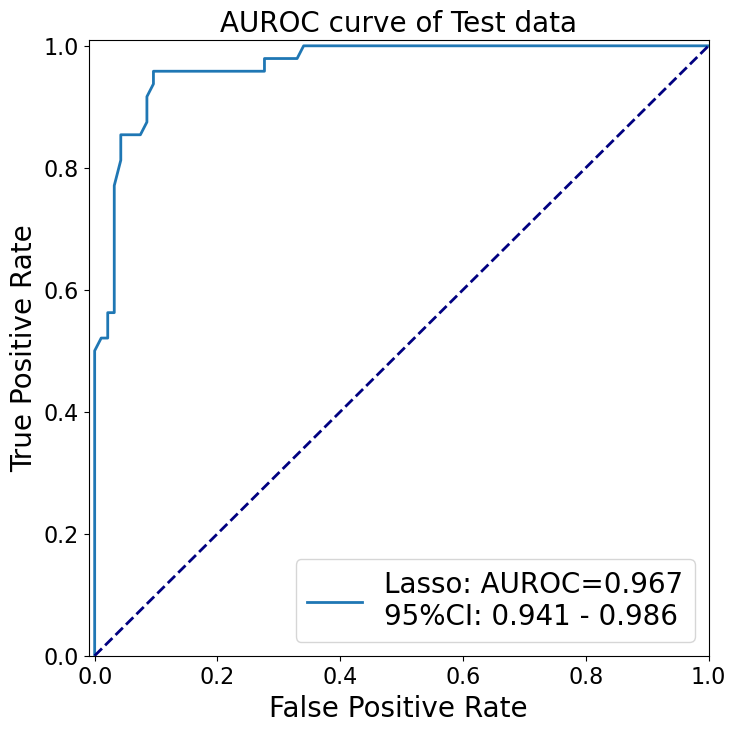

In [9]:
# Draw the AUROC curve for the test dataset
y_pred=prob[:,-1]
plt.figure(figsize=(8, 8))
exp_to_run='AUROC curve of Test data'
fpr, tpr, _ = roc_curve(ytest, y_pred)
r , l = CI(ytest, y_pred)
raw=roc_auc_score(ytest,y_pred)
tex = 'Lasso: AUROC={:0.3f}\n95%CI: {:0.3f} - {:0.3f}'.format(raw,r,l)
plt.plot(fpr, tpr, lw=2, label=tex)
    
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.01])
plt.xlabel('False Positive Rate', fontdict={'size'   : 20})
plt.ylabel('True Positive Rate', fontdict={'size'   : 20})
plt.title(exp_to_run, fontdict={'size'   : 20})
plt.yticks(size = 16) 
plt.xticks(size = 16)  
plt.legend(loc="lower right",fontsize=20)
plt.savefig("../../results/GC-diagnosis-model/Figures/{}_roc.pdf".format("Test"))
plt.show()

In [10]:
# calculate feature importances.
imp=model.feature_importances_
feature_importances=pd.concat([pd.DataFrame(Counts_metas['metas'][0:10]),pd.DataFrame(imp)],axis=1)
feature_importances.columns=['feature_name','importance_score']
feature_importances.to_excel("../../results/GC-diagnosis-model/GC-diagnosis-model-feature-importances.xlsx",index=False)

In [11]:
####### Using external test dataset to validate the model.
# read external test data
Xexternal_test = pd.read_excel('../../data/GC-diagnosis-model/Xexternal_test.xlsx',index_col=0)
yexternal_test = pd.read_excel('../../data/GC-diagnosis-model/yexternal_test.xlsx',index_col=0)

yexternal_test=pd.DataFrame(yexternal_test)
Xexternal_test.drop(['sample_id'],axis=1,inplace=True)
metas=list(Xexternal_test.columns)

yexternal_test = np.array(yexternal_test.state)
yexternal_test = yexternal_test.astype(np.float32)
Xexternal_test= Xexternal_test.values
print("test, normal-patients", np.unique(yexternal_test,return_counts=True))

external_test_s=[]
external_test_s1=[]
external_test_pred = model.predict(Xexternal_test[:,selected_feature_index])
external_test_prob = model.predict_proba(Xexternal_test[:,selected_feature_index])
print("ytest,pred:",yexternal_test,external_test_pred)
external_test_s.append(f1_score(yexternal_test, external_test_pred))
print("ytest,prob:",yexternal_test,external_test_prob[:,-1])
external_test_s1.append(roc_auc_score(yexternal_test, external_test_prob[:,-1]))
print("f1 score:", external_test_s)
print("auroc score:", external_test_s1)

test, normal-patients (array([0., 1.], dtype=float32), array([32, 63]))
ytest,pred: [1. 0. 1. 0. 0. 1. 0. 1. 1. 0. 1. 1. 0. 0. 1. 0. 0. 1. 0. 1. 1. 1. 1. 0.
 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 0. 1. 1. 1. 0. 0. 1.
 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 0. 1. 0. 1. 0.
 1. 1. 0. 1. 1. 0. 0. 1. 1. 1. 0. 1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1.] [1. 1. 1. 0. 0. 1. 1. 0. 1. 0. 1. 1. 0. 0. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1.
 1. 0. 1. 1. 0. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 0. 1. 0. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 0. 1. 1. 0. 1. 0.
 1. 1. 0. 1. 1. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 0.]
ytest,prob: [1. 0. 1. 0. 0. 1. 0. 1. 1. 0. 1. 1. 0. 0. 1. 0. 0. 1. 0. 1. 1. 1. 1. 0.
 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 0. 1. 1. 1. 0. 0. 1.
 1. 1. 1. 1. 1. 0. 0. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 0. 1. 0. 1. 0.
 1. 1. 0. 1. 1. 0. 0. 1. 1. 1. 0. 1. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1.] [0.73 0.78 0.58 0.17 0.1  0.68 0.5

auroc score: 0.9201388888888888
Confidence interval for the score: [0.868 - 0.965]


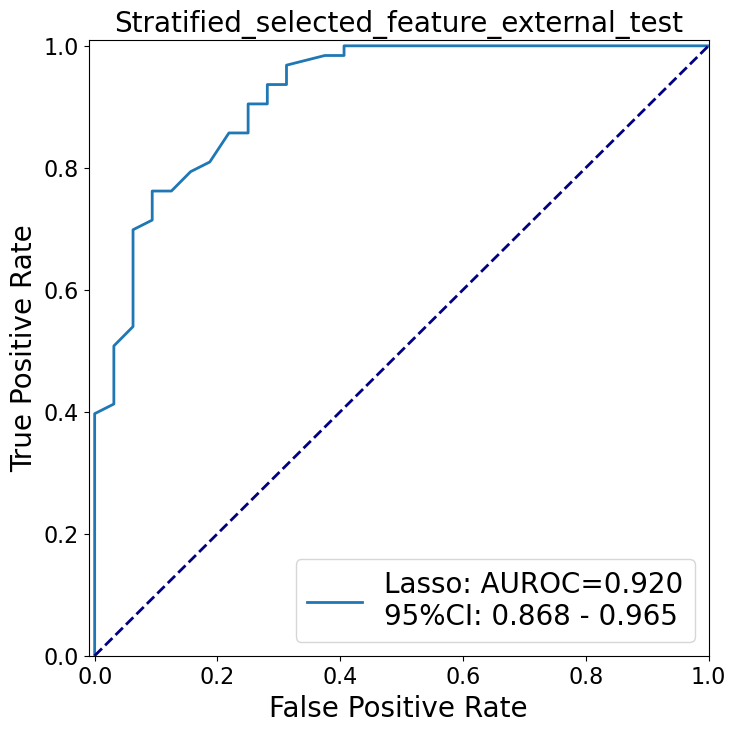

In [12]:
# Draw the AUROC curve for the external test dataset
y_pred_external=external_test_prob[:,-1]
plt.figure(figsize=(8, 8))
exp_to_run='Stratified_selected_feature_external_test'
fpr, tpr, _ = roc_curve(yexternal_test, y_pred_external)
r , l = CI(yexternal_test, y_pred_external)
raw=roc_auc_score(yexternal_test, y_pred_external)
tex = 'Lasso: AUROC={:0.3f}\n95%CI: {:0.3f} - {:0.3f}'.format(raw,r,l)
plt.plot(fpr, tpr, lw=2, label=tex)
    
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.01])
plt.xlabel('False Positive Rate', fontdict={'size'   : 20})
plt.ylabel('True Positive Rate', fontdict={'size'   : 20})
plt.title(exp_to_run, fontdict={'size'   : 20})
plt.yticks(size = 16) 
plt.xticks(size = 16)  
plt.legend(loc="lower right",fontsize=20)
plt.savefig("../../results/GC-diagnosis-model/Figures/{}_roc.pdf".format("External_test"))
plt.show()

In [13]:
# Save GC-diagnosis-model
import joblib
joblib.dump(model,'../../results/GC-diagnosis-model/Saved-model/GC-diagnosis-model.pkl')
GC_diagnosis_model = joblib.load('../../results/GC-diagnosis-model/Saved-model/GC-diagnosis-model.pkl')

In [14]:
# Save prediction score for test set and external test set.
# test set
Xtest = pd.read_excel('../../data/GC-diagnosis-model/Xtest.xlsx',index_col=0)
pred_score4test = Xtest.assign(state=ytest,pred_score=prob[:,-1])
pred_score4test.to_excel("../../results/GC-diagnosis-model/GC-diagnosis-model-pred-score-for-test.xlsx",index=False)
# external set
Xexternal_test = pd.read_excel('../../data/GC-diagnosis-model/Xexternal_test.xlsx',index_col=0)
pred_score4external_test = Xexternal_test.assign(state=yexternal_test,pred_score=external_test_prob[:,-1])
pred_score4test.to_excel("../../results/GC-diagnosis-model/GC-diagnosis-model-pred-score-for-external-test.xlsx",index=False)
